# Тестовое на прогноз спроса 

выдаем тестовое в команду прогноза
Данные (test_fcast.zip):

**test_fcast_qty.csv** - Динамика продаж товаров (все артикулы из одной товарной категории)
- article_id - id артикула
- Qty - продано штук
- Date - дата создания заказа
- Country - страна
- FinResult - финансовый результат от продажи (выручка)
 
**test_fcast_stock.csv** - Остатки на складе по артикулам
- article_id - id артикула
- Stock - остаток в штуках
- Date - дата записи остатка
 
**Задание**
- Проведите EDA анализ данных временных рядов
- Проведите прогноз на 6 месяцев вперед по топ 10 странам
- Проведите классификацию временных рядов по остаткам и продажам (на ваше усмотрение)
- Проведите прогноз спроса на ТОП - 100 артикулов

P.S: задания выполняйте на свое усмотрение, как вы поняли задачу. Дополнительные исследования будут плюсом

# EDA

In [1]:
import numpy as np
import pandas as pd
from pandas.api.types import is_numeric_dtype
from pandas.api.types import is_datetime64_any_dtype
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from tqdm.notebook import tqdm

c:\Users\Alex\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
sales = pd.read_csv(
    "test_fcast_sales.csv",
    encoding="windows-1251",
    sep=",",
    low_memory=False,
    decimal=".",  # чтобы сразу сохранять как дробные числа, а не как строки
    parse_dates=["Date"],
)
sales

,Date,Country,Qty,FinResult,article_id
0,2018-12-02,IT,2,5.92,343
1,2018-12-04,BN,2,5.92,343
2,2018-12-02,FI,2,5.92,343
3,2018-12-08,IT,2,5.92,343
4,2018-12-05,SE,2,5.92,343
...,...,...,...,...,...
868324,2020-03-10,DE,2,5.08,2110
868325,2020-03-16,DE,2,5.08,2110
868326,2020-03-02,CH,2,5.08,2110
868327,2020-03-09,SE,2,5.08,2110


In [3]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 868329 entries, 0 to 868328
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Date        868329 non-null  datetime64[ns]
 1   Country     868329 non-null  object        
 2   Qty         868329 non-null  int64         
 3   FinResult   868329 non-null  float64       
 4   article_id  868329 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 33.1+ MB


In [4]:
sales.describe()

,Qty,FinResult,article_id
count,868329.000000,868329.000000,868329.000000
mean,1.766906,5.052214,841.145101
std,1.060435,3.925986,563.578603
min,-28.000000,-81.480000,1.000000
25%,2.000000,3.640000,309.000000
50%,2.000000,5.040000,857.000000
75%,2.000000,6.880000,1322.000000
max,100.000000,271.600000,2154.000000


In [5]:
for param in sales.columns:
    print("Количество уникальных значений: ", param, "=", len(sales[param].unique()))
    print("Уникальные значения: ", np.sort(sales[param].unique()))
    print(
        "Самое частое значение:",
        sales[param].mode()[0],
        "с количеством:",
        sales[param].value_counts().iloc[0],
    )
    if is_numeric_dtype(sales[param]) or is_datetime64_any_dtype(sales[param]):
        print("Min:", sales[param].min(), "/", "Max:", sales[param].max())
    print("=" * 50)

Количество уникальных значений:  Date = 1014
Уникальные значения:  ['2017-06-30T00:00:00.000000000' '2017-07-01T00:00:00.000000000'
 '2017-07-02T00:00:00.000000000' ... '2020-04-06T00:00:00.000000000'
 '2020-04-07T00:00:00.000000000' '2020-04-08T00:00:00.000000000']
Самое частое значение: 2019-11-29 00:00:00 с количеством: 2861
Min: 2017-06-30 00:00:00 / Max: 2020-04-08 00:00:00
Количество уникальных значений:  Country = 30
Уникальные значения:  ['AT' 'BF' 'BG' 'BN' 'CF' 'CH' 'CZ' 'DE' 'DK' 'EE' 'ES' 'FI' 'FR' 'GB'
 'GR' 'HU' 'IT' 'LD' 'LF' 'LR' 'LT' 'LV' 'NL' 'NO' 'PL' 'PT' 'RO' 'SE'
 'SI' 'SK']
Самое частое значение: SE с количеством: 173684
Количество уникальных значений:  Qty = 32
Уникальные значения:  [-28 -20 -12 -10  -8  -6  -4  -3  -2  -1   1   2   3   4   6   8  10  12
  14  16  18  20  22  26  30  38  40  50  60  70  80 100]
Самое частое значение: 2 с количеством: 803662
Min: -28 / Max: 100
Количество уникальных значений:  FinResult = 2077
Уникальные значения:  [-81.48 -79.8 

In [6]:
stock = pd.read_csv(
    "test_fcast_stock.csv",
    encoding="windows-1251",
    sep=",",
    low_memory=False,
    decimal=".",  # чтобы сразу сохранять как дробные числа, а не как строки
    parse_dates=["Date"],
)
stock

,Date,Stock,article_id
0,2017-06-06,579,343
1,2017-06-07,575,343
2,2017-06-08,573,343
3,2017-06-09,573,343
4,2017-06-10,571,343
...,...,...,...
1647552,2020-04-03,213,2110
1647553,2020-04-04,213,2110
1647554,2020-04-05,213,2110
1647555,2020-04-07,215,2110


In [7]:
stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1647557 entries, 0 to 1647556
Data columns (total 3 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   Date        1647557 non-null  datetime64[ns]
 1   Stock       1647557 non-null  int64         
 2   article_id  1647557 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 37.7 MB


In [8]:
stock.describe().round(1)

,Stock,article_id
count,1647557.0,1647557.0
mean,142.4,1009.0
std,238.3,606.0
min,0.0,1.0
25%,38.0,490.0
50%,86.0,985.0
75%,162.0,1512.0
max,6780.0,2158.0


In [9]:
for param in stock.columns:
    print("Количество уникальных значений: ", param, "=", len(stock[param].unique()))
    print("Уникальные значения: ", np.sort(stock[param].unique()))
    print(
        "Самое частое значение:",
        stock[param].mode()[0],
        "с количеством:",
        stock[param].value_counts().iloc[0],
    )
    if is_numeric_dtype(stock[param]) or is_datetime64_any_dtype(stock[param]):
        print("Min:", stock[param].min(), "/", "Max:", stock[param].max())
    print("=" * 50)

Количество уникальных значений:  Date = 1034
Уникальные значения:  ['2017-06-06T00:00:00.000000000' '2017-06-07T00:00:00.000000000'
 '2017-06-08T00:00:00.000000000' ... '2020-04-05T00:00:00.000000000'
 '2020-04-07T00:00:00.000000000' '2020-04-08T00:00:00.000000000']
Самое частое значение: 2020-02-12 00:00:00 с количеством: 1957
Min: 2017-06-06 00:00:00 / Max: 2020-04-08 00:00:00
Количество уникальных значений:  Stock = 4022
Уникальные значения:  [   0    1    2 ... 6766 6776 6780]
Самое частое значение: 1 с количеством: 73038
Min: 0 / Max: 6780
Количество уникальных значений:  article_id = 2158
Уникальные значения:  [   1    2    3 ... 2156 2157 2158]
Самое частое значение: 19 с количеством: 1034
Min: 1 / Max: 2158


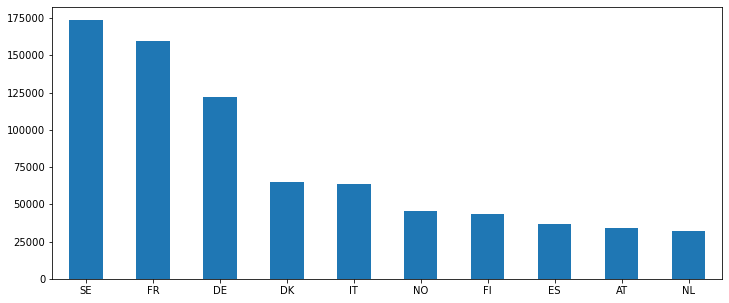

In [10]:
# top 10 countries
sales["Country"].value_counts()[:10].plot(kind="bar", figsize=(12, 5))
plt.xticks(rotation=0);

In [11]:
sales["Qty"].value_counts()

 2      803662
-2       53187
 4        5250
 1        3885
 6         774
-1         729
-4         316
 8         203
 10        170
 20         32
 12         27
-6          22
 40         17
-8          10
 14          8
 16          6
-10          4
 30          4
 3           3
-3           3
 70          2
 100         2
 80          2
 50          2
 22          2
-20          1
 18          1
-28          1
 60          1
 26          1
 38          1
-12          1
Name: Qty, dtype: int64

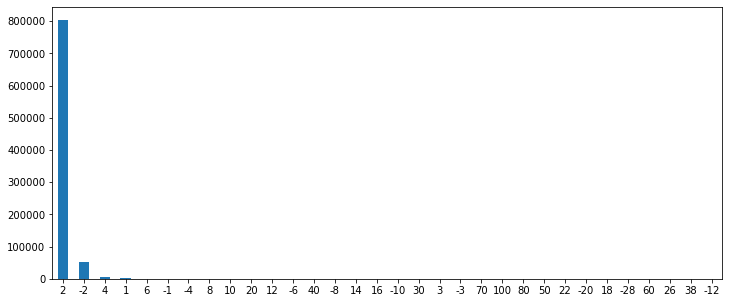

In [12]:
sales["Qty"].value_counts().plot(kind="bar", figsize=(12, 5))
plt.xticks(rotation=0);

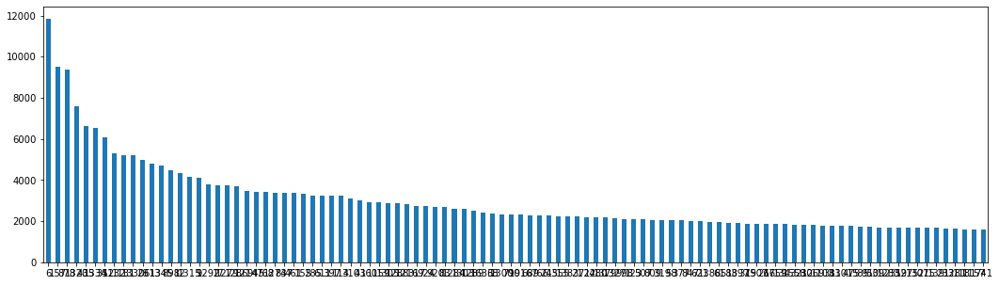

In [13]:
# top 100 articles
sales["article_id"].value_counts()[:100].plot(kind="bar", figsize=(18, 5))
plt.xticks(rotation=0);

In [14]:
sales["article_id"].value_counts()[:100]

6       11845
157      9491
878      9351
1320     7595
435      6629
        ...  
233      1623
1281     1616
1181     1615
1157     1609
741      1581
Name: article_id, Length: 100, dtype: int64

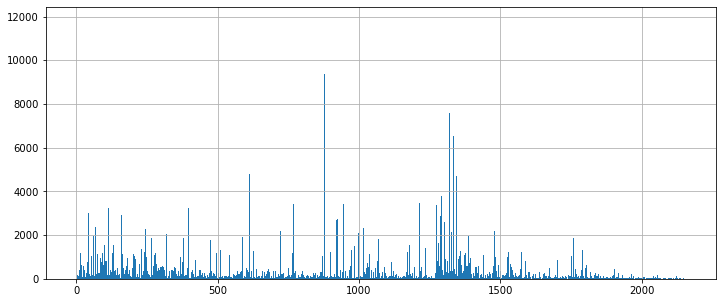

In [15]:
sales["article_id"].hist(bins=2154, figsize=(12, 5));

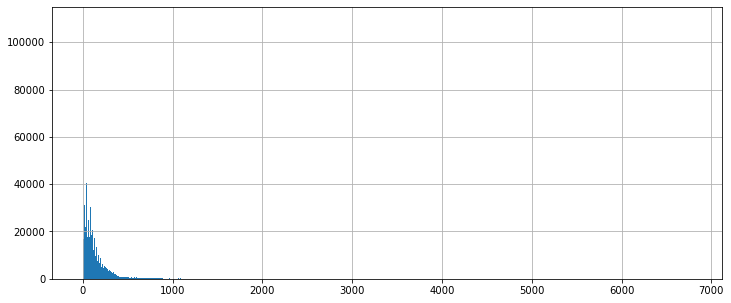

In [16]:
stock["Stock"].hist(bins=2154, figsize=(12, 5));

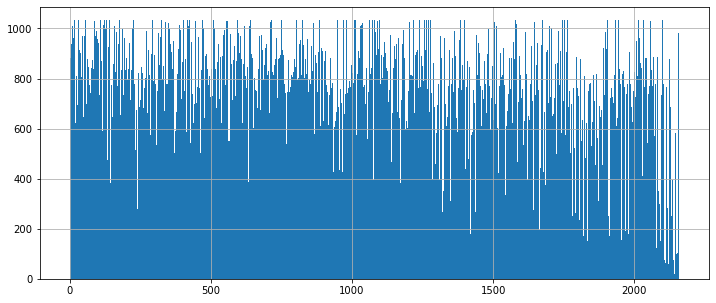

In [17]:
stock["article_id"].hist(bins=2158, figsize=(12, 5));

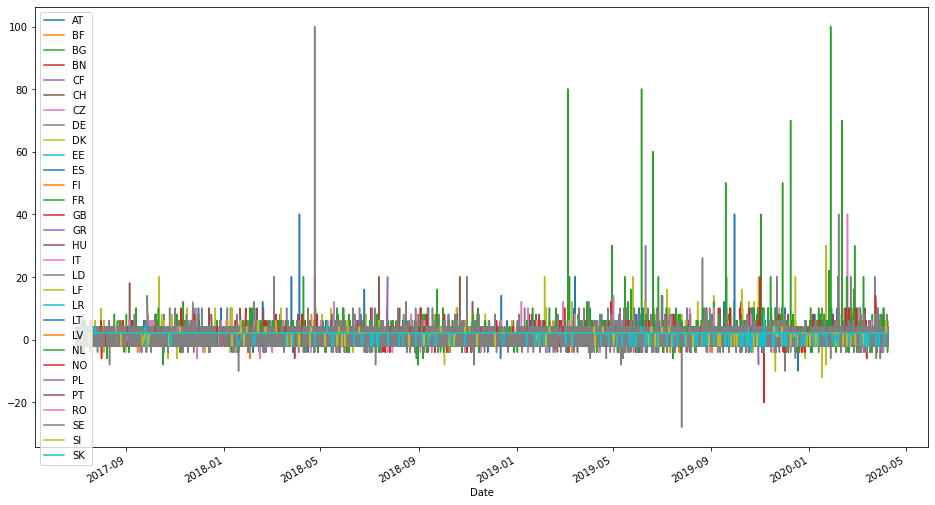

In [18]:
fig, ax = plt.subplots(figsize=(16, 9))

for key, grp in sales.groupby(["Country"]):
    ax = grp.plot(ax=ax, kind="line", x="Date", y="Qty", label=key)
plt.legend(loc="best")
plt.show()

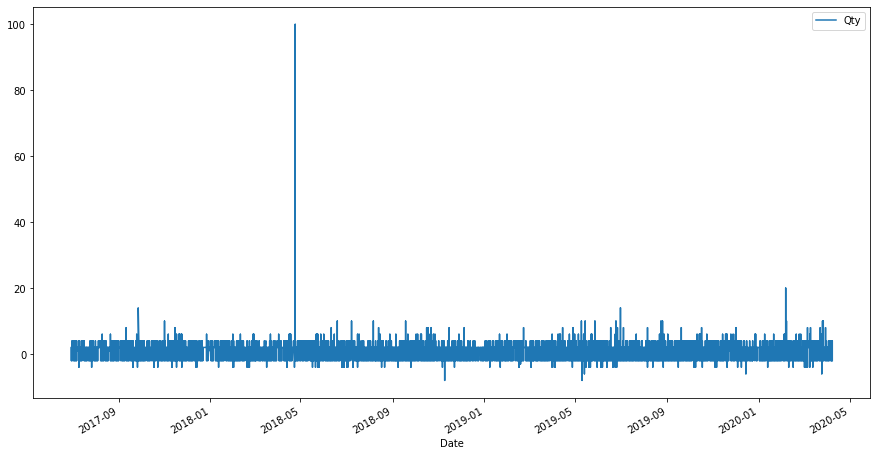

In [19]:
sales[sales["Country"] == "SE"].plot(x="Date", y="Qty", figsize=(15, 8));

**Выводы**
- Sales (продажи) и Stock (остатки на складах) представлены за период `до 08.04.2020`
- Продажи начинаются с `30.06.2020`
- Остатки на складах начинаются `с 06.06.2017`
- Количество продаж варьируется `от -28 до 100` (отрицательные продажи - возвраты?)
- В продажах `2154 товаров`
- На складах `2158 товаров`

# Feature engeneering

In [20]:
country_sales = sales.groupby(["Country", "article_id"])[
    "Date", "FinResult", "Qty"
].agg({"Date": ["min", "max"], "FinResult": "mean", "Qty": "sum"})

country_sales

C:\Users\Alex\AppData\Local\Temp/ipykernel_17088/2569708211.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  country_sales = sales.groupby(["Country", "article_id"])[


Date             FinResult Qty
                          min        max       mean sum
Country article_id                                     
AT      1          2017-07-12 2020-02-24   2.266667   4
        2          2017-10-22 2020-01-29   8.227143  52
        3          2017-11-05 2020-03-15   4.085455  14
        4          2018-10-07 2019-05-17   5.440000  12
        5          2017-08-01 2020-02-03   6.171935  53
...                       ...        ...        ...  ..
SK      2075       2018-05-23 2018-05-23   9.640000   2
        2088       2019-10-02 2019-10-02   2.440000   2
        2091       2018-10-12 2018-10-12  11.620000   2
        2107       2020-04-07 2020-04-07   3.240000   2
        2124       2017-09-12 2017-09-12   5.880000   2

[37108 rows x 4 columns]

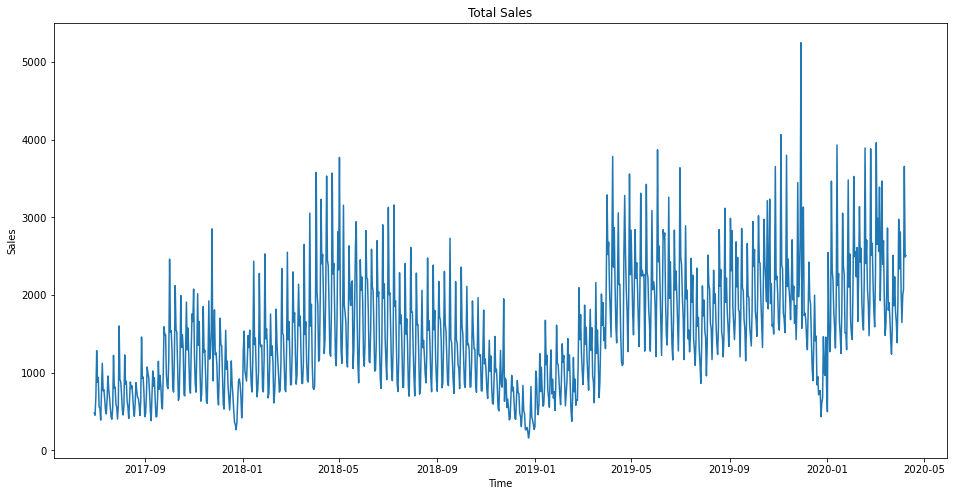

In [21]:
ts = sales.groupby(["Date"])["Qty"].sum()
plt.figure(figsize=(16, 8))
plt.title("Total Sales")
plt.xlabel("Time")
plt.ylabel("Sales")
plt.plot(ts);

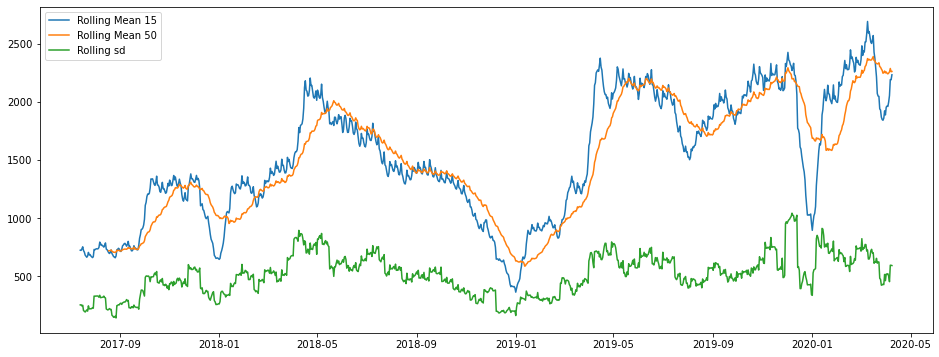

In [22]:
plt.figure(figsize=(16, 6))
plt.plot(ts.rolling(window=15, center=False).mean(), label="Rolling Mean 15")
plt.plot(ts.rolling(window=50, center=False).mean(), label="Rolling Mean 50")
plt.plot(ts.rolling(window=15, center=False).std(), label="Rolling sd")
plt.legend();

In [23]:
sales.head()

,Date,Country,Qty,FinResult,article_id
0,2018-12-02,IT,2,5.92,343
1,2018-12-04,BN,2,5.92,343
2,2018-12-02,FI,2,5.92,343
3,2018-12-08,IT,2,5.92,343
4,2018-12-05,SE,2,5.92,343


In [24]:
sales.groupby(["Country"])["Qty", "FinResult"].sum()

C:\Users\Alex\AppData\Local\Temp/ipykernel_17088/2434543344.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  sales.groupby(["Country"])["Qty", "FinResult"].sum()


,Qty,FinResult
Country,,
AT,57911,165741.47
BF,5887,16887.25
BG,1725,5220.23
BN,27542,78631.66
CF,532,1599.30
CH,22305,68461.43
CZ,5173,14678.29
DE,199635,564518.57
DK,118784,308137.43


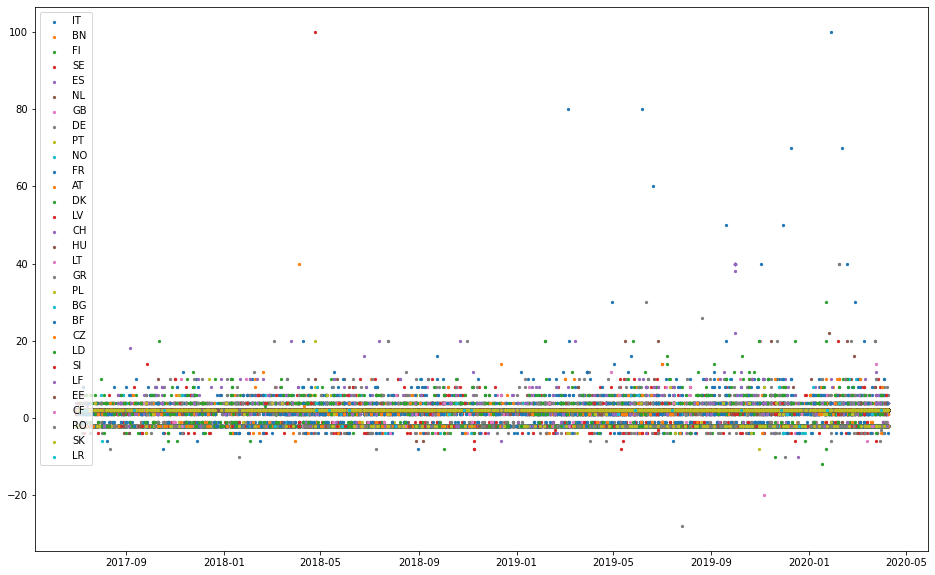

In [25]:
plt.figure(figsize=(16, 10))

for country in sales["Country"].unique():
    plt.scatter(
        sales[sales["Country"] == country]["Date"],
        sales[sales["Country"] == country]["Qty"],
        label=country,
        s=5,
    )

plt.legend(loc="upper left")
plt.show();

**Выводы**
- Имеется тенденция роста продаж с января по апрель
- Тенденция снижения продаж с мая по декабрь
- Минимумы продаж - в январе
- Максимумы продаж - в апреле
- Снижене продаж за вторую половину 2019 года не такое сильное как в 2018 году
- В целом "тренд" можно считать восходящим

## Проверка на стационарность

Стационарность - это постоянство (неизменчивость) ряда во времени.

Когда временной ряд является стационарным, его легче моделировать. Методы статистического моделирования предполагают или требуют, чтобы временной ряд был стационарным.

Существует несколько тестов, которые можно использовать для проверки стационарности:
- ADF (Augmented Dicky Fuller Test)
- KPSS
- PP (тест Филлипса-Перрона).

Давайте проведем ADF, который является наиболее часто используемым.

<Figure size 1008x432 with 0 Axes>

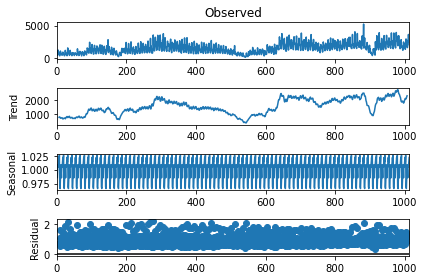

In [26]:
import statsmodels.api as sm

res = sm.tsa.seasonal_decompose(ts.values, period=12, model="multiplicative")
plt.figure(figsize=(14, 6))
fig = res.plot();

<Figure size 1008x432 with 0 Axes>

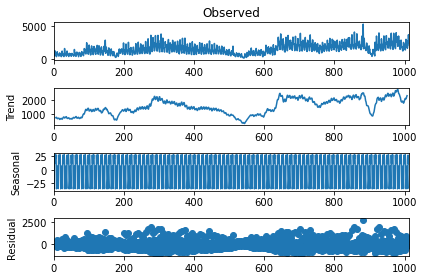

In [27]:
res = sm.tsa.seasonal_decompose(ts.values, period=12, model="additive")
plt.figure(figsize=(14, 6))
fig = res.plot();

In [28]:
from statsmodels.tsa.stattools import adfuller, acf, pacf, arma_order_select_ic

In [29]:
# Stationarity tests
def test_stationarity(timeseries):

    # Perform Dickey-Fuller test:
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)


test_stationarity(ts)

Results of Dickey-Fuller Test:
Test Statistic                  -2.315512
p-value                          0.167014
#Lags Used                      21.000000
Number of Observations Used    992.000000
Critical Value (1%)             -3.436959
Critical Value (5%)             -2.864458
Critical Value (10%)            -2.568324
dtype: float64


In [30]:
# to remove trend

# create a differenced series
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return pd.Series(diff)


# invert differenced forecast
def inverse_difference(last_ob, value):
    return value + last_ob

[]

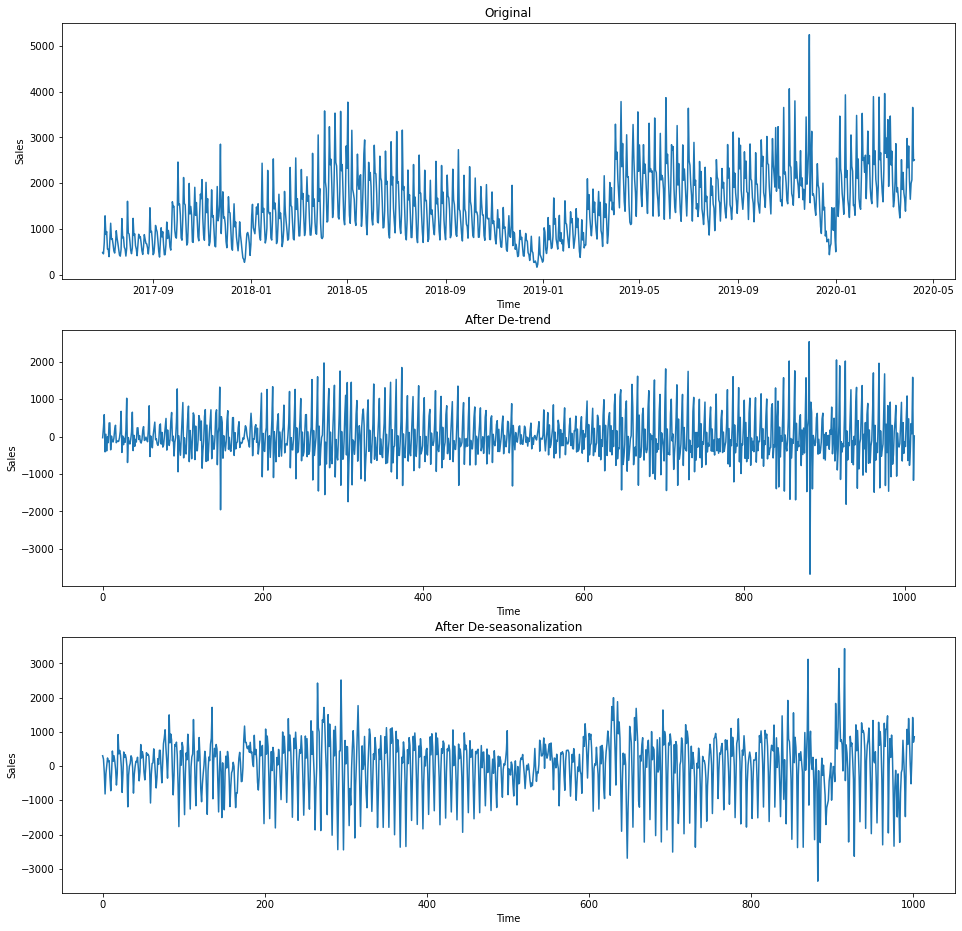

In [31]:
ts = sales.groupby(["Date"])["Qty"].sum()
ts.astype("float")
plt.figure(figsize=(16, 16))
plt.subplot(311)
plt.title("Original")
plt.xlabel("Time")
plt.ylabel("Sales")
plt.plot(ts)
plt.subplot(312)
plt.title("After De-trend")
plt.xlabel("Time")
plt.ylabel("Sales")
new_ts = difference(ts)
plt.plot(new_ts)
plt.plot()

plt.subplot(313)
plt.title("After De-seasonalization")
plt.xlabel("Time")
plt.ylabel("Sales")
new_ts = difference(ts, 12)  # assuming the seasonality is 12 months long
plt.plot(new_ts)
plt.plot()

In [32]:
# now testing the stationarity again after de-seasonality
test_stationarity(new_ts)

Results of Dickey-Fuller Test:
Test Statistic                -7.993768e+00
p-value                        2.434969e-12
#Lags Used                     2.200000e+01
Number of Observations Used    9.790000e+02
Critical Value (1%)           -3.437047e+00
Critical Value (5%)           -2.864497e+00
Critical Value (10%)          -2.568344e+00
dtype: float64


Теперь после трансформации p-value теста Дика-Фуллера меньше 5 %. Следовательно ряд стационарен.

## Prophet

In [33]:
ts = sales.groupby(["Date"])["Qty"].sum()

# prophet reqiures a pandas df with Date column named as ds and the value column as y
ts = ts.reset_index()
ts.columns = ["ds", "y"]
ts

,ds,y
0,2017-06-30,482
1,2017-07-01,453
2,2017-07-02,697
3,2017-07-03,1284
4,2017-07-04,877
...,...,...
1009,2020-04-04,1994
1010,2020-04-05,2070
1011,2020-04-06,3655
1012,2020-04-07,2488


In [34]:
from prophet import Prophet

# instantiate Prophet with only yearly seasonality as our data is monthly
model = Prophet(yearly_seasonality=True)
model.fit(ts)

11:08:45 - cmdstanpy - INFO - Chain [1] start processing
11:08:45 - cmdstanpy - INFO - Chain [1] done processing


In [35]:
# predict for 6 months in the furure and MS - month start is the frequency
future = model.make_future_dataframe(periods=6, freq="MS")
# now lets make the forecasts
forecast = model.predict(future)
# yhat - prediction
# yhat_lower, yhat_upper - uncertanty intervals
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

,ds,yhat,yhat_lower,yhat_upper
1015,2020-06-01,3889.211350,3450.649749,4340.688528
1016,2020-07-01,3230.201888,2806.995264,3676.968882
1017,2020-08-01,2163.948796,1745.061379,2601.151650
1018,2020-09-01,3013.744995,2552.177518,3454.424027
1019,2020-10-01,2890.311434,2388.749625,3364.501289


In [36]:
# forecast DataFrame (yhat - forecast) plus components
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-06-30,609.558970,95.073186,998.829584,609.558970,609.558970,-67.347343,-67.347343,-67.347343,-349.476729,-349.476729,-349.476729,282.129386,282.129386,282.129386,0.0,0.0,0.0,542.211627
1,2017-07-01,614.496875,-105.562196,759.487360,614.496875,614.496875,-294.309465,-294.309465,-294.309465,-565.187898,-565.187898,-565.187898,270.878433,270.878433,270.878433,0.0,0.0,0.0,320.187410
2,2017-07-02,619.434780,287.679161,1203.676985,619.434780,619.434780,127.753017,127.753017,127.753017,-130.580727,-130.580727,-130.580727,258.333743,258.333743,258.333743,0.0,0.0,0.0,747.187797
3,2017-07-03,624.372685,1251.145040,2103.150214,624.372685,624.372685,1053.286047,1053.286047,1053.286047,808.745061,808.745061,808.745061,244.540986,244.540986,244.540986,0.0,0.0,0.0,1677.658732
4,2017-07-04,629.310590,570.644783,1412.655890,629.310590,629.310590,360.839618,360.839618,360.839618,131.265932,131.265932,131.265932,229.573686,229.573686,229.573686,0.0,0.0,0.0,990.150208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015,2020-06-01,2649.295793,3450.649749,4340.688528,2629.417386,2670.820038,1239.915557,1239.915557,1239.915557,808.745061,808.745061,808.745061,431.170496,431.170496,431.170496,0.0,0.0,0.0,3889.211350
1016,2020-07-01,2729.139600,2806.995264,3676.968882,2685.817651,2774.169341,501.062289,501.062289,501.062289,233.200038,233.200038,233.200038,267.862250,267.862250,267.862250,0.0,0.0,0.0,3230.201888
1017,2020-08-01,2811.644867,1745.061379,2601.151650,2742.965880,2887.079800,-647.696070,-647.696070,-647.696070,-565.187898,-565.187898,-565.187898,-82.508172,-82.508172,-82.508172,0.0,0.0,0.0,2163.948796
1018,2020-09-01,2894.150134,2552.177518,3454.424027,2793.780041,3008.350809,119.594861,119.594861,119.594861,131.265932,131.265932,131.265932,-11.671071,-11.671071,-11.671071,0.0,0.0,0.0,3013.744995


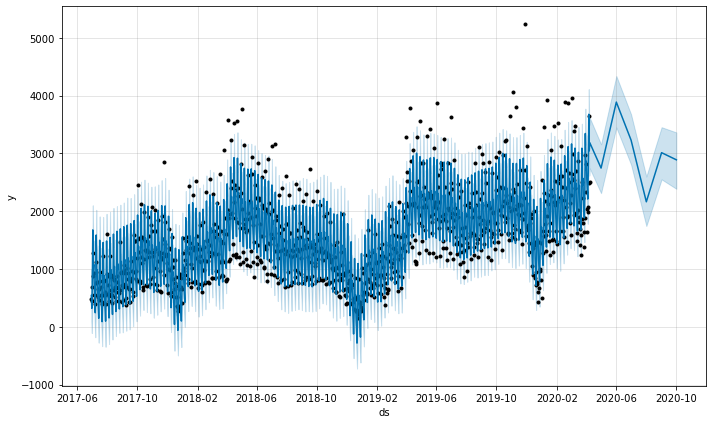

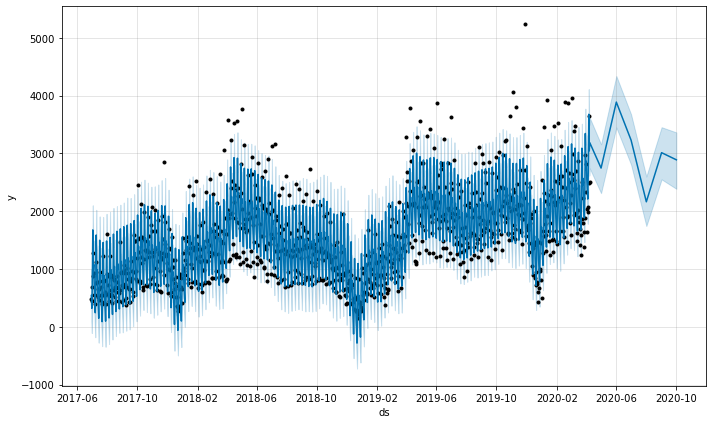

In [37]:
# forecast
model.plot(forecast)

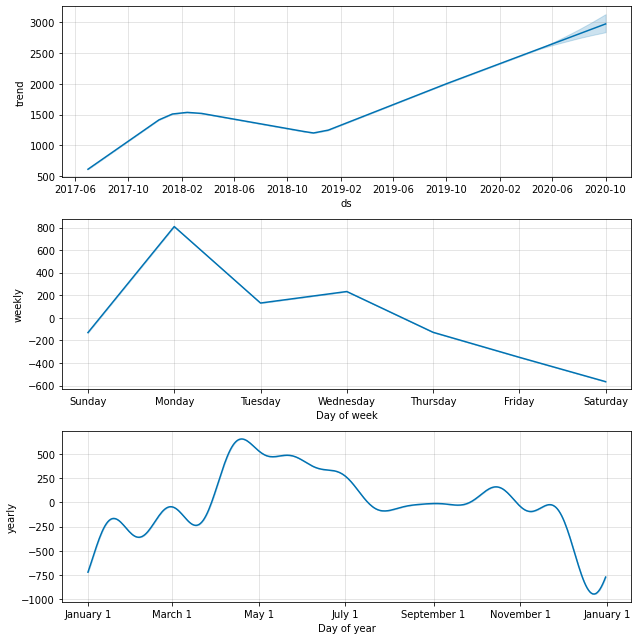

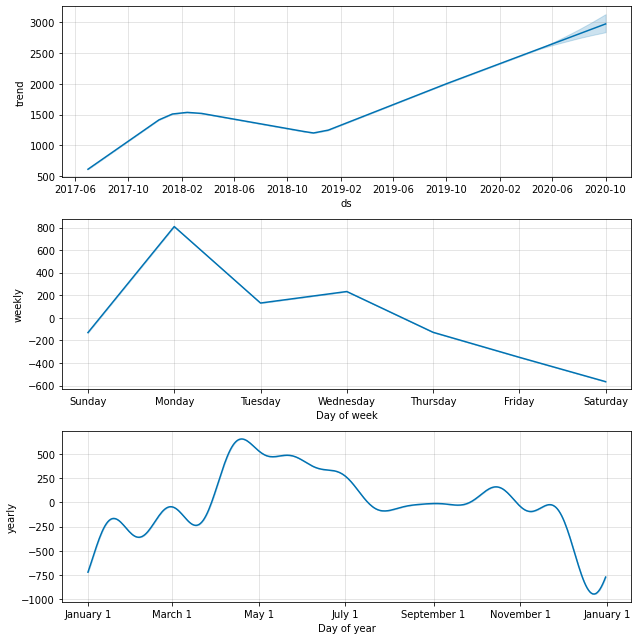

In [38]:
# see the forecast broken down into trend, weekly seasonality, and yearly seasonality
model.plot_components(forecast)

## Прогноз на 6 месяцев вперед по топ 10 странам

In [39]:
sales

,Date,Country,Qty,FinResult,article_id
0,2018-12-02,IT,2,5.92,343
1,2018-12-04,BN,2,5.92,343
2,2018-12-02,FI,2,5.92,343
3,2018-12-08,IT,2,5.92,343
4,2018-12-05,SE,2,5.92,343
...,...,...,...,...,...
868324,2020-03-10,DE,2,5.08,2110
868325,2020-03-16,DE,2,5.08,2110
868326,2020-03-02,CH,2,5.08,2110
868327,2020-03-09,SE,2,5.08,2110


In [40]:
# top 10 countries
top_10 = sales["Country"].value_counts()[:10].index.to_list()
top_10

['SE', 'FR', 'DE', 'DK', 'IT', 'NO', 'FI', 'ES', 'AT', 'NL']

In [41]:
# top 100 articles
top_100 = sales["article_id"].value_counts()[:100].index.to_list()

In [42]:
def monthly_sales(df, date, sales_number):
    """ Monthly sales

    Args:
        df : dataframe
        date string: name of column with Date
        sales_number string: name of column with number of sales

    Returns:
        pd.DataFrame: monthly sales
    """
    monthly_data = df.copy()
    monthly_data[date] = monthly_data[date].apply(lambda x: str(x)[:-12])
    monthly_data = monthly_data.groupby(date)[sales_number].sum().reset_index()
    monthly_data[date] = pd.to_datetime(monthly_data[date])
    return monthly_data

In [43]:
# create dataframe for transformation from time series to supervised
def generate_supervised(data, lag):
    df = data.copy()

    df["sales_diff"] = df["Qty"].diff()
    df = df.dropna()

    # create column for each lag
    for i in range(1, lag):
        col_name = "lag_" + str(i)
        df[col_name] = df["sales_diff"].shift(i)

    # drop null values
    df = df.dropna().reset_index(drop=True)

    return df

## Суммарный прогноз

In [44]:
ts = pd.DataFrame(sales.groupby(["Date"])["Qty"].sum(), columns=["Qty"])
ts.reset_index()

,Date,Qty
0,2017-06-30,482
1,2017-07-01,453
2,2017-07-02,697
3,2017-07-03,1284
4,2017-07-04,877
...,...,...
1009,2020-04-04,1994
1010,2020-04-05,2070
1011,2020-04-06,3655
1012,2020-04-07,2488


In [45]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """ Transform series to supervised dataset
    Args:
        data (np.array): input array
        n_in (int, optional): how many lags generate. Defaults to 1.
        n_out (int, optional): how many lags generate. Defaults to 1.
        dropnan (bool, optional): drop NaNs. Defaults to True.
    Returns:
        _type_: _description_
    """
    df = pd.DataFrame(data)
    cols = []
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

In [46]:
ts = pd.DataFrame(sales.groupby(["Date"])["Qty"].sum(), columns=["Qty"]).reset_index()

values = ts["Qty"].values

prediction_length = 10

last_date = ts["Date"].max()

prediction = pd.DataFrame(columns=["Date", "Qty"])

for predict_num in range(6):
    # add a month to the last date
    last_date += pd.DateOffset(months=1)

    # transform the time series data into supervised learning
    train = series_to_supervised(values, n_in=prediction_length)

    # split into input and output columns
    trainX, trainy = train[:, :-1], train[:, -1]

    # fit model
    model = XGBRegressor(objective='reg:squarederror', n_estimators=100)
    model.fit(trainX, trainy)

    # construct an input for a new preduction
    row = values[-prediction_length:].flatten()

    # make a one-step prediction
    yhat = model.predict(np.asarray([row]))[0]
    
    values = np.append(values, yhat)

    prediction.loc[predict_num] = [last_date, yhat]

In [47]:
prediction

,Date,Qty
0,2020-05-08,2114.909424
1,2020-06-08,1694.059692
2,2020-07-08,1680.319092
3,2020-08-08,1820.739258
4,2020-09-08,2822.163086
5,2020-10-08,2341.283936


In [48]:
def plot_res(results, original_df, sub_title):
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.lineplot(
        x=original_df["Date"],
        y=original_df["Qty"],
        data=original_df,
        ax=ax,
        label="True",
        color="mediumblue",
    )
    sns.lineplot(
        x=results["Date"],
        y=results["Qty"],
        data=results,
        ax=ax,
        label="Predicted",
        color="Red",
    )
    ax.set(
        xlabel="Date",
        ylabel="Sales",
        title=f"{sub_title} - Sales Forecasting Prediction",
    )
    ax.legend()
    sns.despine()
    plt.show()

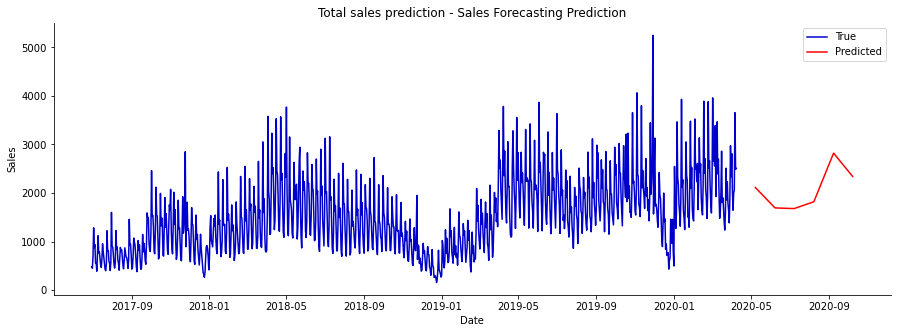

In [49]:
plot_res(prediction, ts, "Total sales prediction")

## Прогноз продаж по top 10 странам

In [50]:
sales

,Date,Country,Qty,FinResult,article_id
0,2018-12-02,IT,2,5.92,343
1,2018-12-04,BN,2,5.92,343
2,2018-12-02,FI,2,5.92,343
3,2018-12-08,IT,2,5.92,343
4,2018-12-05,SE,2,5.92,343
...,...,...,...,...,...
868324,2020-03-10,DE,2,5.08,2110
868325,2020-03-16,DE,2,5.08,2110
868326,2020-03-02,CH,2,5.08,2110
868327,2020-03-09,SE,2,5.08,2110


In [51]:
cs_df = pd.DataFrame(
    columns=["Country", "Daily sales", "Monthly sales", "Daily supervised", "prediction"]
)

i = 0
for country in tqdm(top_10):
    country_daily_sales = sales[sales["Country"] == country]
    country_monthly_sales = monthly_sales(country_daily_sales, "Date", "Qty")

    values = country_monthly_sales["Qty"].values

    prediction_length = 10

    last_date = country_monthly_sales["Date"].max()

    prediction = pd.DataFrame(columns=["Date", "Qty"])

    for predict_num in range(6):
        # add a month to the last date
        last_date += pd.DateOffset(months=1)

        # transform the time series data into supervised learning
        train = series_to_supervised(values, n_in=prediction_length)

        # split into input and output columns
        trainX, trainy = train[:, :-1], train[:, -1]

        # fit model
        model = XGBRegressor(objective='reg:squarederror', n_estimators=100)
        model.fit(trainX, trainy)

        # construct an input for a new preduction
        row = values[-prediction_length:].flatten()

        # make a one-step prediction
        yhat = model.predict(np.asarray([row]))[0]
        
        values = np.append(values, yhat)

        prediction.loc[predict_num] = [last_date, yhat]

    cs_df.loc[i] = [country, country_daily_sales, country_monthly_sales, train, prediction]
    i += 1

cs_df.head(2)

  0%|          | 0/10 [00:00<?, ?it/s]

,Country,Daily sales,Monthly sales,Daily supervised,prediction
0,SE,Date Country Qty FinResult art...,Date Qty 0 2017-06-01 104 1 2...,"[[104.0, 5190.0, 6179.0, 7017.0, 10059.0, 8692...",Date Qty 0 2020-05-01 3710...
1,FR,Date Country Qty FinResult art...,Date Qty 0 2017-06-01 80 1 2...,"[[80.0, 2728.0, 2687.0, 2934.0, 5161.0, 5707.0...",Date Qty 0 2020-05-01 3439...


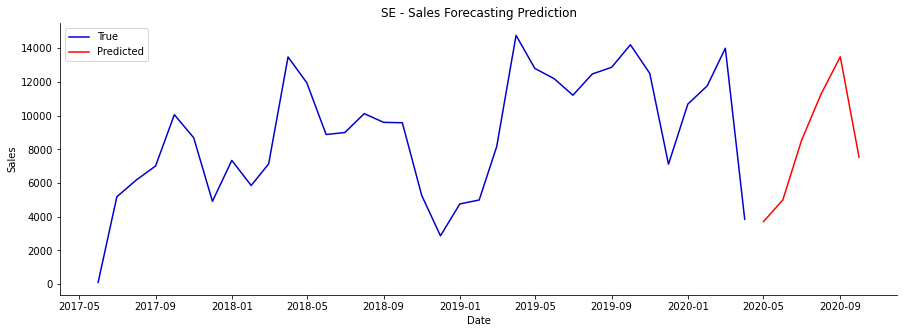

        Date           Qty
0 2020-05-01   3710.255615
1 2020-06-01   5000.129883
2 2020-07-01   8536.506836
3 2020-08-01  11263.782227
4 2020-09-01  13498.664062
5 2020-10-01   7542.487305


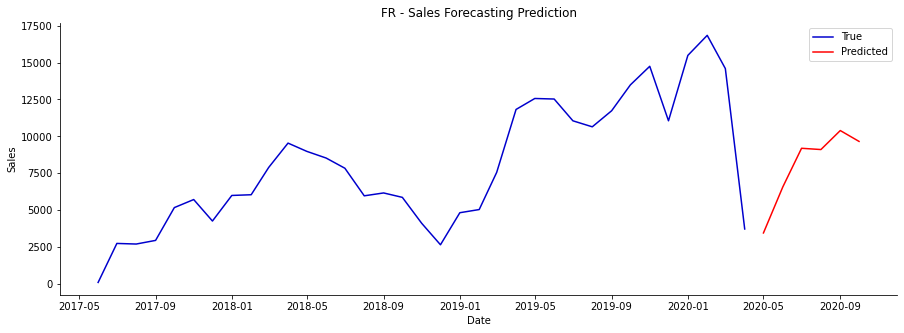

        Date           Qty
0 2020-05-01   3439.189697
1 2020-06-01   6563.572266
2 2020-07-01   9186.759766
3 2020-08-01   9100.957031
4 2020-09-01  10390.548828
5 2020-10-01   9653.793945


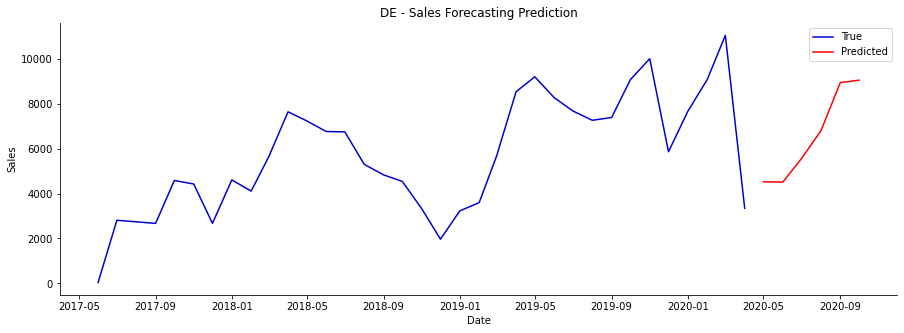

        Date          Qty
0 2020-05-01  4526.922363
1 2020-06-01  4511.699219
2 2020-07-01  5564.604492
3 2020-08-01  6798.225098
4 2020-09-01  8945.001953
5 2020-10-01  9051.482422


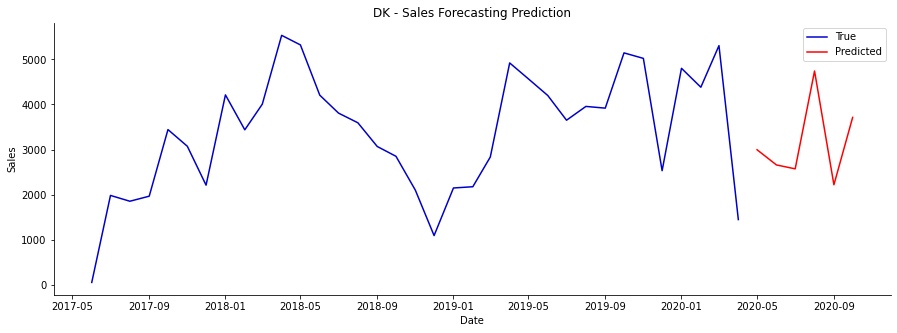

        Date          Qty
0 2020-05-01  2994.312744
1 2020-06-01  2657.650635
2 2020-07-01  2570.737793
3 2020-08-01  4741.490234
4 2020-09-01  2217.748047
5 2020-10-01  3712.095459


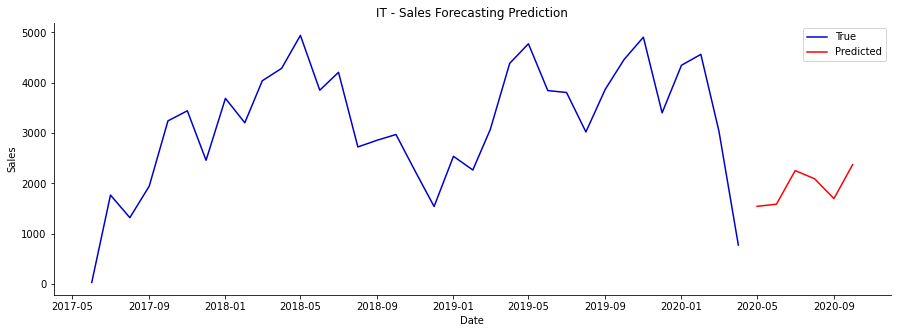

        Date          Qty
0 2020-05-01  1543.886963
1 2020-06-01  1586.798462
2 2020-07-01  2254.019775
3 2020-08-01  2092.514160
4 2020-09-01  1698.080078
5 2020-10-01  2372.033447


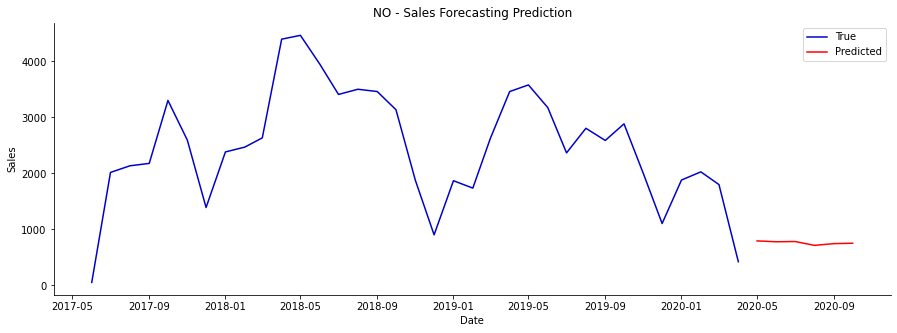

        Date         Qty
0 2020-05-01  795.589661
1 2020-06-01  780.333923
2 2020-07-01  784.630493
3 2020-08-01  715.726868
4 2020-09-01  747.031006
5 2020-10-01  754.190613


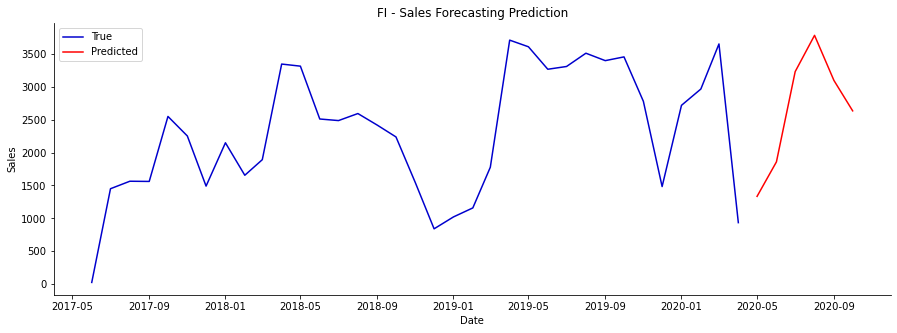

        Date          Qty
0 2020-05-01  1333.982056
1 2020-06-01  1858.708008
2 2020-07-01  3231.825684
3 2020-08-01  3783.732666
4 2020-09-01  3098.212402
5 2020-10-01  2634.944092


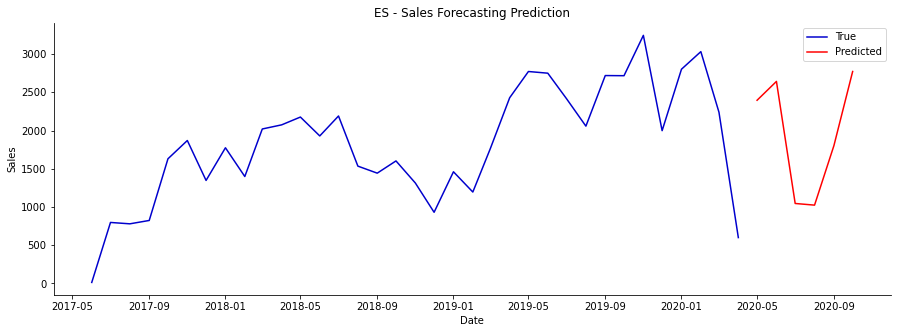

        Date          Qty
0 2020-05-01  2395.765869
1 2020-06-01  2642.243652
2 2020-07-01  1045.304077
3 2020-08-01  1023.592773
4 2020-09-01  1802.153809
5 2020-10-01  2772.043945


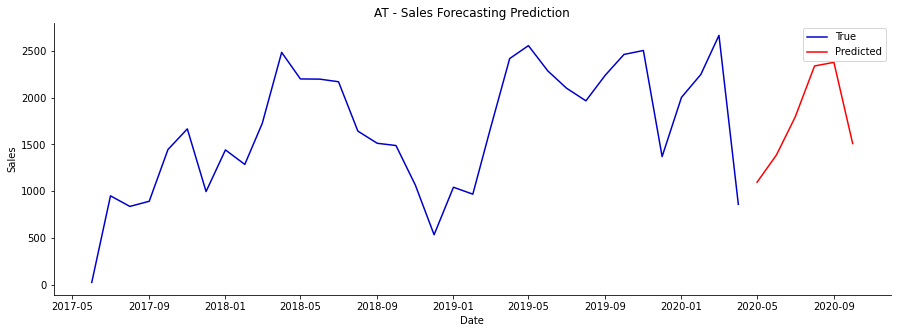

        Date          Qty
0 2020-05-01  1095.873779
1 2020-06-01  1387.152588
2 2020-07-01  1792.654297
3 2020-08-01  2338.664795
4 2020-09-01  2377.447754
5 2020-10-01  1509.469482


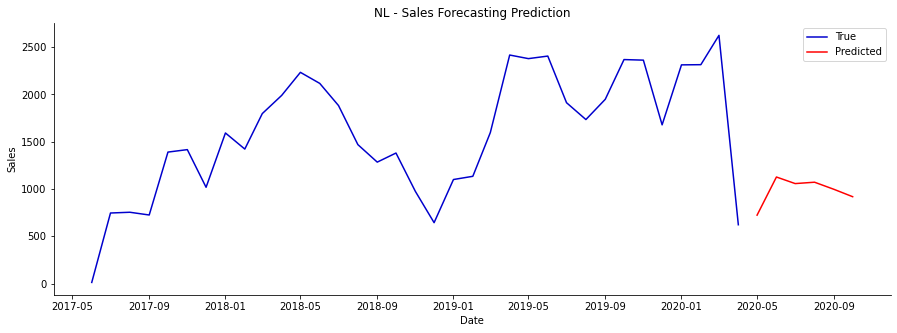

        Date          Qty
0 2020-05-01   723.404724
1 2020-06-01  1126.609253
2 2020-07-01  1057.036133
3 2020-08-01  1071.548462
4 2020-09-01   996.520386
5 2020-10-01   918.377014


In [52]:
for index, row in cs_df.iterrows():
    plot_res(cs_df.loc[index][4], cs_df.loc[index][2], cs_df.loc[index]["Country"])
    print(cs_df.loc[index][4])

## Прогноз спроса top-100 артикулов на основе продаж

In [53]:
is_df = pd.DataFrame(
    columns=["article", "Daily sales", "Monthly sales", "Daily supervised", "prediction"]
)

i = 0
for article in tqdm(top_100):
    article_daily_sales = sales[sales["article_id"] == article]
    article_monthly_sales = monthly_sales(article_daily_sales, "Date", "Qty")

    values = article_monthly_sales["Qty"].values

    prediction_length = 10

    last_date = article_monthly_sales["Date"].max()

    prediction = pd.DataFrame(columns=["Date", "Qty"])

    for predict_num in range(6):
        # add a month to the last date
        last_date += pd.DateOffset(months=1)
        
        # transform the time series data into supervised learning
        train = series_to_supervised(values, n_in=prediction_length)

        # split into input and output columns
        trainX, trainy = train[:, :-1], train[:, -1]

        # fit model
        model = XGBRegressor(objective='reg:squarederror', n_estimators=100)
        model.fit(trainX, trainy)

        # construct an input for a new preduction
        row = values[-prediction_length:].flatten()

        # make a one-step prediction
        yhat = model.predict(np.asarray([row]))[0]
        
        values = np.append(values, yhat)

        prediction.loc[predict_num] = [last_date, yhat]

    is_df.loc[i] = [article, article_daily_sales, article_monthly_sales, train, prediction]
    i += 1

is_df.head(2)

  0%|          | 0/100 [00:00<?, ?it/s]

,article,Daily sales,Monthly sales,Daily supervised,prediction
0,6,Date Country Qty FinResult art...,Date Qty 0 2017-09-01 164 1 201...,"[[164.0, 514.0, 702.0, 546.0, 573.0, 572.0, 86...",Date Qty 0 2020-05-01 687.296...
1,157,Date Country Qty FinResult arti...,Date Qty 0 2017-06-01 18 1 201...,"[[18.0, 748.0, 860.0, 321.0, -32.0, 150.0, 216...",Date Qty 0 2020-05-01 385.8...


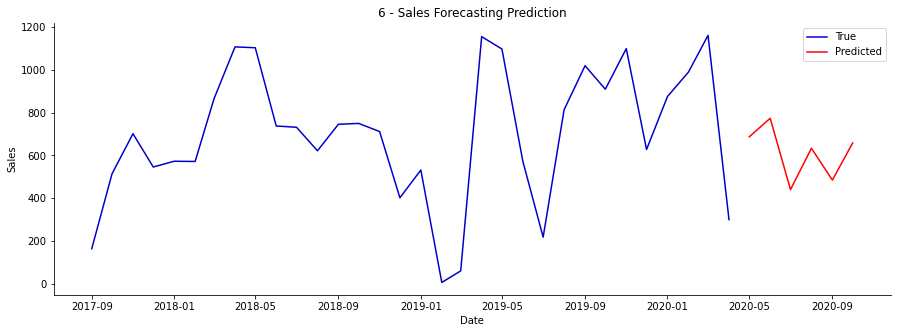

        Date         Qty
0 2020-05-01  687.296814
1 2020-06-01  774.251953
2 2020-07-01  440.093811
3 2020-08-01  633.756348
4 2020-09-01  484.806641
5 2020-10-01  658.526245


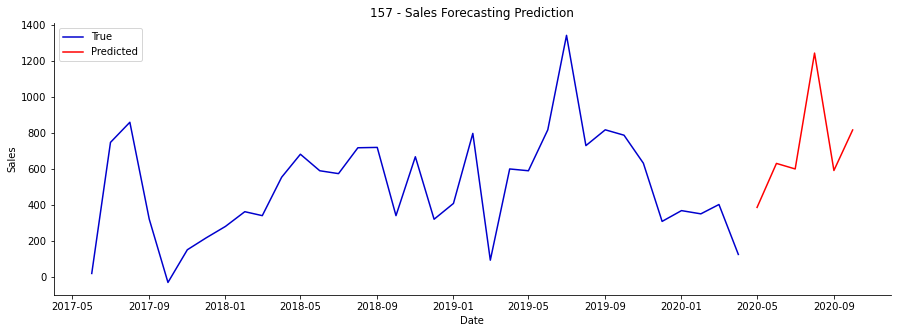

        Date          Qty
0 2020-05-01   385.863129
1 2020-06-01   630.851929
2 2020-07-01   600.025208
3 2020-08-01  1245.269409
4 2020-09-01   591.394226
5 2020-10-01   817.120239


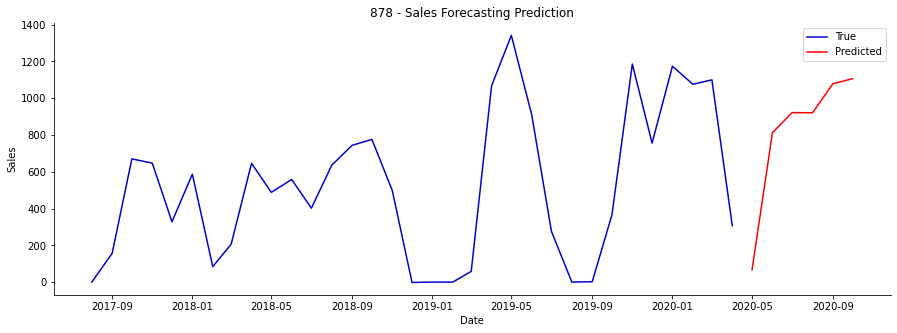

        Date          Qty
0 2020-05-01    66.454994
1 2020-06-01   812.023987
2 2020-07-01   921.870178
3 2020-08-01   920.736084
4 2020-09-01  1078.699219
5 2020-10-01  1106.388428


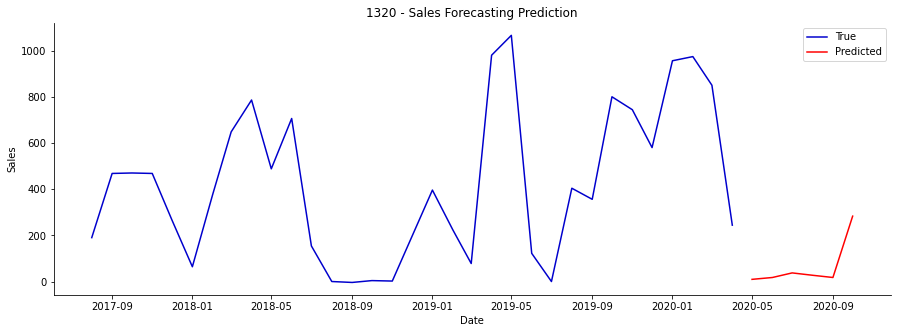

        Date         Qty
0 2020-05-01    9.393342
1 2020-06-01   17.442791
2 2020-07-01   37.302425
3 2020-08-01   27.086050
4 2020-09-01   17.445620
5 2020-10-01  283.072662


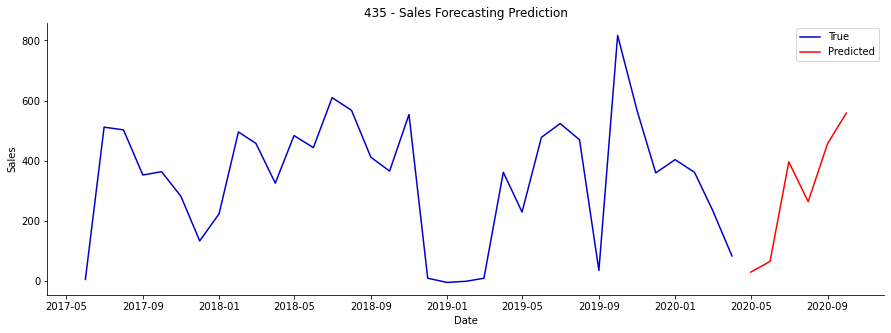

        Date         Qty
0 2020-05-01   30.267859
1 2020-06-01   65.835609
2 2020-07-01  396.799927
3 2020-08-01  264.256134
4 2020-09-01  456.932953
5 2020-10-01  558.789185


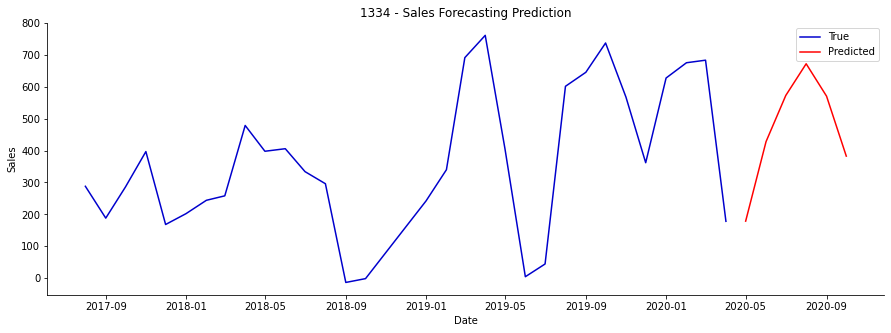

        Date         Qty
0 2020-05-01  178.509827
1 2020-06-01  428.232117
2 2020-07-01  573.196594
3 2020-08-01  672.757568
4 2020-09-01  570.998474
5 2020-10-01  382.731293


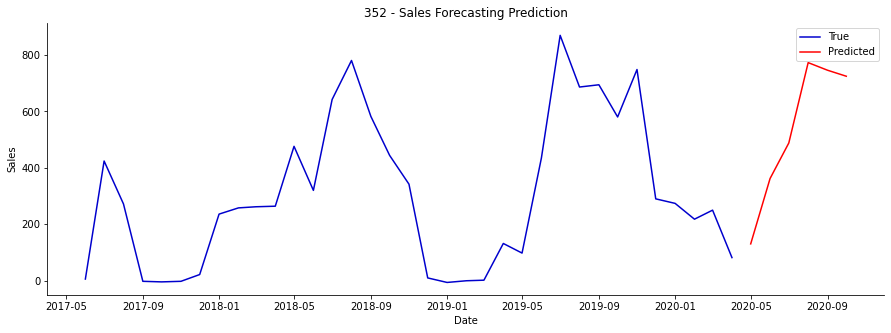

        Date         Qty
0 2020-05-01  130.561081
1 2020-06-01  361.978699
2 2020-07-01  487.844513
3 2020-08-01  772.428406
4 2020-09-01  745.492981
5 2020-10-01  724.246521


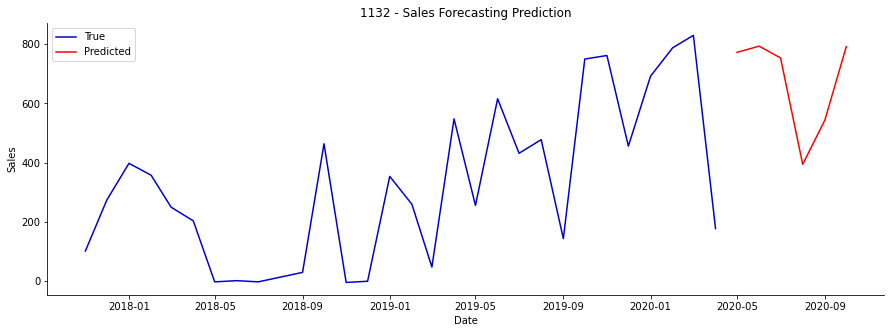

        Date         Qty
0 2020-05-01  772.556580
1 2020-06-01  793.522644
2 2020-07-01  753.793030
3 2020-08-01  394.639923
4 2020-09-01  543.779297
5 2020-10-01  791.843140


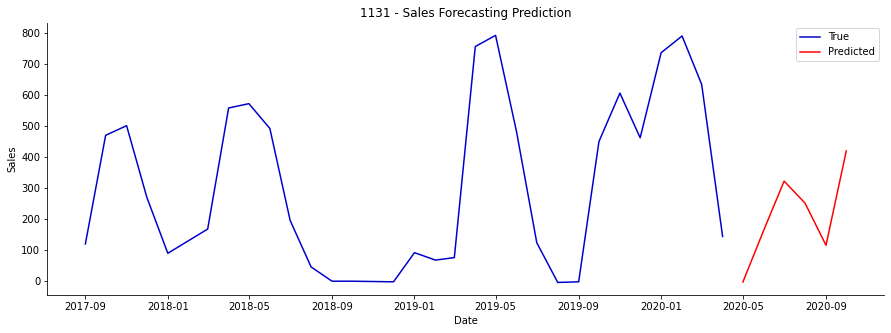

        Date         Qty
0 2020-05-01   -2.730186
1 2020-06-01  164.985626
2 2020-07-01  322.413391
3 2020-08-01  251.400894
4 2020-09-01  115.867905
5 2020-10-01  419.676117


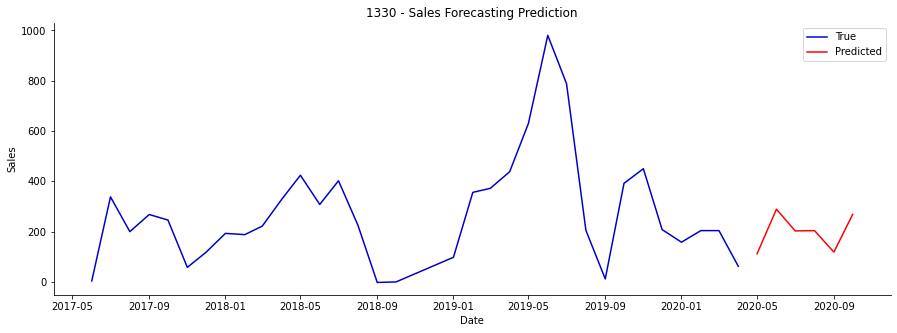

        Date         Qty
0 2020-05-01  112.017548
1 2020-06-01  289.131439
2 2020-07-01  202.833038
3 2020-08-01  203.843094
4 2020-09-01  118.620209
5 2020-10-01  268.396729


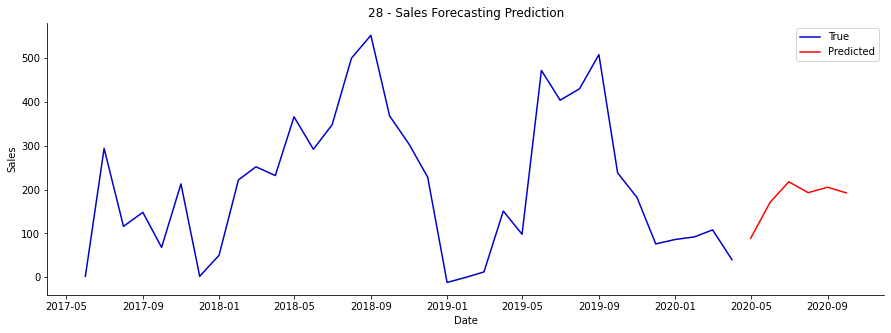

        Date         Qty
0 2020-05-01   88.897034
1 2020-06-01  170.770157
2 2020-07-01  217.749084
3 2020-08-01  192.937561
4 2020-09-01  205.388062
5 2020-10-01  192.410385


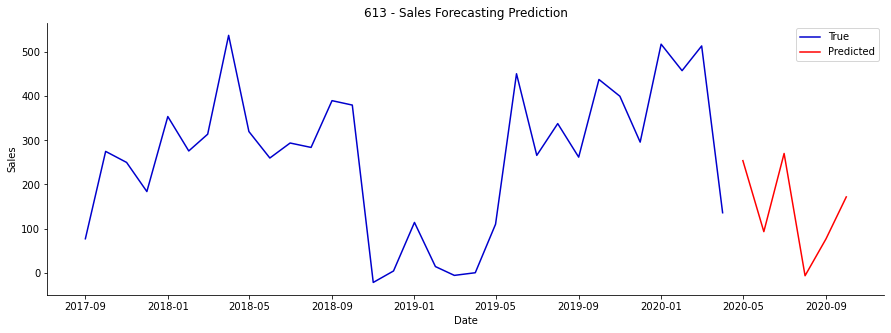

        Date         Qty
0 2020-05-01  254.016922
1 2020-06-01   93.118645
2 2020-07-01  270.328949
3 2020-08-01   -6.803656
4 2020-09-01   76.765808
5 2020-10-01  171.874512


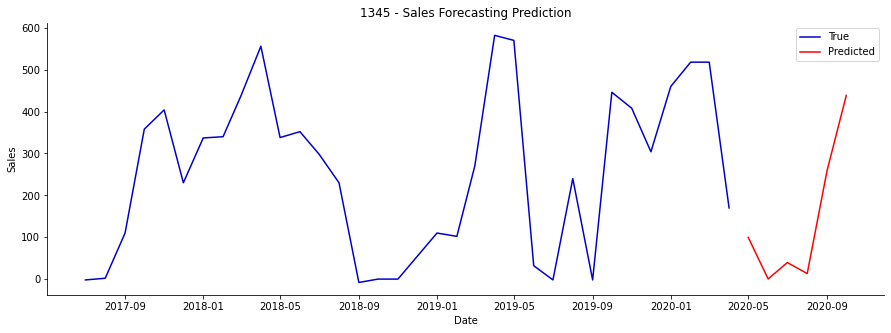

        Date         Qty
0 2020-05-01   99.387627
1 2020-06-01    0.398329
2 2020-07-01   39.459377
3 2020-08-01   13.271457
4 2020-09-01  259.127045
5 2020-10-01  438.566986


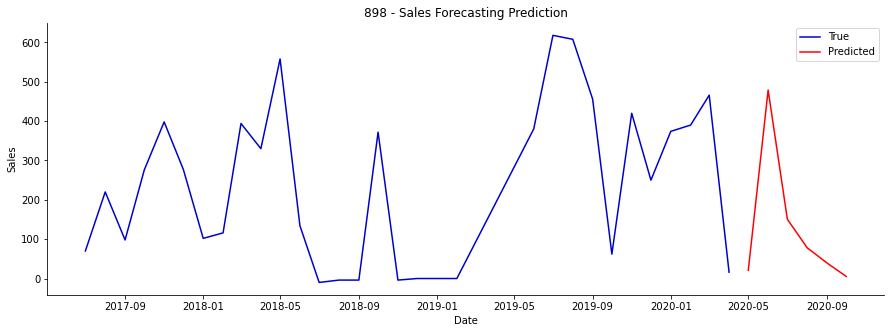

        Date         Qty
0 2020-05-01   20.790190
1 2020-06-01  478.913208
2 2020-07-01  150.672638
3 2020-08-01   78.020813
4 2020-09-01   39.324867
5 2020-10-01    5.202452


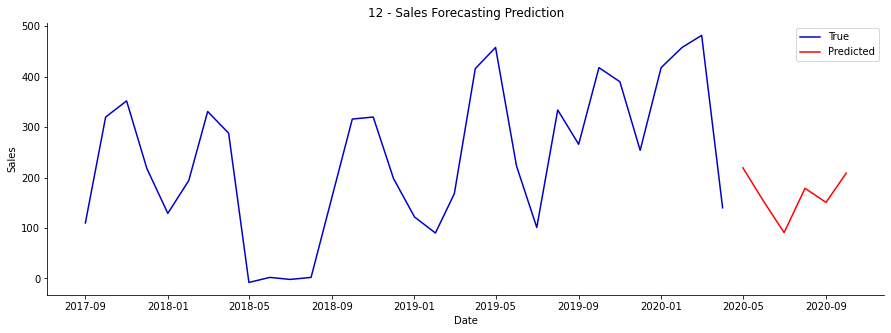

        Date         Qty
0 2020-05-01  219.318237
1 2020-06-01  152.279892
2 2020-07-01   90.883591
3 2020-08-01  178.677155
4 2020-09-01  150.745575
5 2020-10-01  208.855194


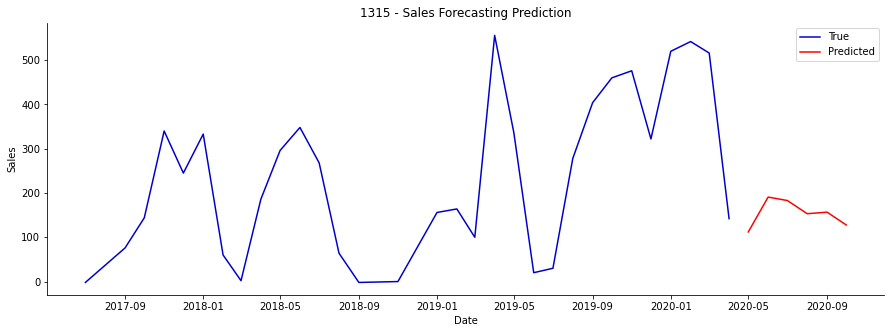

        Date         Qty
0 2020-05-01  112.020905
1 2020-06-01  190.764618
2 2020-07-01  182.990295
3 2020-08-01  153.235214
4 2020-09-01  156.740417
5 2020-10-01  127.723122


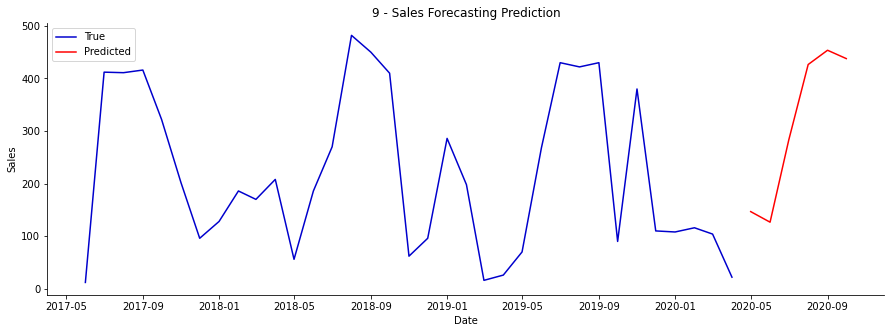

        Date         Qty
0 2020-05-01  146.740005
1 2020-06-01  126.637756
2 2020-07-01  283.296692
3 2020-08-01  426.538452
4 2020-09-01  453.671539
5 2020-10-01  437.792419


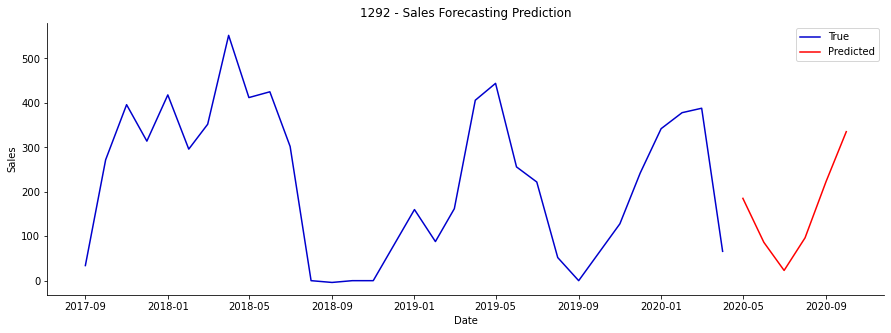

        Date         Qty
0 2020-05-01  185.217773
1 2020-06-01   86.339485
2 2020-07-01   23.004930
3 2020-08-01   96.429359
4 2020-09-01  222.723434
5 2020-10-01  335.260254


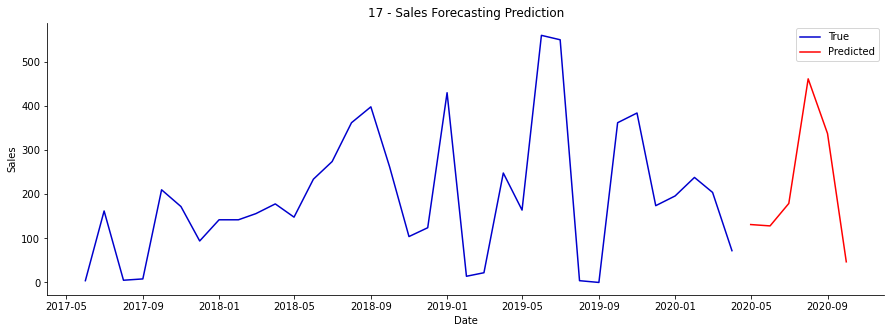

        Date         Qty
0 2020-05-01  131.214096
1 2020-06-01  128.142715
2 2020-07-01  179.040451
3 2020-08-01  461.445374
4 2020-09-01  337.363739
5 2020-10-01   46.762943


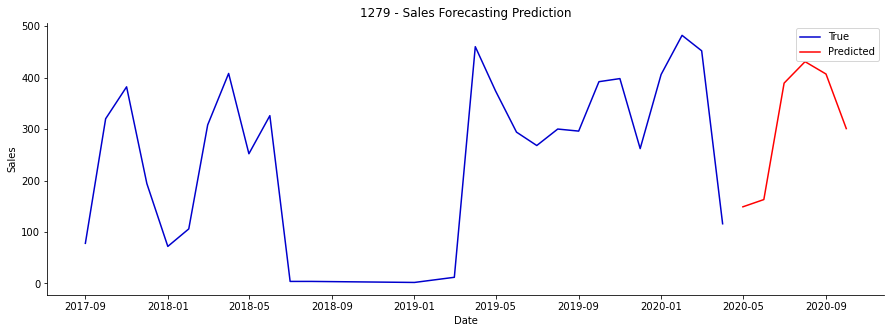

        Date         Qty
0 2020-05-01  148.932404
1 2020-06-01  163.001480
2 2020-07-01  389.203705
3 2020-08-01  430.907013
4 2020-09-01  406.888733
5 2020-10-01  300.856750


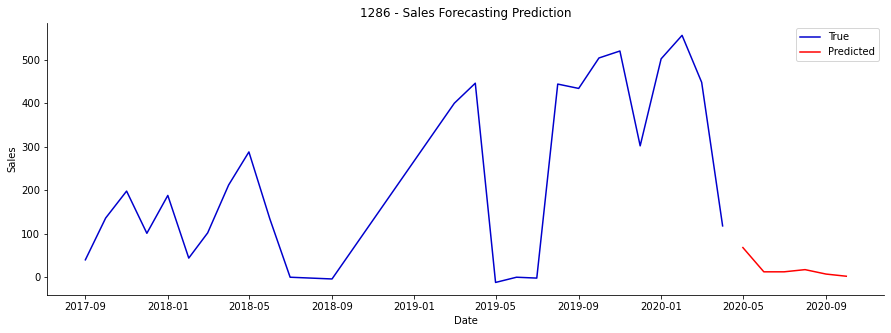

        Date        Qty
0 2020-05-01  68.167610
1 2020-06-01  12.427540
2 2020-07-01  12.428582
3 2020-08-01  17.453512
4 2020-09-01   7.268889
5 2020-10-01   2.287576


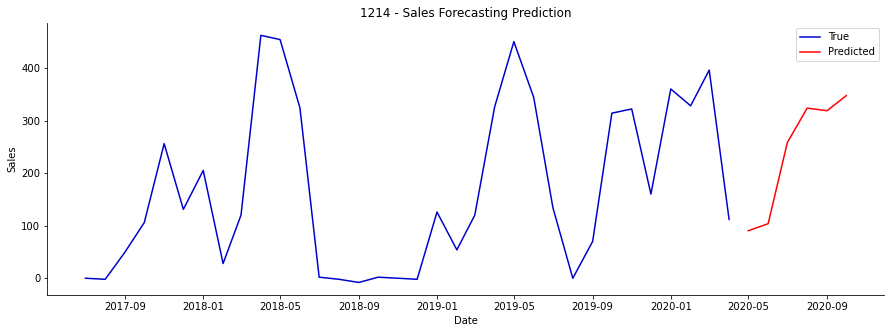

        Date         Qty
0 2020-05-01   90.351974
1 2020-06-01  103.643814
2 2020-07-01  258.169373
3 2020-08-01  323.647064
4 2020-09-01  318.637238
5 2020-10-01  347.369690


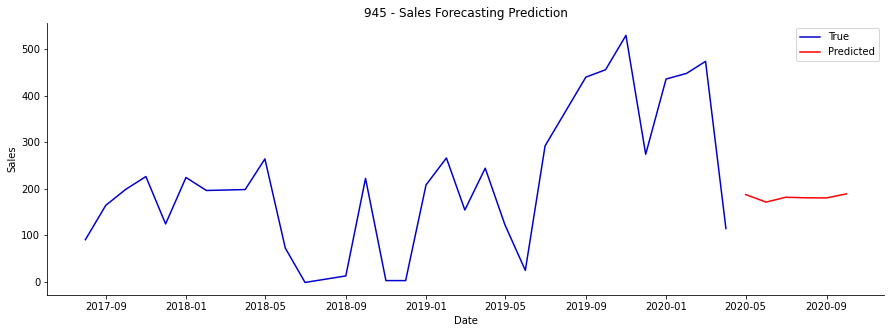

        Date         Qty
0 2020-05-01  187.247070
1 2020-06-01  170.984070
2 2020-07-01  181.483322
3 2020-08-01  180.181381
4 2020-09-01  179.937500
5 2020-10-01  188.628387


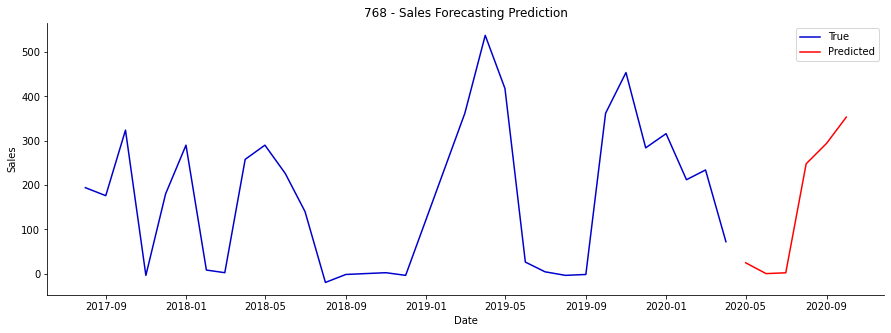

        Date         Qty
0 2020-05-01   24.433628
1 2020-06-01   -0.049009
2 2020-07-01    1.778433
3 2020-08-01  247.981094
4 2020-09-01  293.987366
5 2020-10-01  353.339813


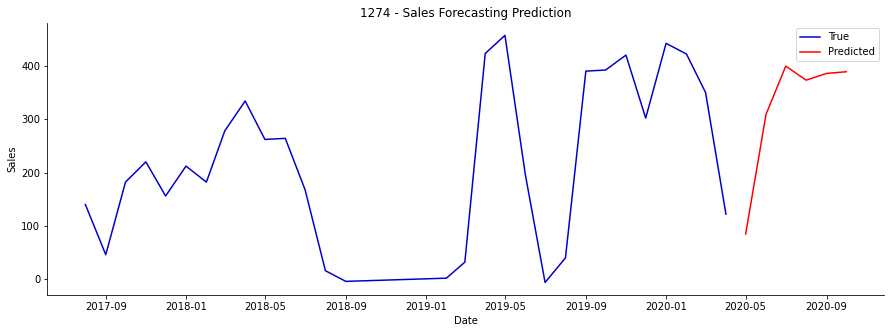

        Date         Qty
0 2020-05-01   84.706787
1 2020-06-01  309.173615
2 2020-07-01  399.387482
3 2020-08-01  373.034546
4 2020-09-01  385.653107
5 2020-10-01  388.825195


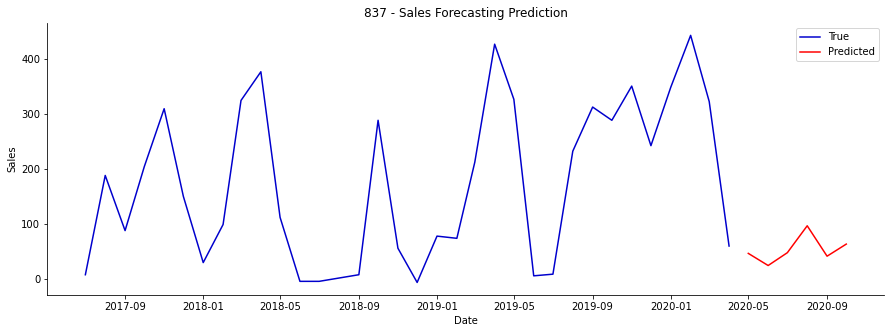

        Date        Qty
0 2020-05-01  46.699715
1 2020-06-01  24.709223
2 2020-07-01  47.964077
3 2020-08-01  96.738205
4 2020-09-01  41.610760
5 2020-10-01  63.560165


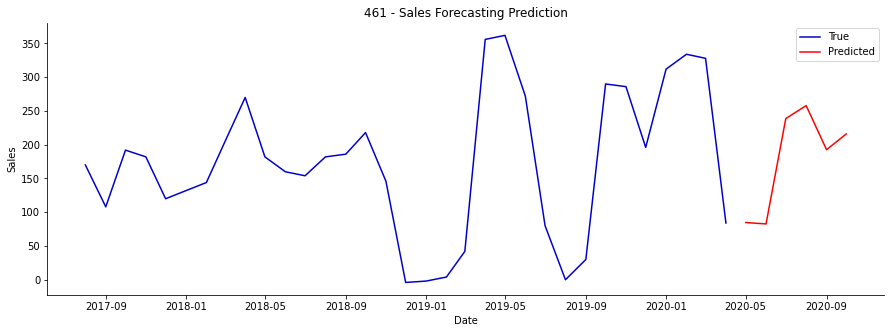

        Date         Qty
0 2020-05-01   84.755043
1 2020-06-01   82.657562
2 2020-07-01  238.738815
3 2020-08-01  257.959167
4 2020-09-01  192.662094
5 2020-10-01  215.993500


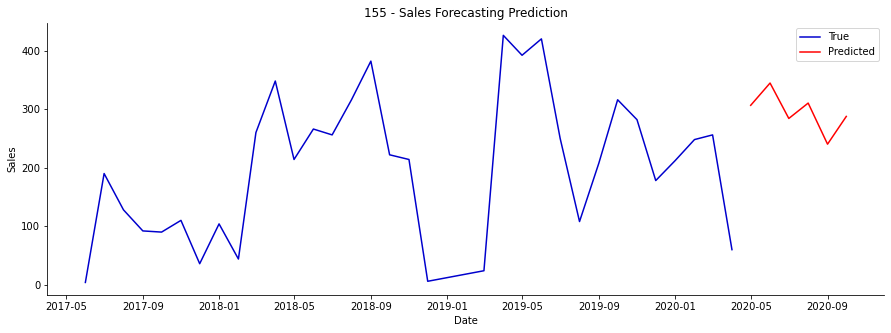

        Date         Qty
0 2020-05-01  306.509369
1 2020-06-01  344.561493
2 2020-07-01  284.074219
3 2020-08-01  310.334259
4 2020-09-01  240.158432
5 2020-10-01  287.535431


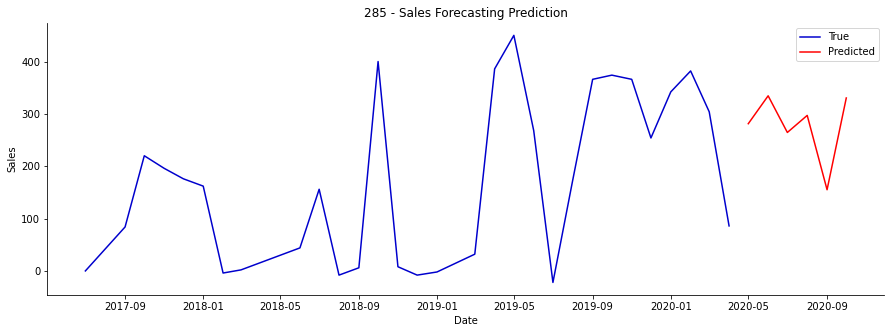

        Date         Qty
0 2020-05-01  281.228333
1 2020-06-01  334.517090
2 2020-07-01  264.502472
3 2020-08-01  297.080994
4 2020-09-01  155.086517
5 2020-10-01  330.399231


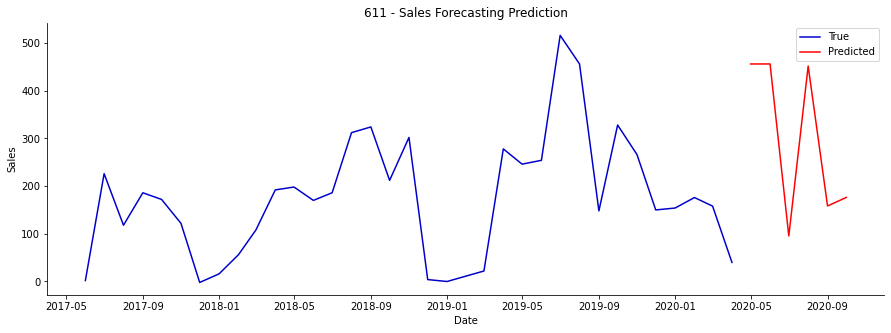

        Date         Qty
0 2020-05-01  456.000275
1 2020-06-01  456.038788
2 2020-07-01   95.533958
3 2020-08-01  451.674286
4 2020-09-01  158.335495
5 2020-10-01  176.229919


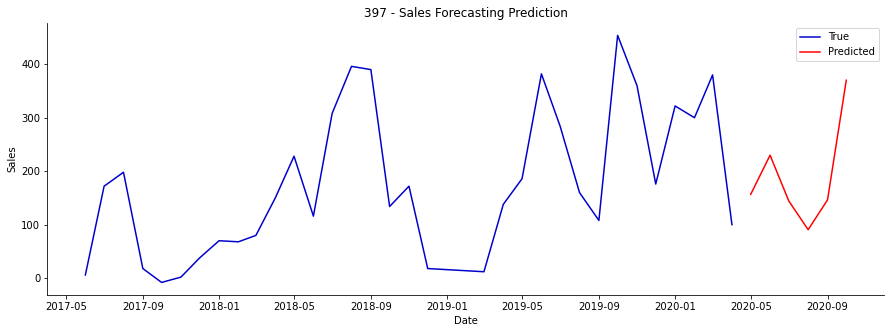

        Date         Qty
0 2020-05-01  156.681427
1 2020-06-01  229.915573
2 2020-07-01  144.296799
3 2020-08-01   90.637894
4 2020-09-01  146.376907
5 2020-10-01  370.057526


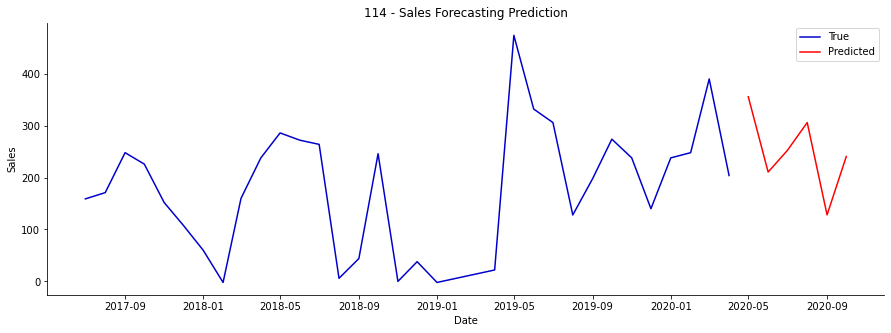

        Date         Qty
0 2020-05-01  355.686035
1 2020-06-01  210.667557
2 2020-07-01  252.270599
3 2020-08-01  306.025269
4 2020-09-01  128.182709
5 2020-10-01  240.550858


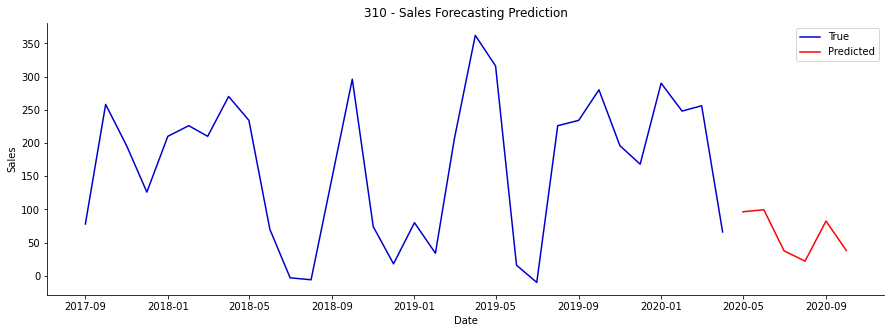

        Date        Qty
0 2020-05-01  96.415405
1 2020-06-01  99.429665
2 2020-07-01  37.499950
3 2020-08-01  22.111803
4 2020-09-01  82.448547
5 2020-10-01  38.093758


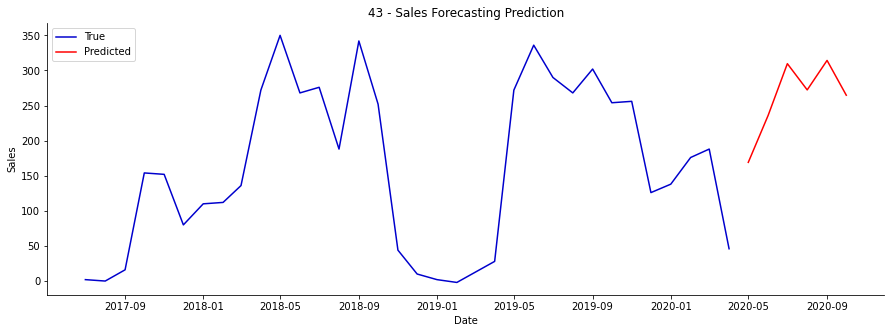

        Date         Qty
0 2020-05-01  169.073059
1 2020-06-01  235.974030
2 2020-07-01  309.668579
3 2020-08-01  272.293610
4 2020-09-01  314.291534
5 2020-10-01  264.723358


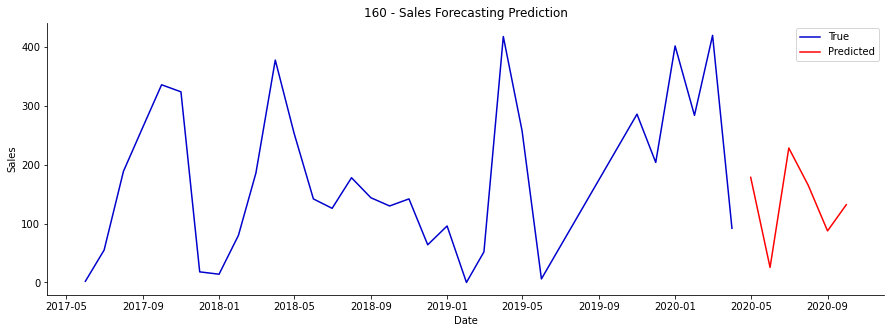

        Date         Qty
0 2020-05-01  178.628143
1 2020-06-01   25.521986
2 2020-07-01  228.501099
3 2020-08-01  165.363190
4 2020-09-01   87.615822
5 2020-10-01  132.131042


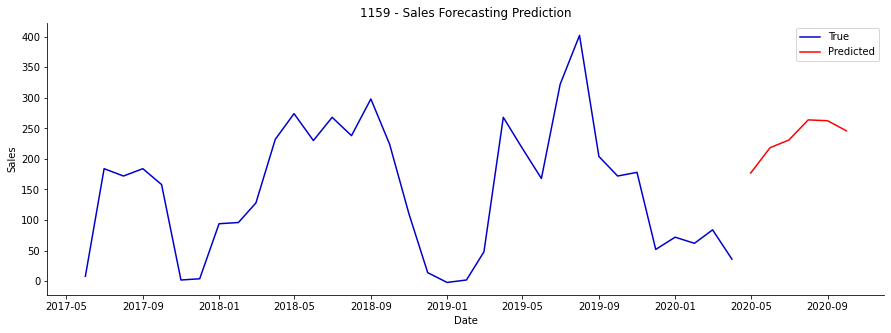

        Date         Qty
0 2020-05-01  176.884888
1 2020-06-01  218.346603
2 2020-07-01  230.783859
3 2020-08-01  263.766937
4 2020-09-01  262.415497
5 2020-10-01  246.057251


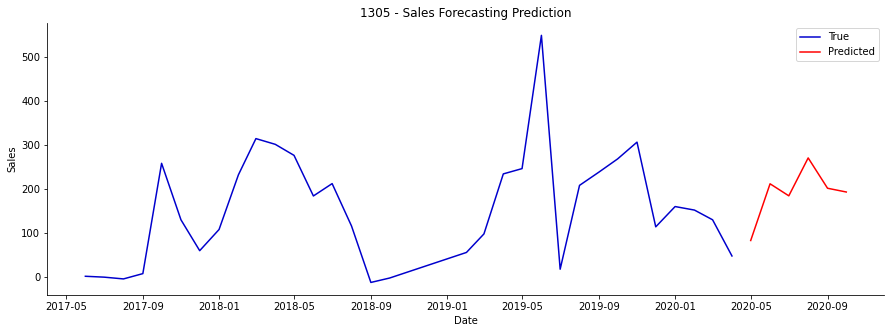

        Date         Qty
0 2020-05-01   83.021797
1 2020-06-01  211.570328
2 2020-07-01  184.312057
3 2020-08-01  270.236176
4 2020-09-01  201.499588
5 2020-10-01  192.974243


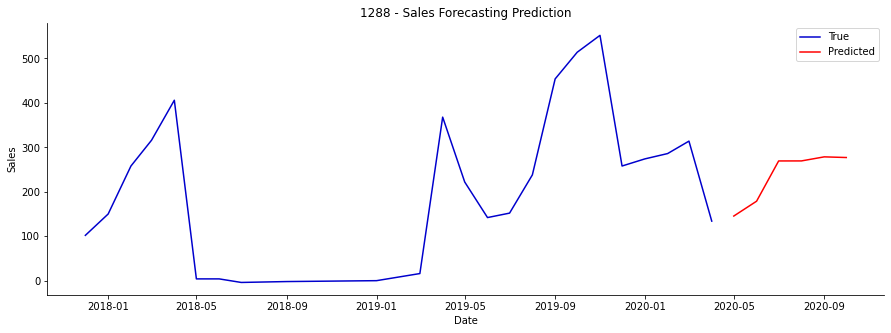

        Date         Qty
0 2020-05-01  145.431046
1 2020-06-01  178.818970
2 2020-07-01  269.390198
3 2020-08-01  269.447876
4 2020-09-01  278.593994
5 2020-10-01  277.108612


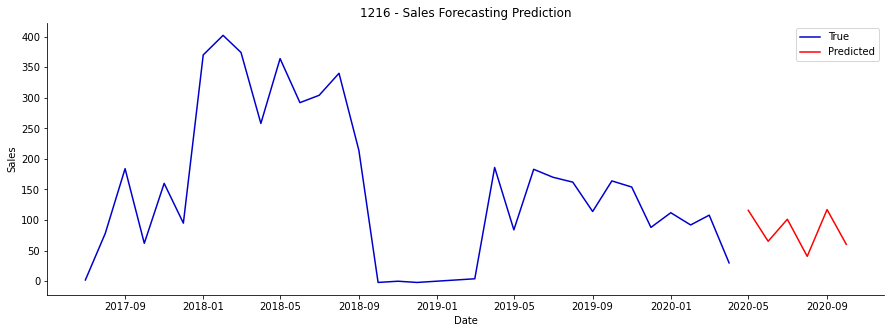

        Date         Qty
0 2020-05-01  115.940063
1 2020-06-01   65.304642
2 2020-07-01  101.318596
3 2020-08-01   40.661194
4 2020-09-01  117.130035
5 2020-10-01   60.288567


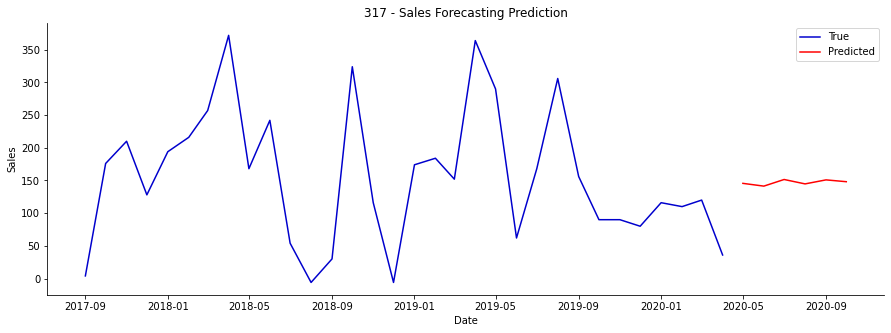

        Date         Qty
0 2020-05-01  145.580704
1 2020-06-01  141.356979
2 2020-07-01  151.502274
3 2020-08-01  144.756256
4 2020-09-01  150.905319
5 2020-10-01  148.119415


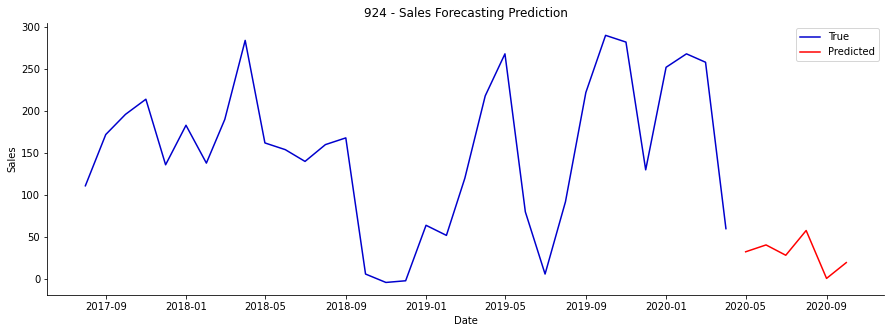

        Date        Qty
0 2020-05-01  32.478329
1 2020-06-01  40.639908
2 2020-07-01  28.349884
3 2020-08-01  57.801933
4 2020-09-01   0.799671
5 2020-10-01  19.625978


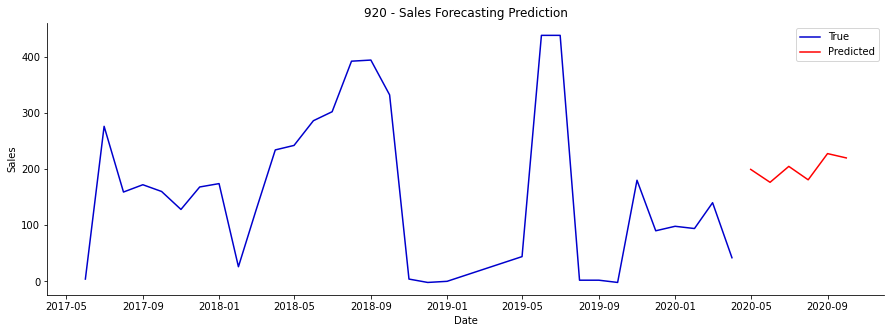

        Date         Qty
0 2020-05-01  199.331375
1 2020-06-01  176.316406
2 2020-07-01  204.670364
3 2020-08-01  180.770340
4 2020-09-01  227.436035
5 2020-10-01  219.745361


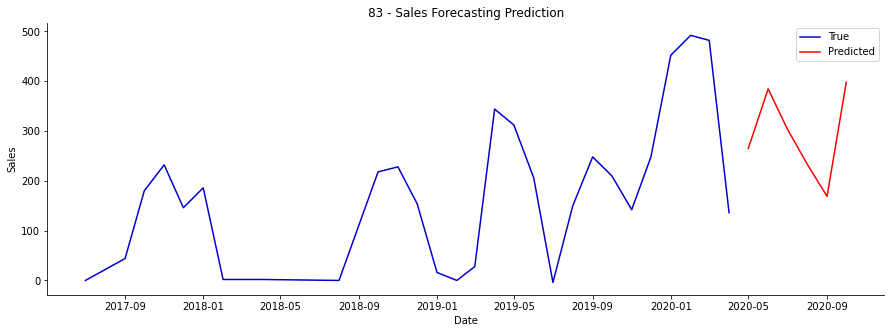

        Date         Qty
0 2020-05-01  265.008087
1 2020-06-01  384.565125
2 2020-07-01  304.003998
3 2020-08-01  233.482025
4 2020-09-01  168.849838
5 2020-10-01  397.920990


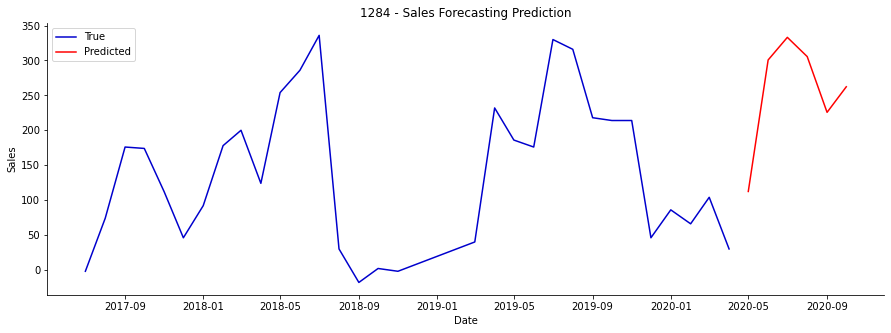

        Date         Qty
0 2020-05-01  112.333382
1 2020-06-01  300.742401
2 2020-07-01  333.136536
3 2020-08-01  305.590240
4 2020-09-01  225.689713
5 2020-10-01  262.339569


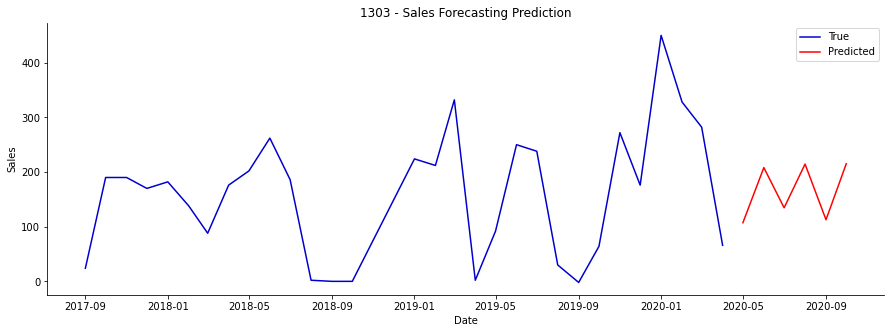

        Date         Qty
0 2020-05-01  107.204773
1 2020-06-01  208.115646
2 2020-07-01  134.613708
3 2020-08-01  214.495911
4 2020-09-01  112.731812
5 2020-10-01  215.162521


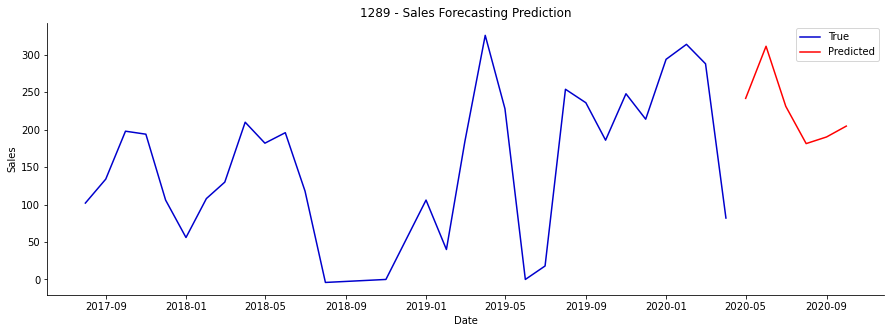

        Date         Qty
0 2020-05-01  241.852921
1 2020-06-01  311.433807
2 2020-07-01  231.229706
3 2020-08-01  181.439545
4 2020-09-01  190.296661
5 2020-10-01  204.801498


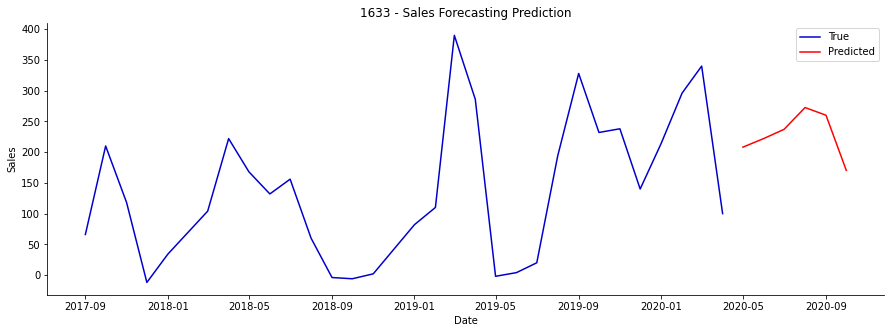

        Date         Qty
0 2020-05-01  208.113281
1 2020-06-01  222.201080
2 2020-07-01  237.148514
3 2020-08-01  272.570557
4 2020-09-01  260.021210
5 2020-10-01  170.331329


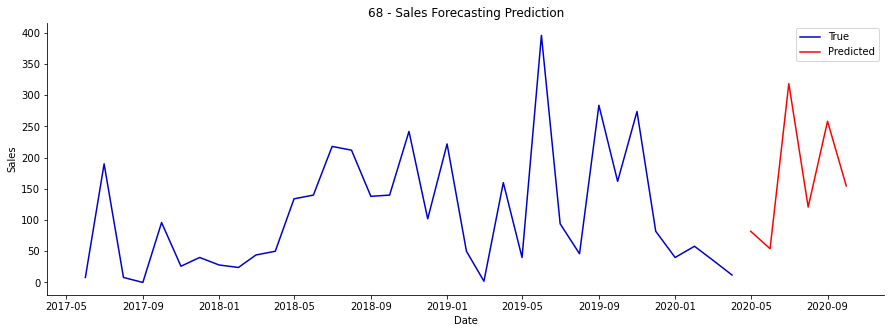

        Date         Qty
0 2020-05-01   81.948761
1 2020-06-01   54.082645
2 2020-07-01  318.703430
3 2020-08-01  120.792694
4 2020-09-01  258.338318
5 2020-10-01  154.612366


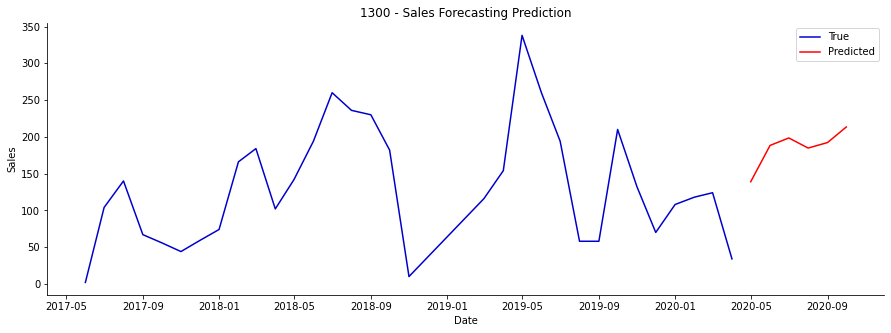

        Date         Qty
0 2020-05-01  138.920349
1 2020-06-01  188.332520
2 2020-07-01  198.476395
3 2020-08-01  184.742371
4 2020-09-01  192.243256
5 2020-10-01  213.385330


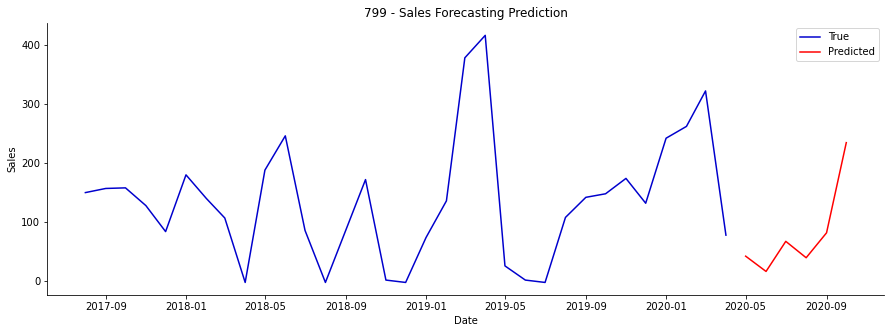

        Date         Qty
0 2020-05-01   42.462212
1 2020-06-01   16.620993
2 2020-07-01   67.520912
3 2020-08-01   39.787281
4 2020-09-01   81.968277
5 2020-10-01  234.516434


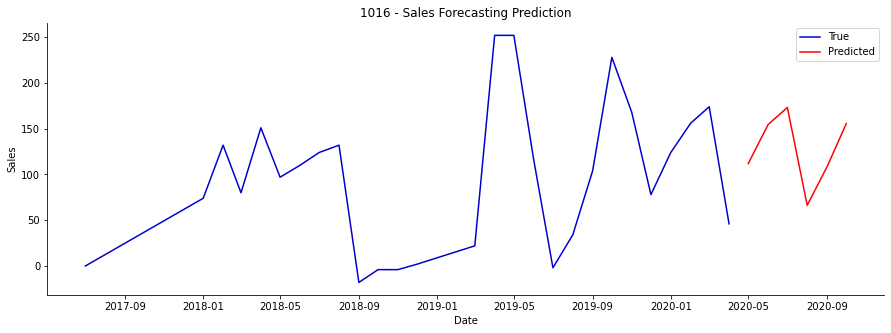

        Date         Qty
0 2020-05-01  111.943672
1 2020-06-01  154.585938
2 2020-07-01  173.178055
3 2020-08-01   66.350075
4 2020-09-01  108.420280
5 2020-10-01  155.643997


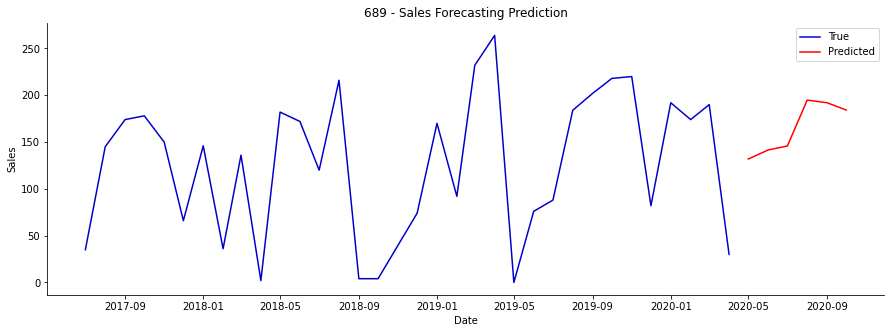

        Date         Qty
0 2020-05-01  131.874954
1 2020-06-01  141.543274
2 2020-07-01  145.754822
3 2020-08-01  194.823257
4 2020-09-01  192.013809
5 2020-10-01  184.202179


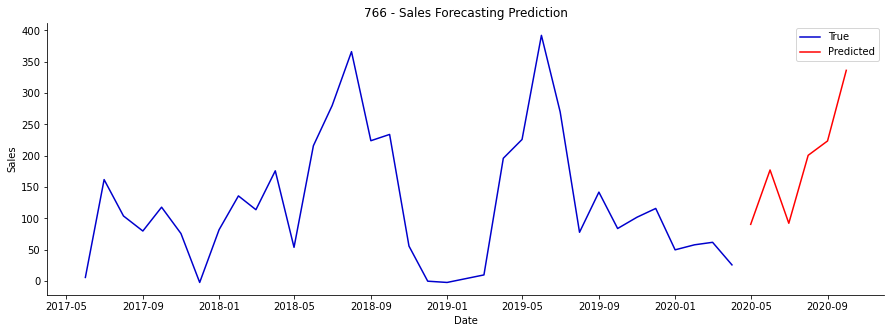

        Date         Qty
0 2020-05-01   90.642540
1 2020-06-01  177.333344
2 2020-07-01   92.352005
3 2020-08-01  200.722046
4 2020-09-01  223.600403
5 2020-10-01  336.240997


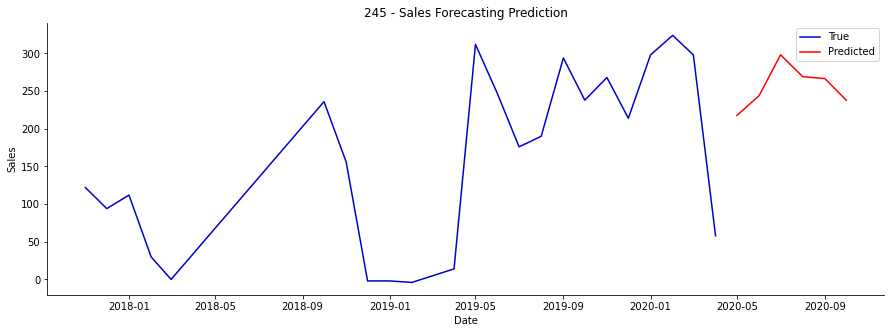

        Date         Qty
0 2020-05-01  217.782257
1 2020-06-01  243.900635
2 2020-07-01  298.195068
3 2020-08-01  269.137207
4 2020-09-01  266.678162
5 2020-10-01  237.798462


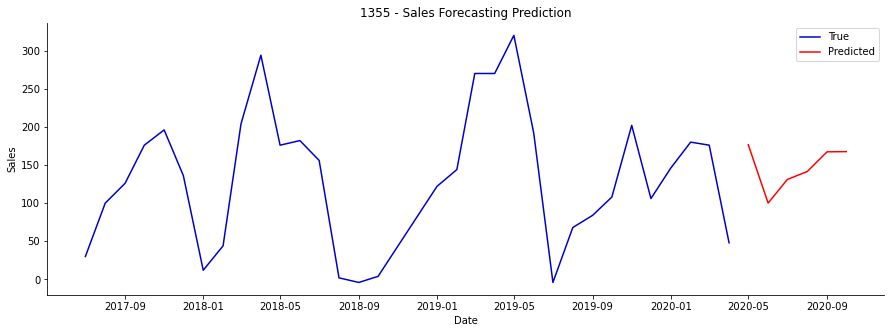

        Date         Qty
0 2020-05-01  176.479507
1 2020-06-01  100.055069
2 2020-07-01  131.081573
3 2020-08-01  141.407715
4 2020-09-01  167.269043
5 2020-10-01  167.560547


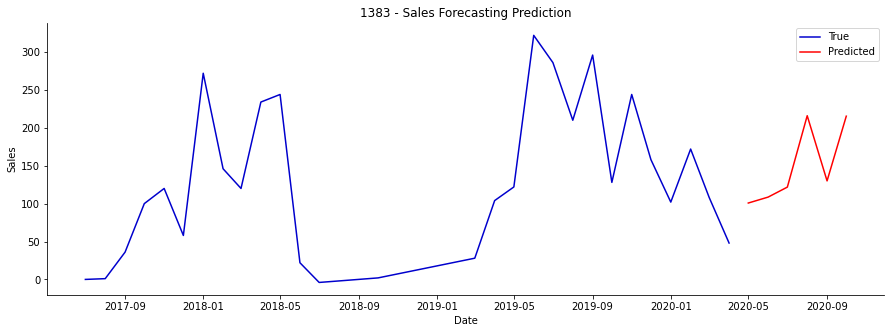

        Date         Qty
0 2020-05-01  100.773941
1 2020-06-01  108.613609
2 2020-07-01  121.790863
3 2020-08-01  215.981125
4 2020-09-01  129.992920
5 2020-10-01  215.372818


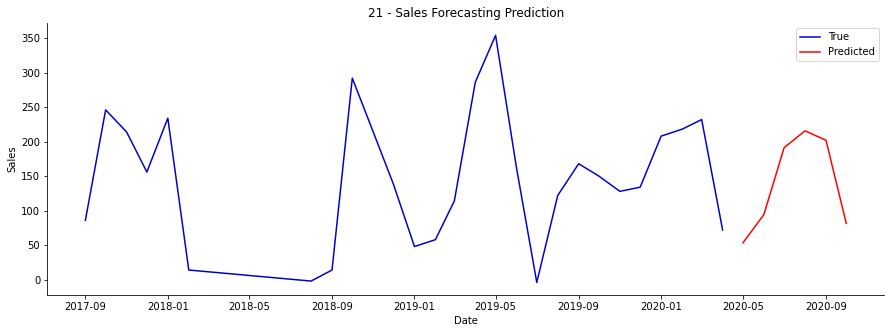

        Date         Qty
0 2020-05-01   53.269161
1 2020-06-01   94.299782
2 2020-07-01  191.280853
3 2020-08-01  215.640198
4 2020-09-01  201.895248
5 2020-10-01   81.480011


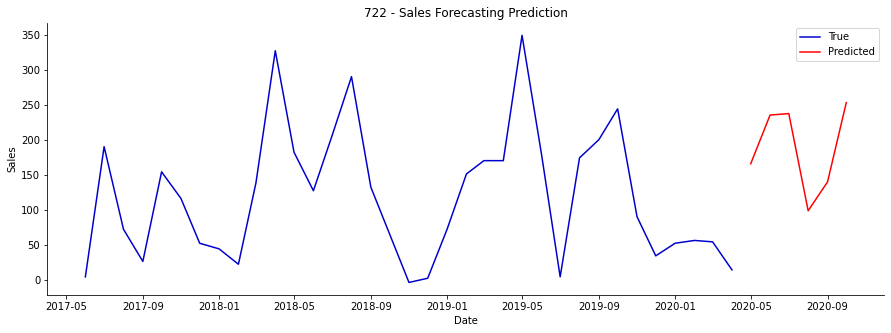

        Date         Qty
0 2020-05-01  165.540771
1 2020-06-01  235.134735
2 2020-07-01  237.234070
3 2020-08-01   98.419380
4 2020-09-01  139.668549
5 2020-10-01  252.919006


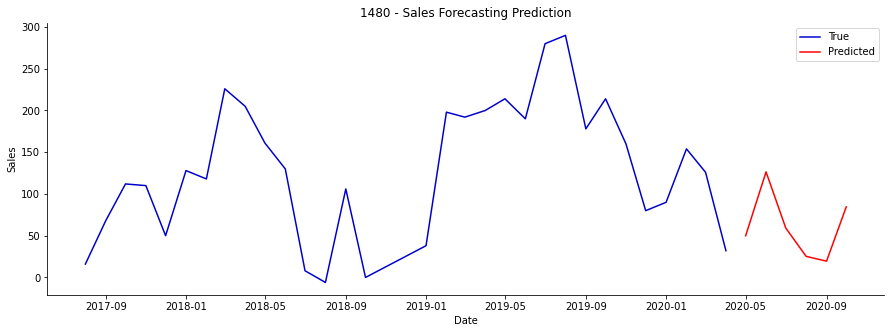

        Date         Qty
0 2020-05-01   49.915245
1 2020-06-01  126.470673
2 2020-07-01   59.154877
3 2020-08-01   25.217020
4 2020-09-01   19.503208
5 2020-10-01   84.615639


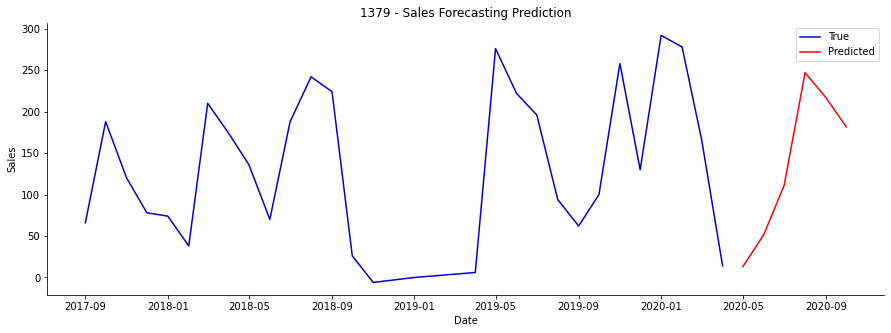

        Date         Qty
0 2020-05-01   13.105498
1 2020-06-01   51.787735
2 2020-07-01  111.004608
3 2020-08-01  247.000198
4 2020-09-01  216.761337
5 2020-10-01  181.593185


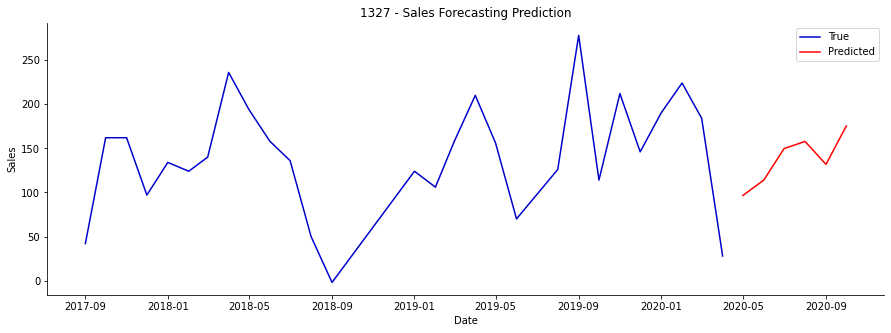

        Date         Qty
0 2020-05-01   96.539070
1 2020-06-01  114.047707
2 2020-07-01  149.748550
3 2020-08-01  157.785049
4 2020-09-01  131.815231
5 2020-10-01  175.297562


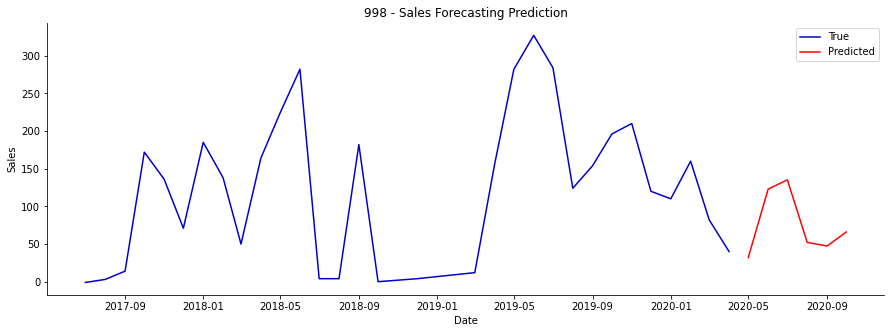

        Date         Qty
0 2020-05-01   32.142818
1 2020-06-01  122.883789
2 2020-07-01  135.213013
3 2020-08-01   52.165127
4 2020-09-01   47.359280
5 2020-10-01   65.950790


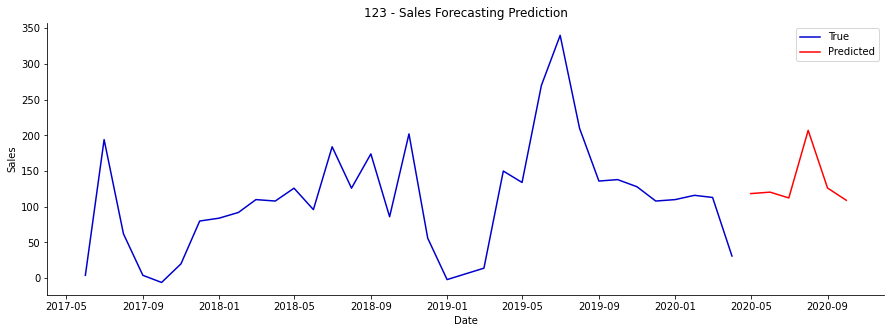

        Date         Qty
0 2020-05-01  118.420876
1 2020-06-01  120.458931
2 2020-07-01  112.337044
3 2020-08-01  206.954987
4 2020-09-01  126.235458
5 2020-10-01  109.073174


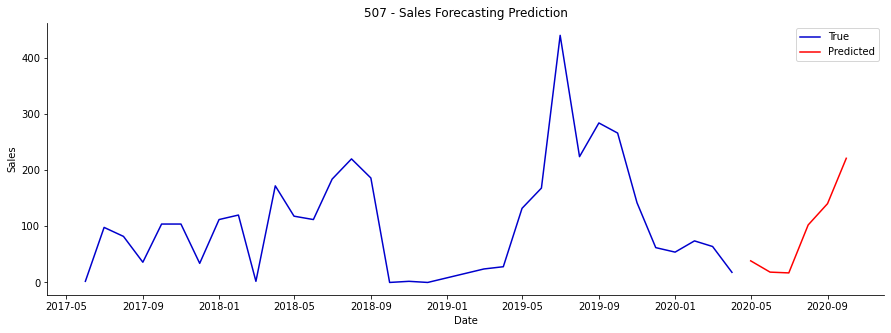

        Date         Qty
0 2020-05-01   38.490192
1 2020-06-01   18.383850
2 2020-07-01   16.982367
3 2020-08-01  102.397270
4 2020-09-01  140.334778
5 2020-10-01  221.088043


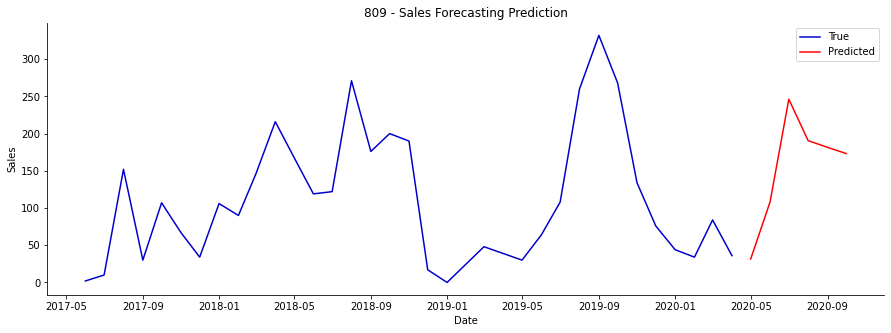

        Date         Qty
0 2020-05-01   31.535240
1 2020-06-01  108.183640
2 2020-07-01  246.199875
3 2020-08-01  190.502792
4 2020-09-01  181.535660
5 2020-10-01  173.097229


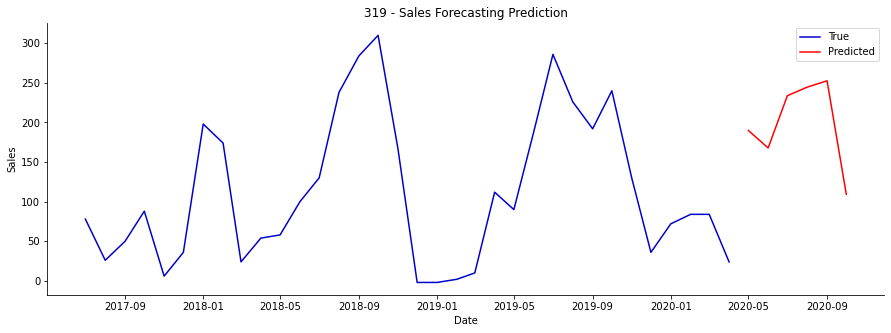

        Date         Qty
0 2020-05-01  189.985764
1 2020-06-01  167.836288
2 2020-07-01  233.773849
3 2020-08-01  244.627243
4 2020-09-01  252.630493
5 2020-10-01  109.379906


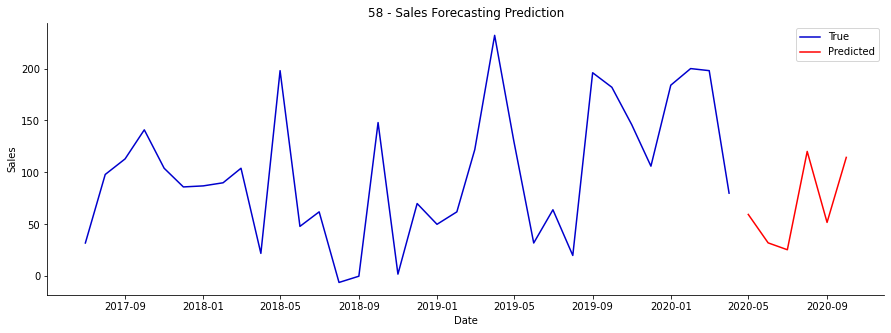

        Date         Qty
0 2020-05-01   59.503716
1 2020-06-01   32.114033
2 2020-07-01   25.501081
3 2020-08-01  120.196434
4 2020-09-01   51.828037
5 2020-10-01  114.454132


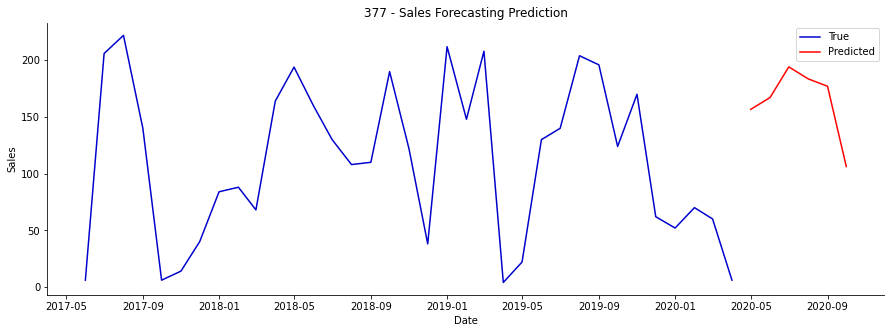

        Date         Qty
0 2020-05-01  156.688782
1 2020-06-01  167.136658
2 2020-07-01  194.186050
3 2020-08-01  183.624756
4 2020-09-01  177.072891
5 2020-10-01  106.279152


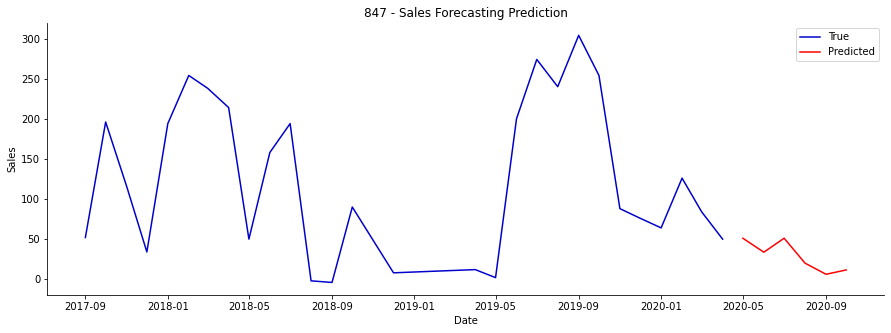

        Date        Qty
0 2020-05-01  51.126045
1 2020-06-01  33.683586
2 2020-07-01  51.132290
3 2020-08-01  20.007790
4 2020-09-01   6.203166
5 2020-10-01  11.582757


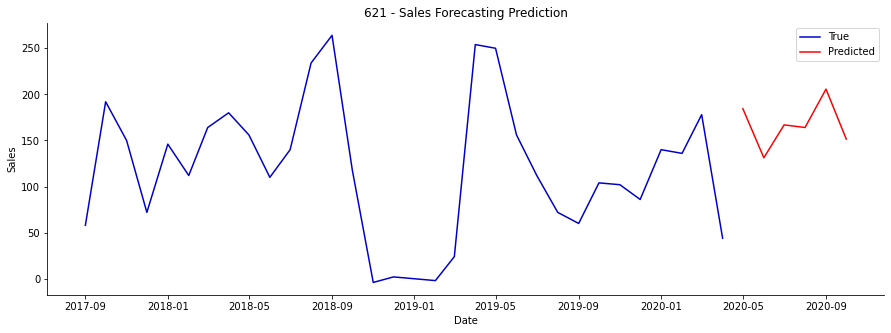

        Date         Qty
0 2020-05-01  184.425934
1 2020-06-01  131.227020
2 2020-07-01  166.879288
3 2020-08-01  164.084595
4 2020-09-01  205.693909
5 2020-10-01  151.448883


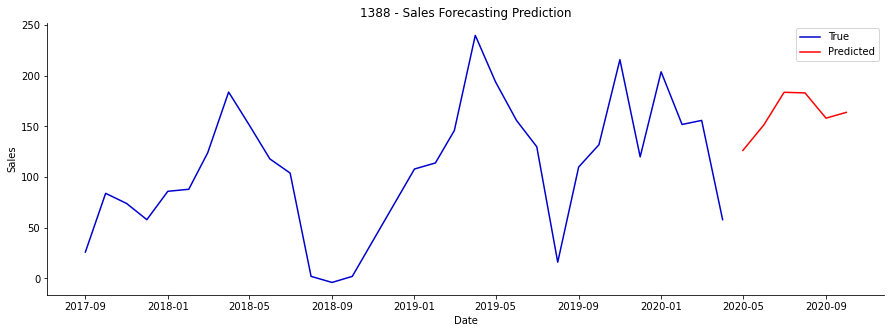

        Date         Qty
0 2020-05-01  126.355621
1 2020-06-01  151.566330
2 2020-07-01  183.775909
3 2020-08-01  183.159027
4 2020-09-01  158.239151
5 2020-10-01  163.950653


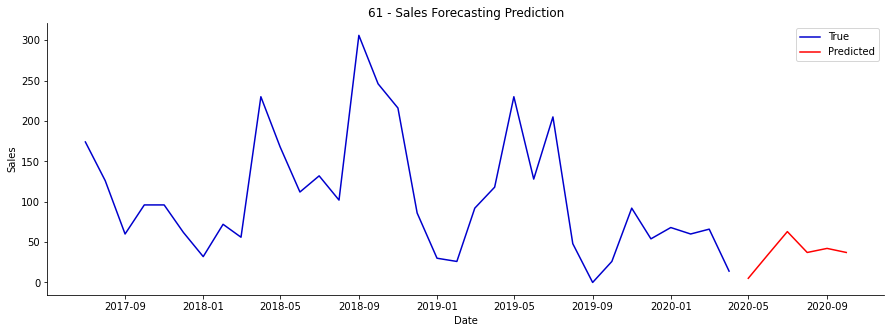

        Date        Qty
0 2020-05-01   5.145278
1 2020-06-01  34.691513
2 2020-07-01  62.954922
3 2020-08-01  37.108639
4 2020-09-01  42.154221
5 2020-10-01  37.132797


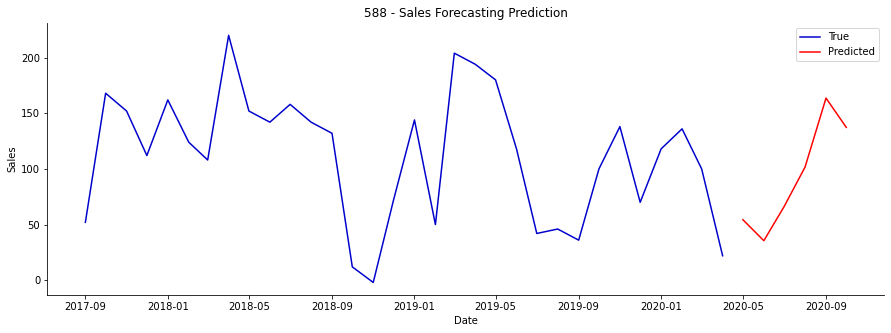

        Date         Qty
0 2020-05-01   54.354584
1 2020-06-01   35.498913
2 2020-07-01   66.157166
3 2020-08-01  101.685852
4 2020-09-01  163.637283
5 2020-10-01  137.306519


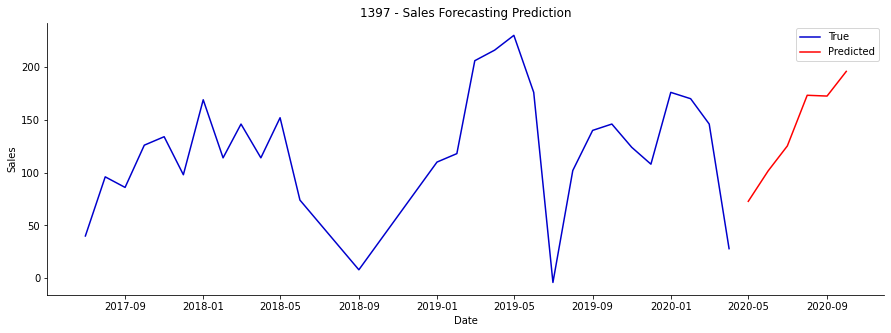

        Date         Qty
0 2020-05-01   72.821350
1 2020-06-01  101.628639
2 2020-07-01  125.296829
3 2020-08-01  173.254349
4 2020-09-01  172.512833
5 2020-10-01  195.869385


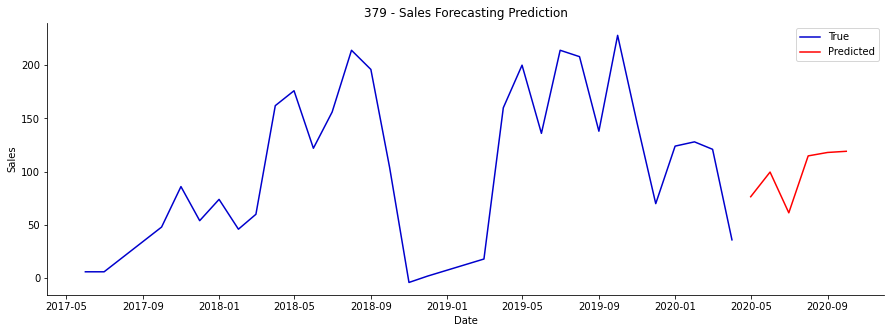

        Date         Qty
0 2020-05-01   76.482567
1 2020-06-01   99.646233
2 2020-07-01   61.368416
3 2020-08-01  114.822548
4 2020-09-01  118.039253
5 2020-10-01  119.139755


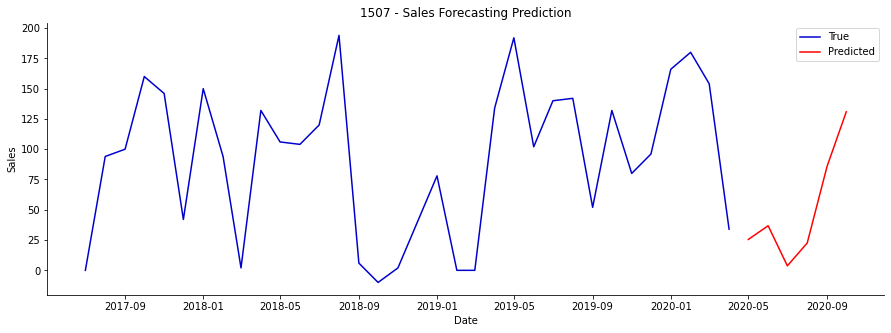

        Date         Qty
0 2020-05-01   25.485752
1 2020-06-01   36.808079
2 2020-07-01    3.720550
3 2020-08-01   22.542356
4 2020-09-01   85.802315
5 2020-10-01  130.886734


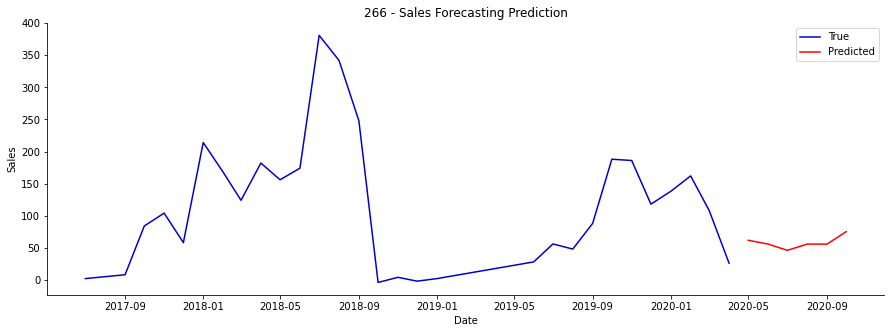

        Date        Qty
0 2020-05-01  61.680893
1 2020-06-01  55.785587
2 2020-07-01  46.007336
3 2020-08-01  55.740150
4 2020-09-01  55.740097
5 2020-10-01  75.236542


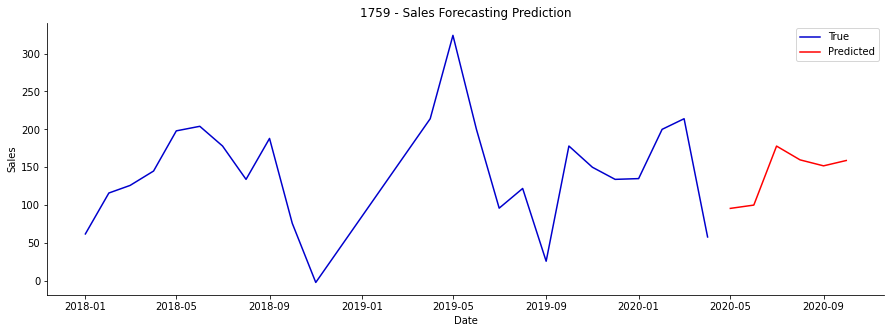

        Date         Qty
0 2020-05-01   95.703224
1 2020-06-01  100.067177
2 2020-07-01  177.914886
3 2020-08-01  159.725967
4 2020-09-01  151.836197
5 2020-10-01  158.898880


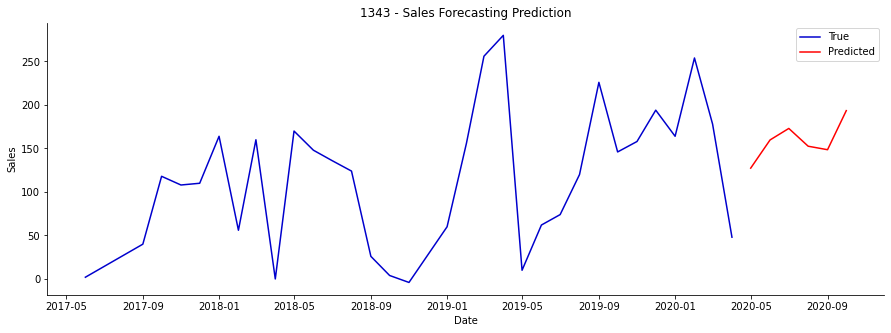

        Date         Qty
0 2020-05-01  127.388725
1 2020-06-01  159.791718
2 2020-07-01  173.013351
3 2020-08-01  152.576614
4 2020-09-01  148.561356
5 2020-10-01  193.481308


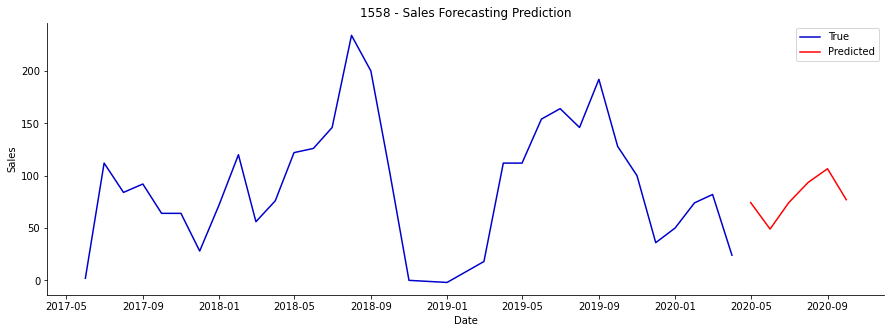

        Date         Qty
0 2020-05-01   74.234055
1 2020-06-01   48.996220
2 2020-07-01   74.285698
3 2020-08-01   93.553329
4 2020-09-01  106.600082
5 2020-10-01   77.025757


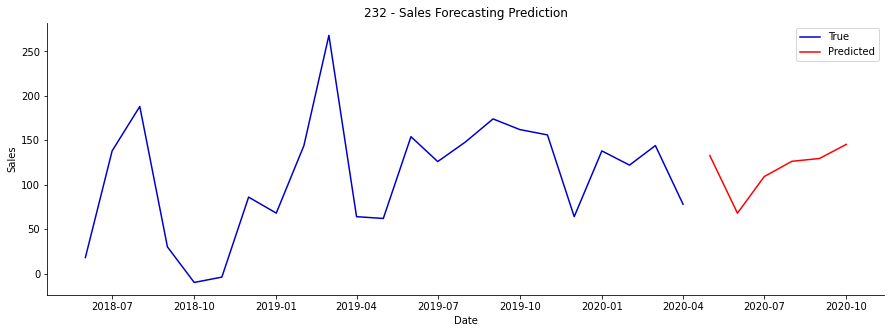

        Date         Qty
0 2020-05-01  132.819733
1 2020-06-01   67.958015
2 2020-07-01  109.070267
3 2020-08-01  126.298111
4 2020-09-01  129.451950
5 2020-10-01  145.336746


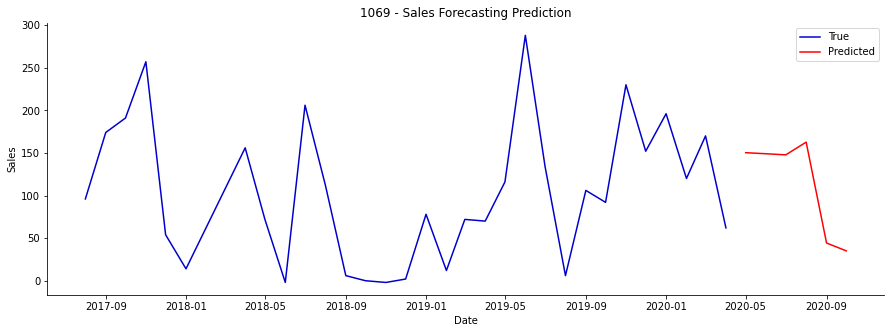

        Date         Qty
0 2020-05-01  150.288544
1 2020-06-01  149.042419
2 2020-07-01  147.747467
3 2020-08-01  162.672363
4 2020-09-01   44.297901
5 2020-10-01   35.057560


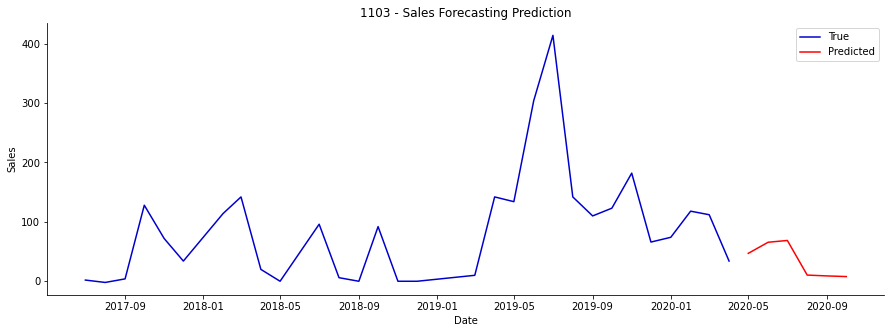

        Date        Qty
0 2020-05-01  46.991829
1 2020-06-01  65.683586
2 2020-07-01  68.684265
3 2020-08-01  10.398564
4 2020-09-01   8.983027
5 2020-10-01   7.913566


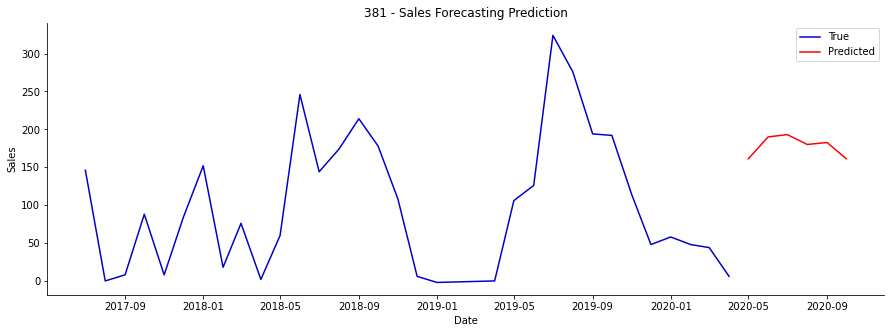

        Date         Qty
0 2020-05-01  161.111038
1 2020-06-01  190.009720
2 2020-07-01  193.058105
3 2020-08-01  180.035446
4 2020-09-01  182.620178
5 2020-10-01  161.153259


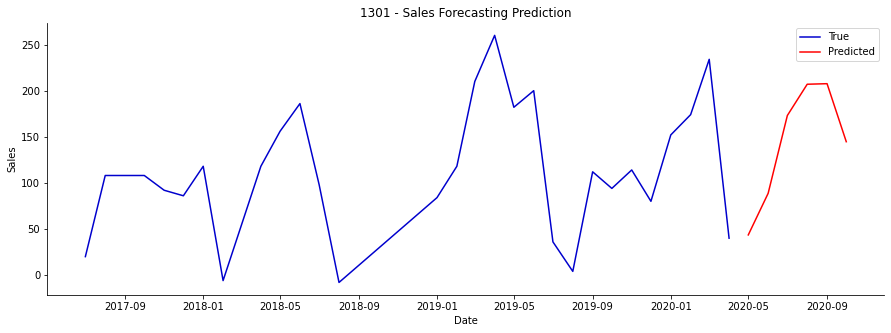

        Date         Qty
0 2020-05-01   43.544979
1 2020-06-01   88.646988
2 2020-07-01  173.064224
3 2020-08-01  206.978439
4 2020-09-01  207.580872
5 2020-10-01  144.635925


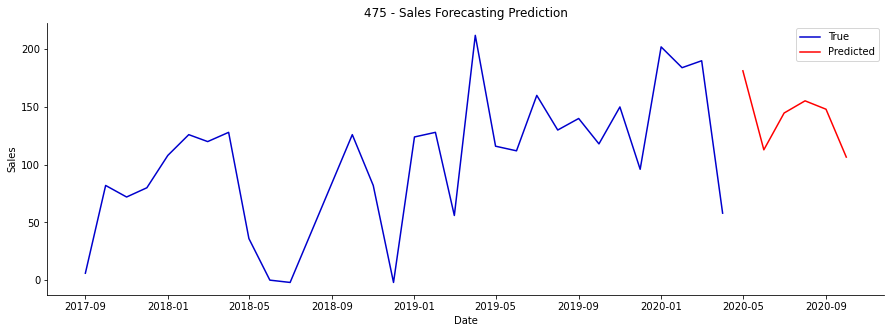

        Date         Qty
0 2020-05-01  181.281036
1 2020-06-01  112.869263
2 2020-07-01  144.730957
3 2020-08-01  155.289337
4 2020-09-01  148.028625
5 2020-10-01  106.561295


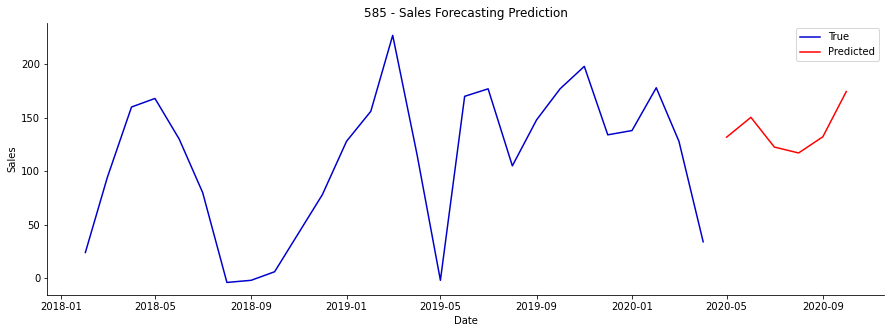

        Date         Qty
0 2020-05-01  131.827484
1 2020-06-01  150.355438
2 2020-07-01  122.584564
3 2020-08-01  117.045982
4 2020-09-01  132.145584
5 2020-10-01  174.481201


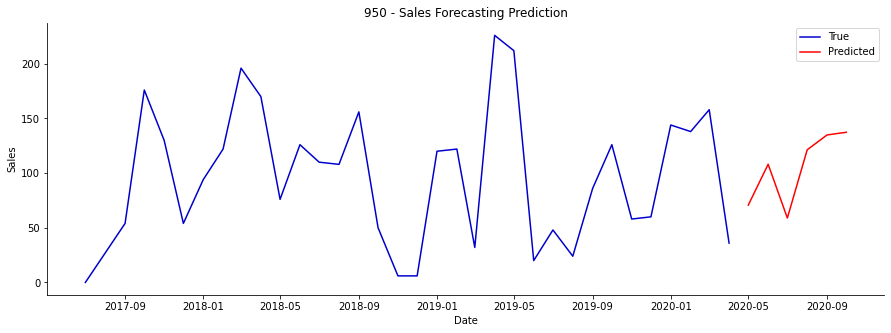

        Date         Qty
0 2020-05-01   70.730858
1 2020-06-01  108.088631
2 2020-07-01   58.927956
3 2020-08-01  121.339447
4 2020-09-01  134.919601
5 2020-10-01  137.350388


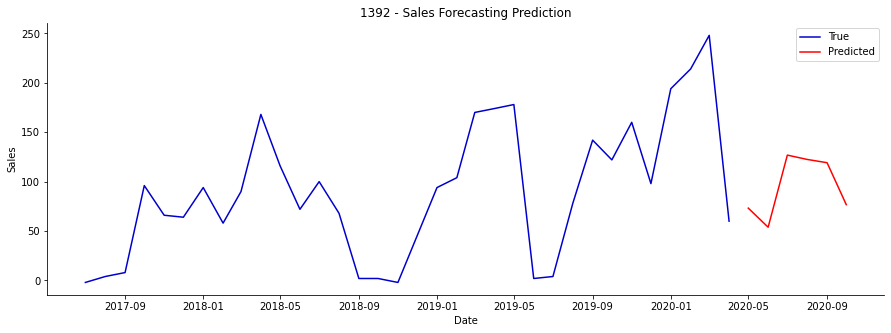

        Date         Qty
0 2020-05-01   73.204391
1 2020-06-01   53.878174
2 2020-07-01  126.842880
3 2020-08-01  122.448051
4 2020-09-01  119.156685
5 2020-10-01   76.691017


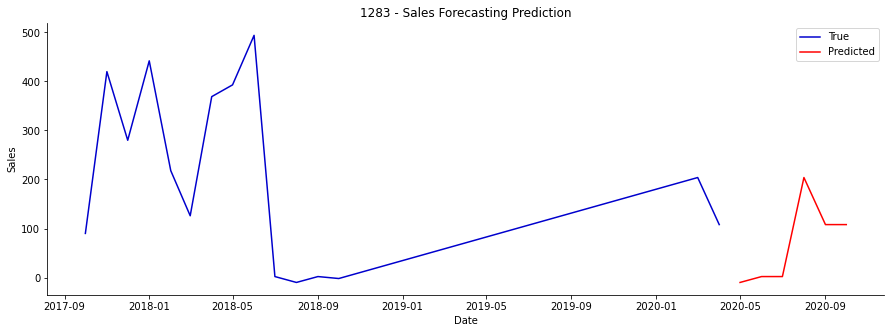

        Date         Qty
0 2020-05-01   -9.998968
1 2020-06-01    1.999032
2 2020-07-01    1.999069
3 2020-08-01  203.998917
4 2020-09-01  107.999397
5 2020-10-01  107.999489


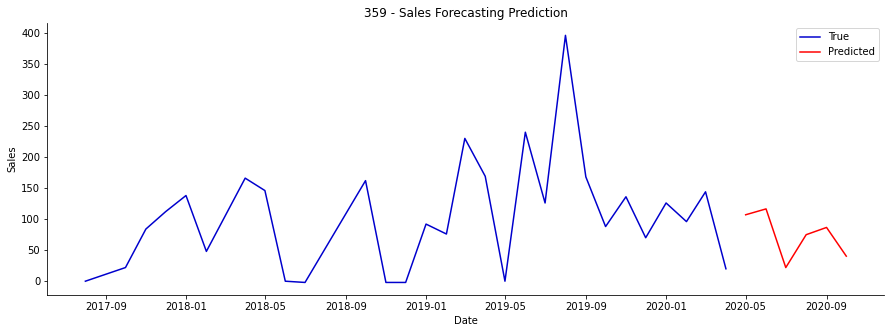

        Date         Qty
0 2020-05-01  107.006073
1 2020-06-01  116.475754
2 2020-07-01   21.960402
3 2020-08-01   74.917511
4 2020-09-01   86.592697
5 2020-10-01   40.346020


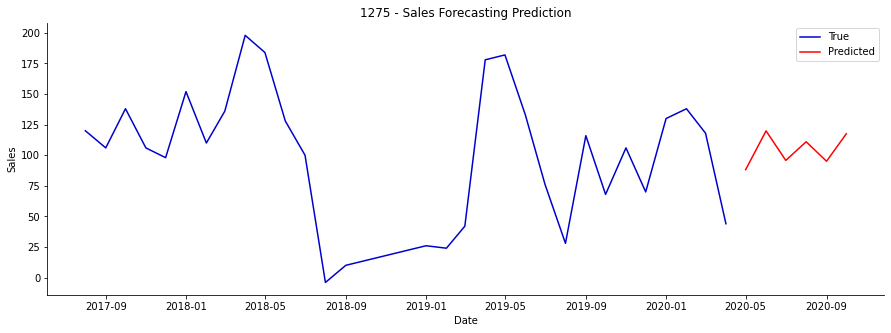

        Date         Qty
0 2020-05-01   88.198227
1 2020-06-01  119.912590
2 2020-07-01   95.777542
3 2020-08-01  111.030846
4 2020-09-01   95.074051
5 2020-10-01  117.536293


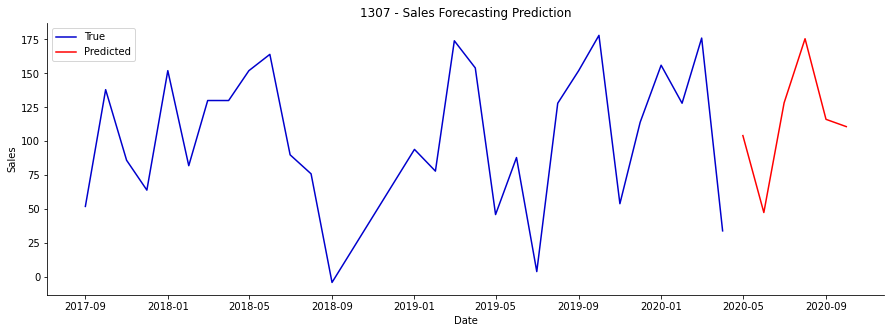

        Date         Qty
0 2020-05-01  104.165604
1 2020-06-01   47.506123
2 2020-07-01  128.287109
3 2020-08-01  175.513611
4 2020-09-01  116.137283
5 2020-10-01  110.779335


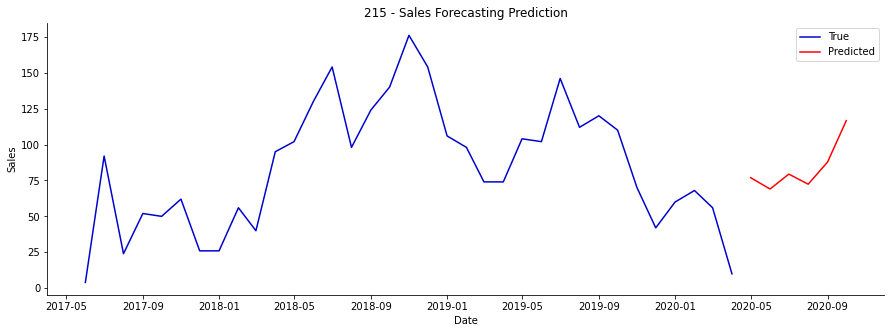

        Date         Qty
0 2020-05-01   76.917114
1 2020-06-01   69.028496
2 2020-07-01   79.417641
3 2020-08-01   72.405937
4 2020-09-01   87.769073
5 2020-10-01  116.663902


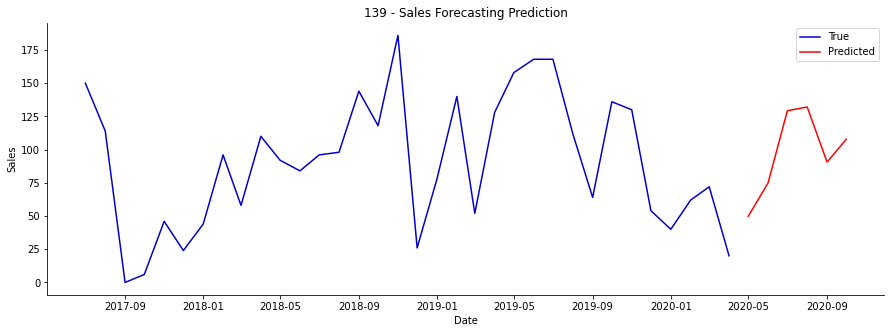

        Date         Qty
0 2020-05-01   49.840561
1 2020-06-01   75.027832
2 2020-07-01  129.235504
3 2020-08-01  132.065598
4 2020-09-01   90.583687
5 2020-10-01  107.788925


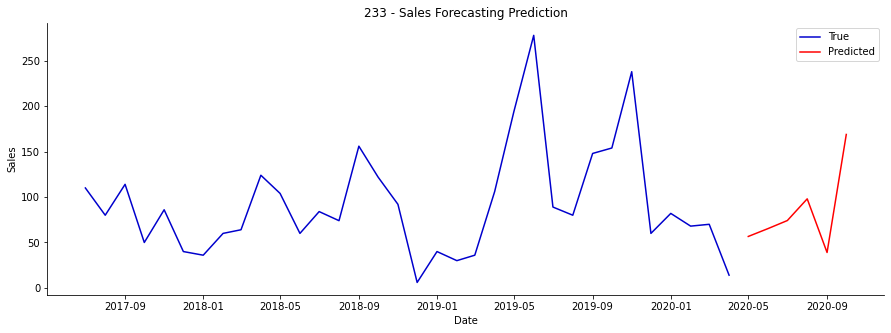

        Date         Qty
0 2020-05-01   56.633533
1 2020-06-01   65.339317
2 2020-07-01   74.151131
3 2020-08-01   98.031685
4 2020-09-01   38.971291
5 2020-10-01  168.911423


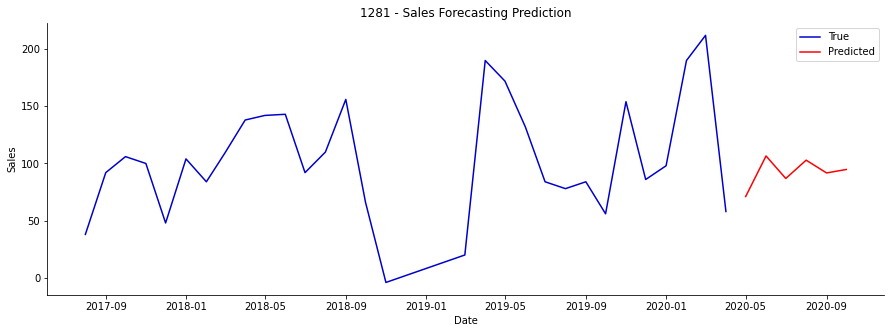

        Date         Qty
0 2020-05-01   71.107803
1 2020-06-01  106.571495
2 2020-07-01   86.888237
3 2020-08-01  102.900696
4 2020-09-01   91.726845
5 2020-10-01   94.750549


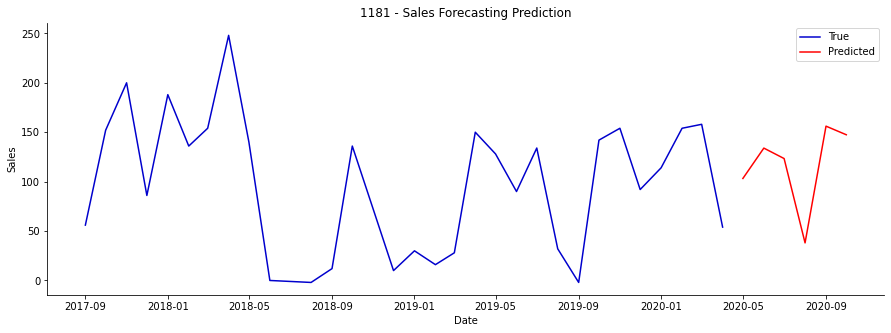

        Date         Qty
0 2020-05-01  103.215996
1 2020-06-01  133.921875
2 2020-07-01  123.356659
3 2020-08-01   38.022377
4 2020-09-01  156.133163
5 2020-10-01  147.435059


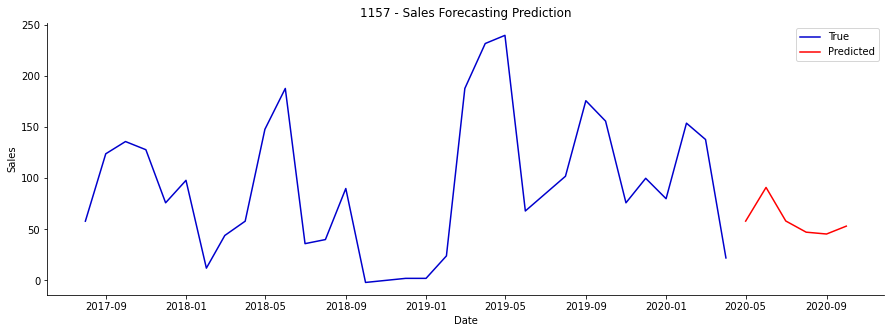

        Date        Qty
0 2020-05-01  58.068501
1 2020-06-01  91.057961
2 2020-07-01  58.188766
3 2020-08-01  47.234154
4 2020-09-01  45.432579
5 2020-10-01  53.144882


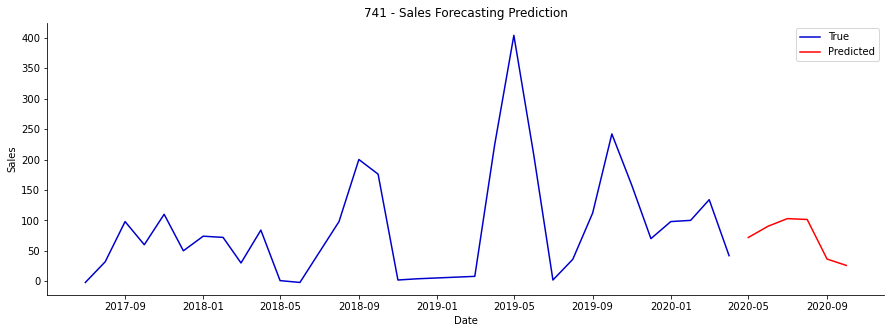

        Date         Qty
0 2020-05-01   71.875961
1 2020-06-01   90.414772
2 2020-07-01  102.869774
3 2020-08-01  101.440308
4 2020-09-01   36.445362
5 2020-10-01   25.970640


In [54]:
for index, row in is_df.iterrows():
    plot_res(is_df.loc[index][4], is_df.loc[index][2], is_df.loc[index]["article"])
    print(is_df.loc[index][4])

## Прогноз спроса top-100 артикулов на основе остатков на складе

In [55]:
stock

,Date,Stock,article_id
0,2017-06-06,579,343
1,2017-06-07,575,343
2,2017-06-08,573,343
3,2017-06-09,573,343
4,2017-06-10,571,343
...,...,...,...
1647552,2020-04-03,213,2110
1647553,2020-04-04,213,2110
1647554,2020-04-05,213,2110
1647555,2020-04-07,215,2110


In [56]:
# top 100 articles
top_100 = sales["article_id"].value_counts()[:100].index.to_list()

In [57]:
def monthly_stock(df, date, sales_number):
    """ Monthly sales

    Args:
        df : dataframe
        date string: name of column with Date
        sales_number string: name of column with number of sales

    Returns:
        pd.DataFrame: monthly sales
    """
    monthly_data = df.copy()
    monthly_data[date] = monthly_data[date].apply(lambda x: str(x)[:-12])
    monthly_data = monthly_data.groupby(date)[sales_number].sum().reset_index()
    monthly_data[date] = pd.to_datetime(monthly_data[date])
    return monthly_data

In [58]:
is_df = pd.DataFrame(
    columns=["article", "Daily stock", "Monthly stock", "Daily supervised", "prediction"]
)

i = 0
for article in tqdm(top_100):
    article_daily_stock = stock[stock["article_id"] == article]
    article_monthly_stock = monthly_sales(article_daily_stock, "Date", "Stock")

    values = article_monthly_stock["Stock"].values

    prediction_length = 10

    last_date = article_monthly_stock["Date"].max()

    prediction = pd.DataFrame(columns=["Date", "Stock"])

    for predict_num in range(6):
        # add a month to the last date
        last_date += pd.DateOffset(months=1)
        
        # transform the time series data into supervised learning
        train = series_to_supervised(values, n_in=prediction_length)

        # split into input and output columns
        trainX, trainy = train[:, :-1], train[:, -1]

        # fit model
        model = XGBRegressor(objective='reg:squarederror', n_estimators=100)
        model.fit(trainX, trainy)

        # construct an input for a new preduction
        row = values[-prediction_length:].flatten()

        # make a one-step prediction
        yhat = model.predict(np.asarray([row]))[0]
        
        values = np.append(values, yhat)

        prediction.loc[predict_num] = [last_date, yhat]

    is_df.loc[i] = [article, article_daily_stock, article_monthly_stock, train, prediction]
    i += 1

is_df.head(2)

  0%|          | 0/100 [00:00<?, ?it/s]

,article,Daily stock,Monthly stock,Daily supervised,prediction
0,6,Date Stock article_id 758204 20...,Date Stock 0 2017-06-01 2 1 ...,"[[2.0, 42824.0, 110160.0, 87651.0, 69411.0, 54...",Date Stock 0 2020-05-01 5988...
1,157,Date Stock article_id 8303 2017-0...,Date Stock 0 2017-06-01 101008 1 ...,"[[101008.0, 103544.0, 76021.0, 17770.0, 2104.0...",Date Stock 0 2020-05-01 70915...


In [59]:
def plot_res(results, original_df, sub_title):
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.lineplot(
        x=original_df["Date"],
        y=original_df["Stock"],
        data=original_df,
        ax=ax,
        label="True",
        color="mediumblue",
    )
    sns.lineplot(
        x=results["Date"],
        y=results["Stock"],
        data=results,
        ax=ax,
        label="Predicted",
        color="Red",
    )
    ax.set(
        xlabel="Date",
        ylabel="Stock",
        title=f"{sub_title} - Article Stock Forecasting Prediction",
    )
    ax.legend()
    sns.despine()
    plt.show()

In [60]:
is_df.loc[0][4]

,Date,Stock
0,2020-05-01,5988.653320
1,2020-06-01,2584.481445
2,2020-07-01,56823.765625
3,2020-08-01,23672.101562
4,2020-09-01,6391.124512
5,2020-10-01,29403.529297


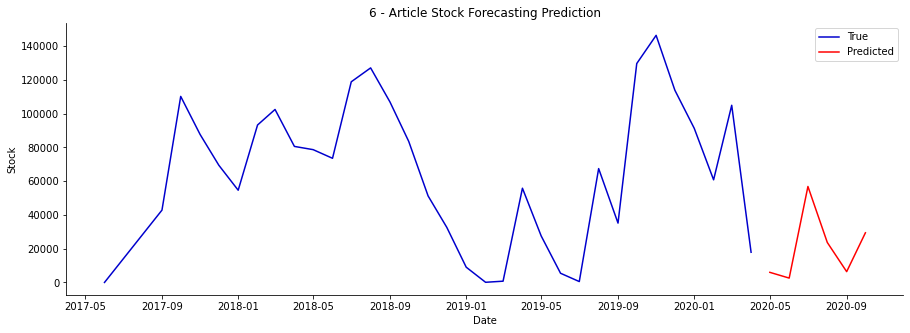

        Date         Stock
0 2020-05-01   5988.653320
1 2020-06-01   2584.481445
2 2020-07-01  56823.765625
3 2020-08-01  23672.101562
4 2020-09-01   6391.124512
5 2020-10-01  29403.529297


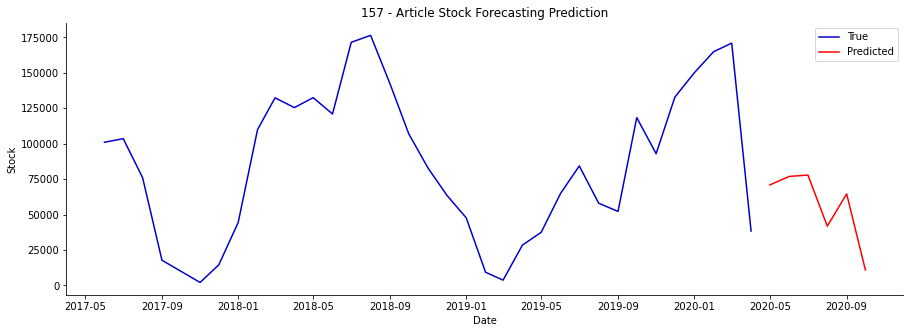

        Date         Stock
0 2020-05-01  70915.890625
1 2020-06-01  76906.578125
2 2020-07-01  77853.710938
3 2020-08-01  41835.308594
4 2020-09-01  64584.593750
5 2020-10-01  10879.464844


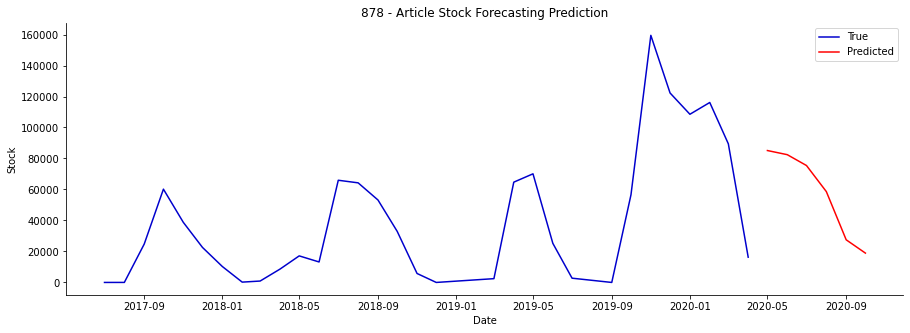

        Date         Stock
0 2020-05-01  85134.968750
1 2020-06-01  82462.570312
2 2020-07-01  75465.523438
3 2020-08-01  58633.085938
4 2020-09-01  27519.695312
5 2020-10-01  18936.365234


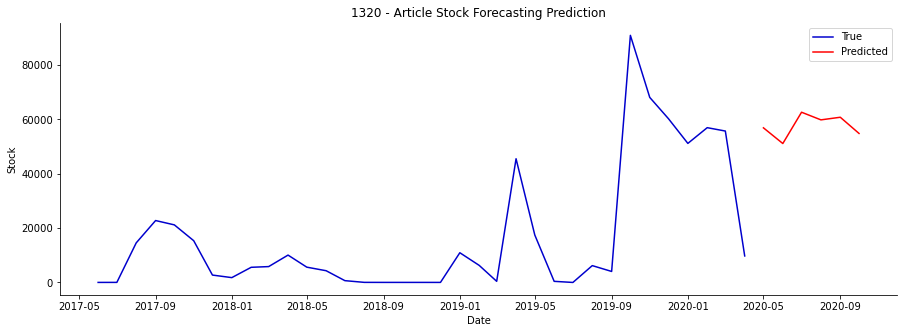

        Date         Stock
0 2020-05-01  56884.265625
1 2020-06-01  51113.281250
2 2020-07-01  62625.835938
3 2020-08-01  59815.078125
4 2020-09-01  60776.750000
5 2020-10-01  54818.652344


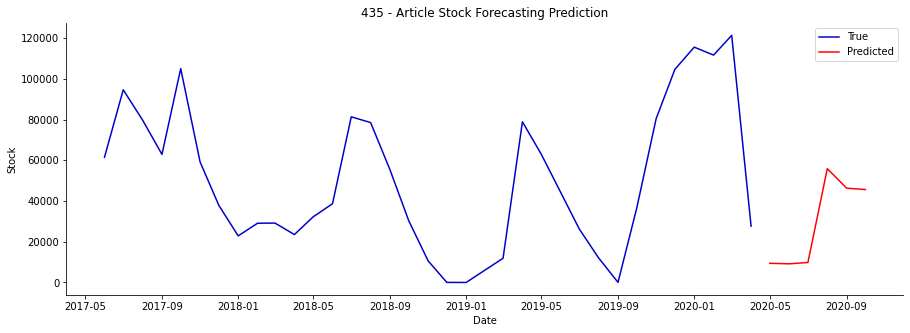

        Date         Stock
0 2020-05-01   9413.420898
1 2020-06-01   9147.516602
2 2020-07-01   9809.246094
3 2020-08-01  55890.101562
4 2020-09-01  46288.449219
5 2020-10-01  45626.949219


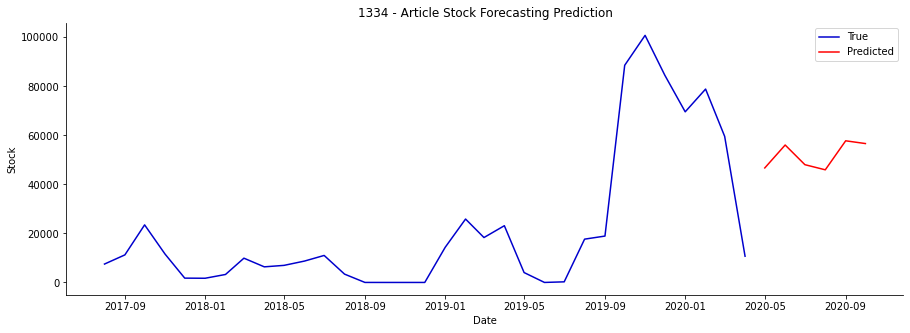

        Date         Stock
0 2020-05-01  46709.480469
1 2020-06-01  56060.980469
2 2020-07-01  48035.890625
3 2020-08-01  45942.230469
4 2020-09-01  57773.777344
5 2020-10-01  56655.136719


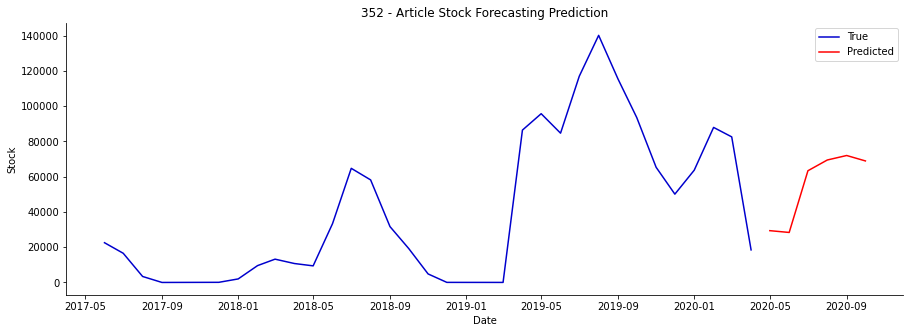

        Date         Stock
0 2020-05-01  29375.548828
1 2020-06-01  28356.248047
2 2020-07-01  63366.636719
3 2020-08-01  69458.671875
4 2020-09-01  72005.085938
5 2020-10-01  68930.414062


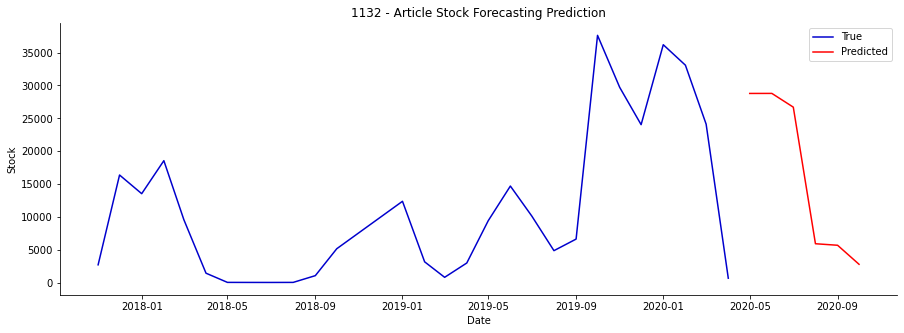

        Date         Stock
0 2020-05-01  28786.572266
1 2020-06-01  28791.255859
2 2020-07-01  26700.378906
3 2020-08-01   5915.115723
4 2020-09-01   5682.463379
5 2020-10-01   2786.966309


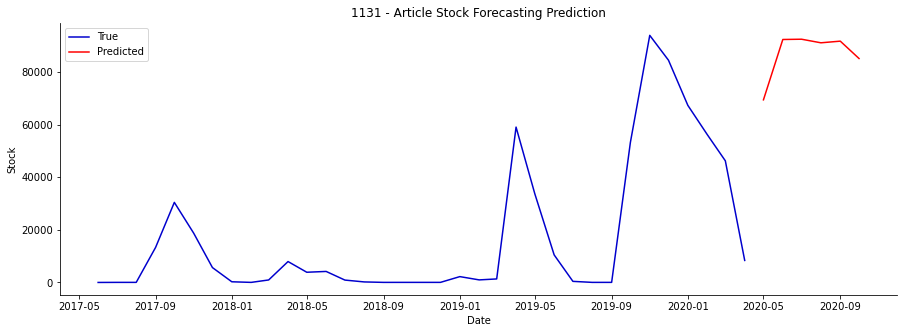

        Date         Stock
0 2020-05-01  69378.585938
1 2020-06-01  92306.664062
2 2020-07-01  92410.515625
3 2020-08-01  91046.890625
4 2020-09-01  91675.132812
5 2020-10-01  85077.718750


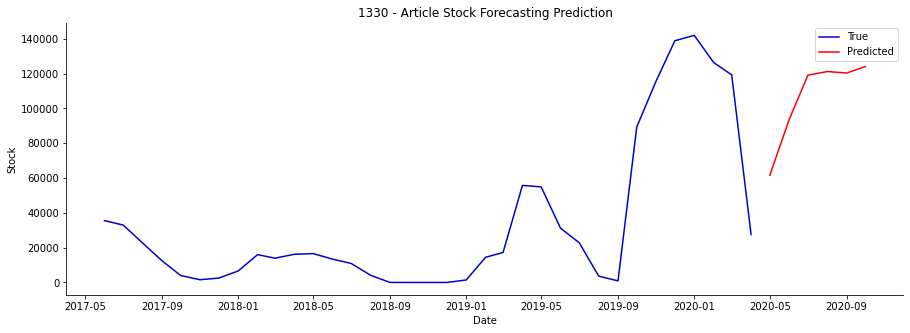

        Date          Stock
0 2020-05-01   61632.171875
1 2020-06-01   93680.945312
2 2020-07-01  119138.789062
3 2020-08-01  121217.718750
4 2020-09-01  120376.898438
5 2020-10-01  124089.906250


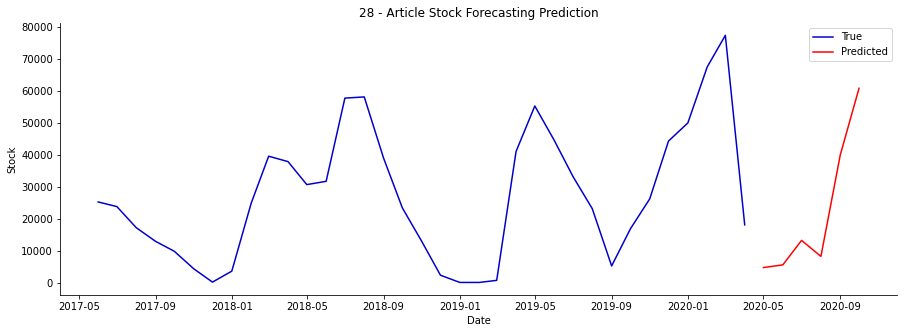

        Date         Stock
0 2020-05-01   4692.230469
1 2020-06-01   5524.162109
2 2020-07-01  13183.458984
3 2020-08-01   8178.964844
4 2020-09-01  39937.765625
5 2020-10-01  60765.578125


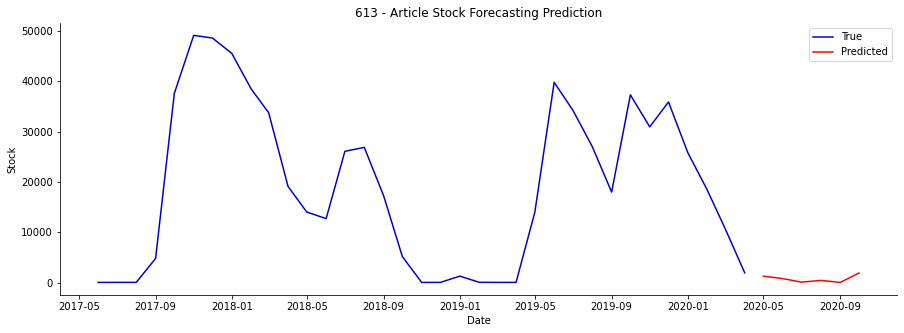

        Date        Stock
0 2020-05-01  1260.574097
1 2020-06-01   777.209351
2 2020-07-01    74.369362
3 2020-08-01   421.821747
4 2020-09-01    23.370272
5 2020-10-01  1893.176514


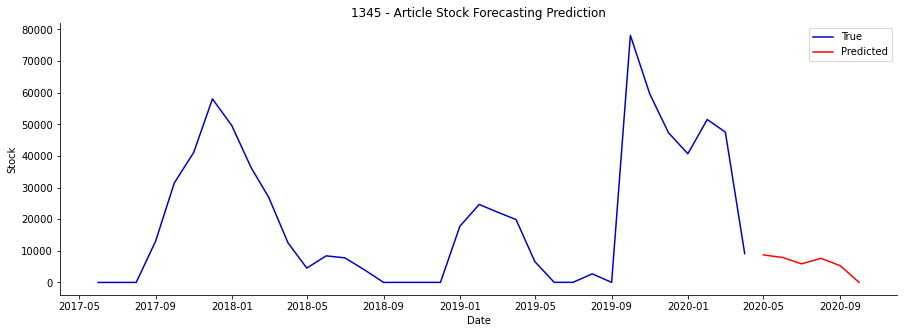

        Date        Stock
0 2020-05-01  8697.842773
1 2020-06-01  7893.270996
2 2020-07-01  5887.316895
3 2020-08-01  7619.807617
4 2020-09-01  5296.152344
5 2020-10-01    33.642570


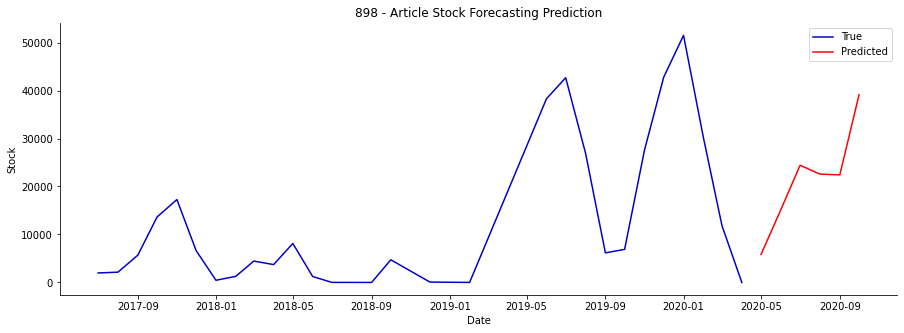

        Date         Stock
0 2020-05-01   5836.847656
1 2020-06-01  15185.934570
2 2020-07-01  24426.146484
3 2020-08-01  22583.869141
4 2020-09-01  22421.597656
5 2020-10-01  39115.257812


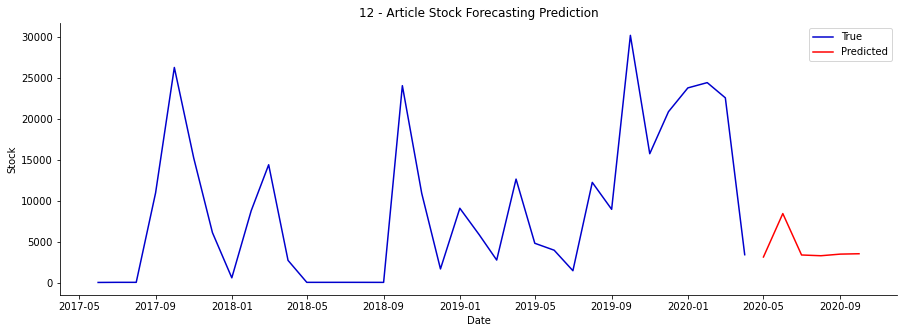

        Date        Stock
0 2020-05-01  3129.607422
1 2020-06-01  8441.671875
2 2020-07-01  3375.669434
3 2020-08-01  3283.454346
4 2020-09-01  3481.529053
5 2020-10-01  3527.263428


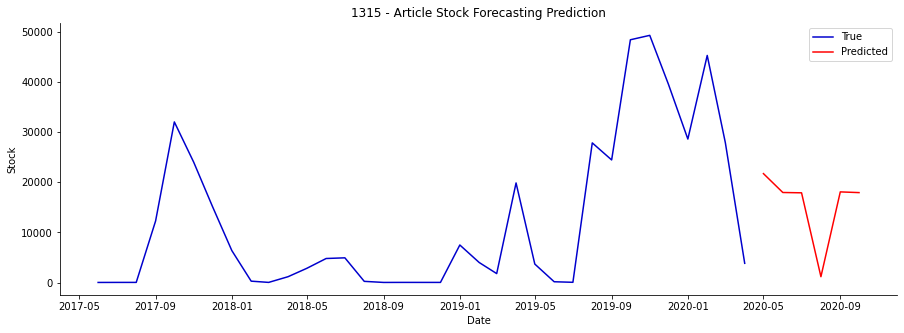

        Date         Stock
0 2020-05-01  21720.044922
1 2020-06-01  17956.568359
2 2020-07-01  17892.750000
3 2020-08-01   1168.883789
4 2020-09-01  18076.761719
5 2020-10-01  17934.443359


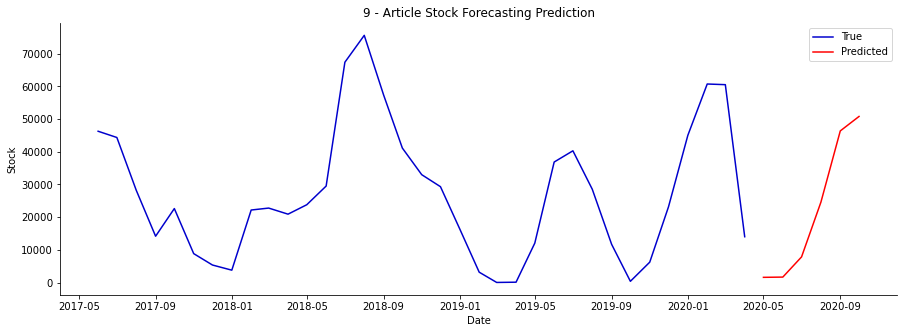

        Date         Stock
0 2020-05-01   1616.281982
1 2020-06-01   1692.471558
2 2020-07-01   7864.631836
3 2020-08-01  24606.835938
4 2020-09-01  46378.992188
5 2020-10-01  50800.710938


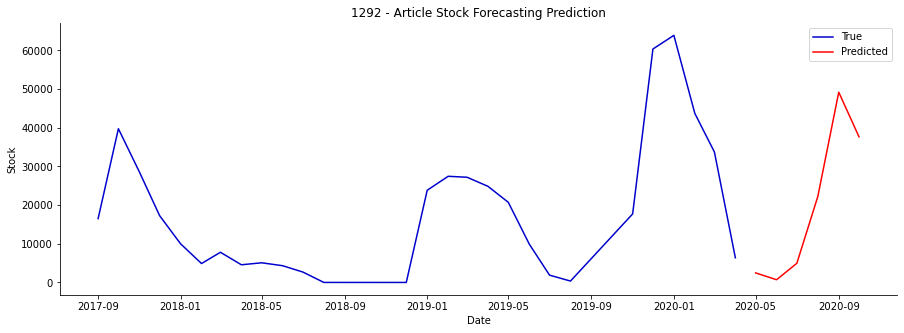

        Date         Stock
0 2020-05-01   2471.879883
1 2020-06-01    702.411743
2 2020-07-01   4957.675293
3 2020-08-01  22216.703125
4 2020-09-01  49193.718750
5 2020-10-01  37649.316406


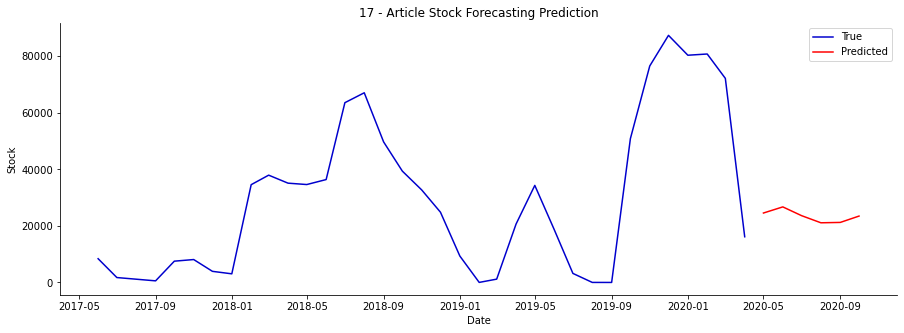

        Date         Stock
0 2020-05-01  24545.640625
1 2020-06-01  26710.794922
2 2020-07-01  23617.277344
3 2020-08-01  21091.748047
4 2020-09-01  21222.660156
5 2020-10-01  23466.332031


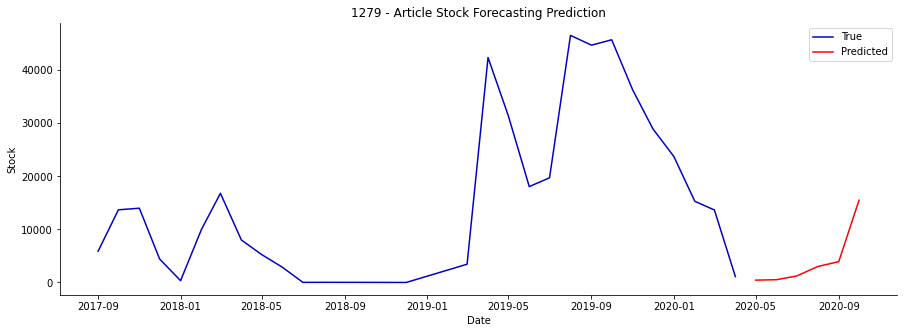

        Date         Stock
0 2020-05-01    437.746490
1 2020-06-01    520.813171
2 2020-07-01   1233.616821
3 2020-08-01   3006.963135
4 2020-09-01   3922.650879
5 2020-10-01  15498.405273


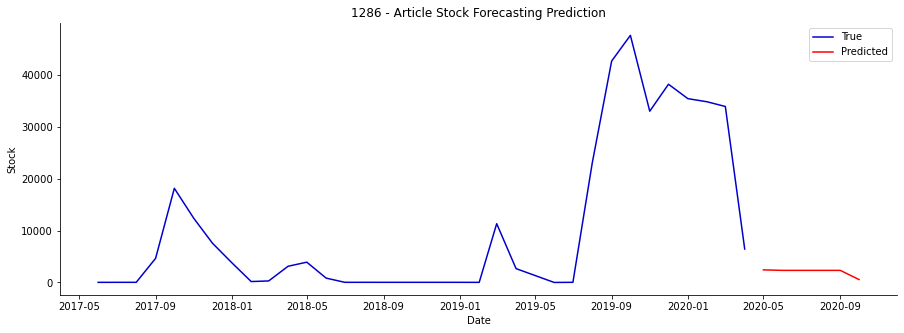

        Date        Stock
0 2020-05-01  2426.926270
1 2020-06-01  2332.700928
2 2020-07-01  2333.347168
3 2020-08-01  2333.208008
4 2020-09-01  2333.250000
5 2020-10-01   560.848267


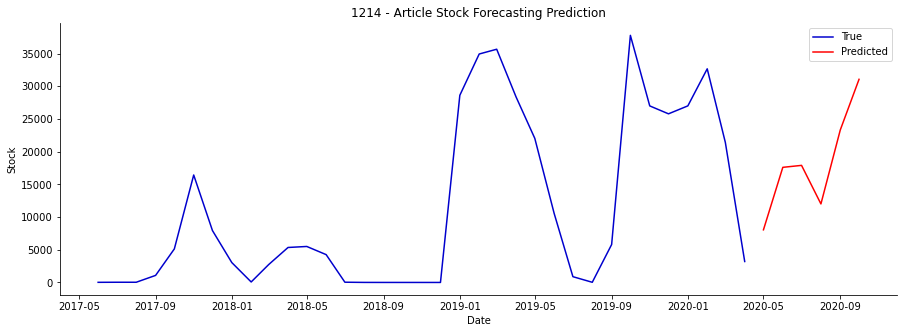

        Date         Stock
0 2020-05-01   8045.851074
1 2020-06-01  17598.687500
2 2020-07-01  17898.253906
3 2020-08-01  12005.770508
4 2020-09-01  23314.384766
5 2020-10-01  31054.808594


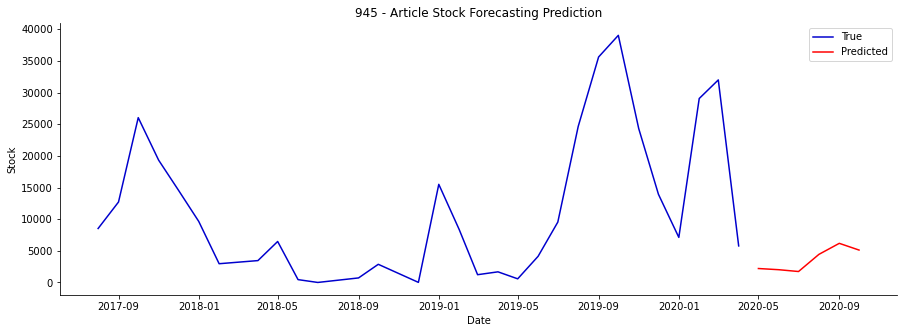

        Date        Stock
0 2020-05-01  2202.076660
1 2020-06-01  2013.980347
2 2020-07-01  1728.319946
3 2020-08-01  4437.572266
4 2020-09-01  6179.644531
5 2020-10-01  5117.871582


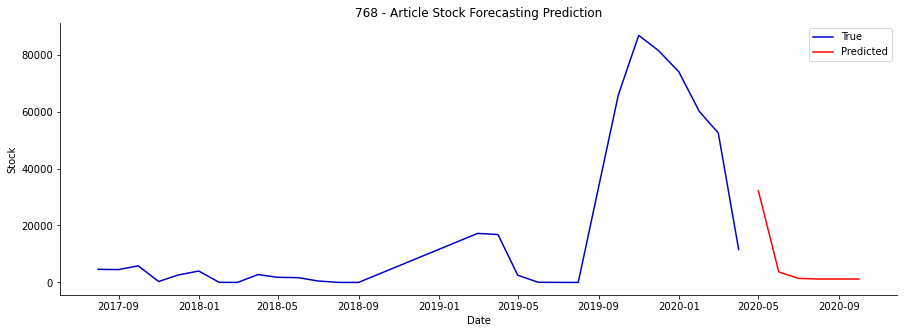

        Date         Stock
0 2020-05-01  32148.035156
1 2020-06-01   3676.487793
2 2020-07-01   1435.194702
3 2020-08-01   1204.332886
4 2020-09-01   1204.428833
5 2020-10-01   1203.751953


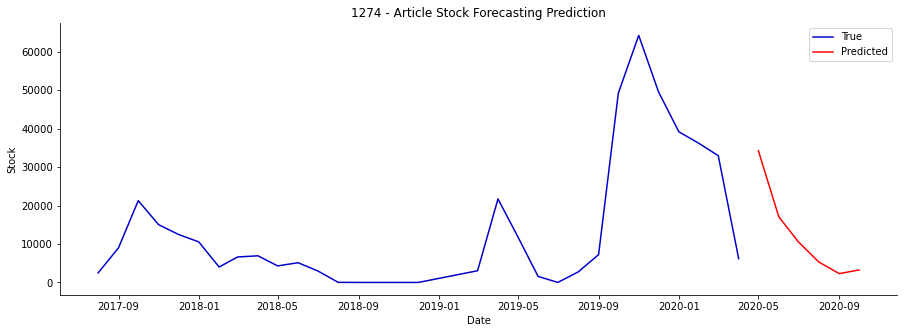

        Date         Stock
0 2020-05-01  34229.500000
1 2020-06-01  17067.912109
2 2020-07-01  10510.751953
3 2020-08-01   5304.957520
4 2020-09-01   2293.537354
5 2020-10-01   3249.381836


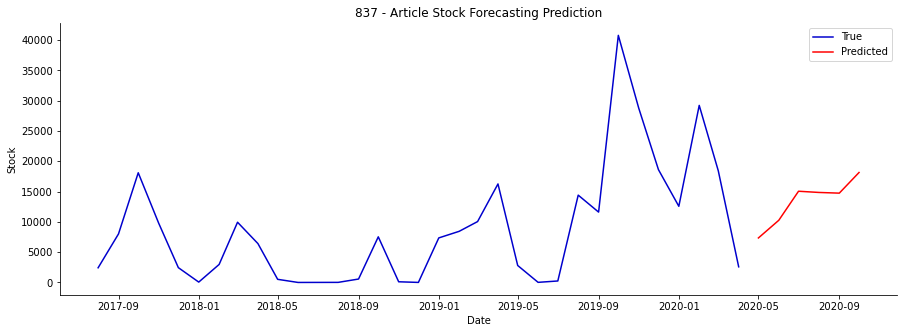

        Date         Stock
0 2020-05-01   7344.148438
1 2020-06-01  10261.938477
2 2020-07-01  15054.439453
3 2020-08-01  14854.735352
4 2020-09-01  14740.225586
5 2020-10-01  18148.082031


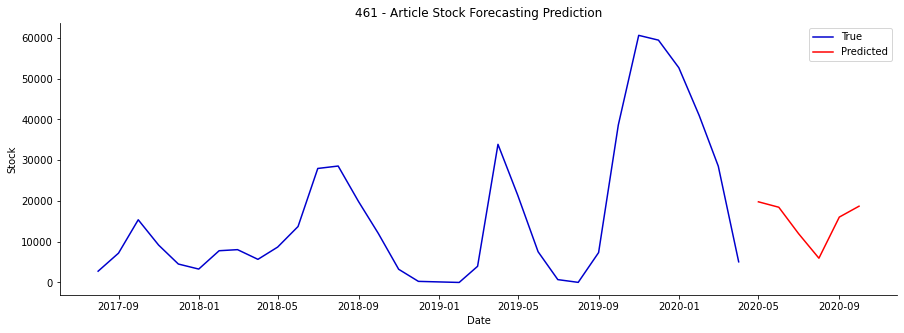

        Date         Stock
0 2020-05-01  19782.050781
1 2020-06-01  18449.830078
2 2020-07-01  11990.173828
3 2020-08-01   5954.553711
4 2020-09-01  16034.103516
5 2020-10-01  18704.367188


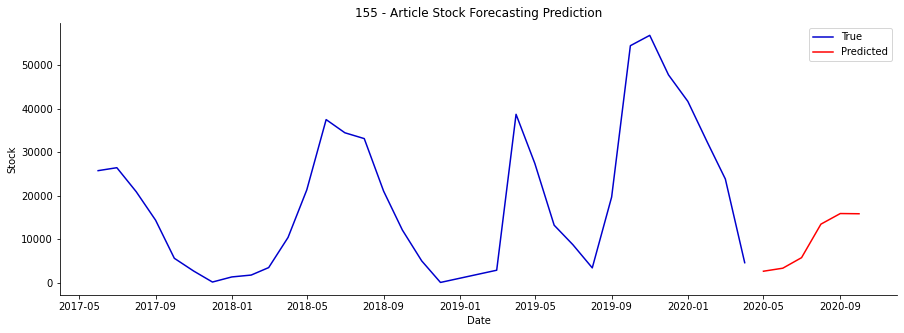

        Date         Stock
0 2020-05-01   2617.767578
1 2020-06-01   3315.163818
2 2020-07-01   5735.691406
3 2020-08-01  13442.244141
4 2020-09-01  15881.251953
5 2020-10-01  15830.438477


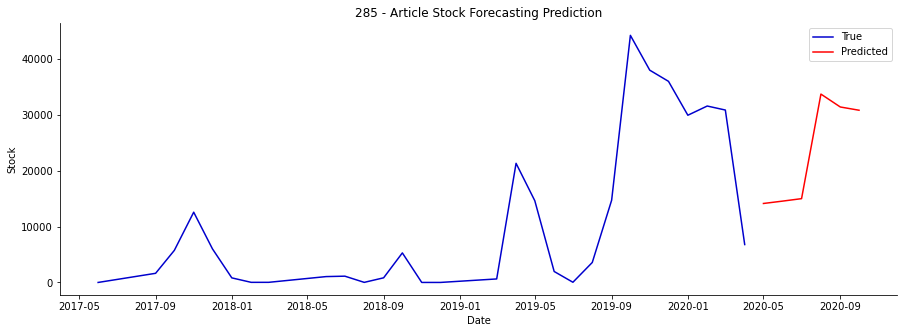

        Date         Stock
0 2020-05-01  14151.408203
1 2020-06-01  14579.629883
2 2020-07-01  15015.723633
3 2020-08-01  33750.378906
4 2020-09-01  31440.423828
5 2020-10-01  30857.878906


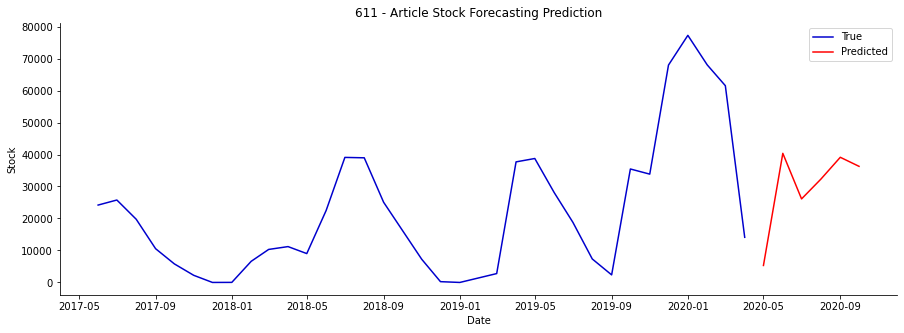

        Date         Stock
0 2020-05-01   5311.444824
1 2020-06-01  40366.128906
2 2020-07-01  26119.335938
3 2020-08-01  32316.289062
4 2020-09-01  39131.683594
5 2020-10-01  36302.371094


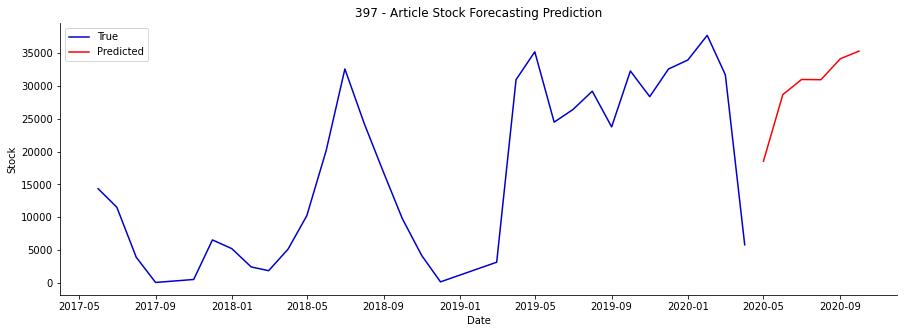

        Date         Stock
0 2020-05-01  18528.546875
1 2020-06-01  28689.423828
2 2020-07-01  31001.267578
3 2020-08-01  30966.632812
4 2020-09-01  34159.558594
5 2020-10-01  35330.449219


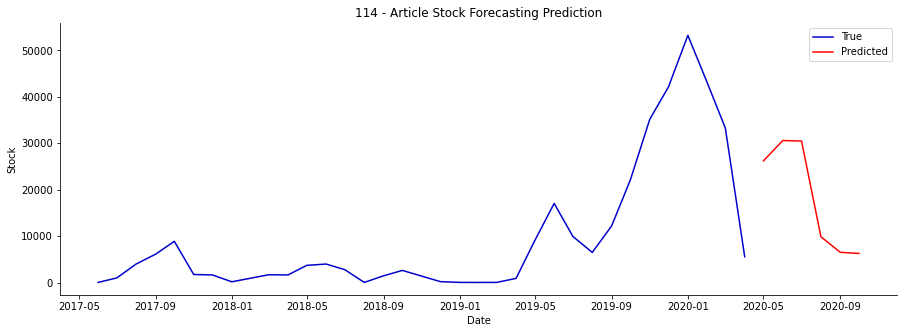

        Date         Stock
0 2020-05-01  26200.798828
1 2020-06-01  30579.007812
2 2020-07-01  30462.791016
3 2020-08-01   9858.565430
4 2020-09-01   6510.717285
5 2020-10-01   6264.438477


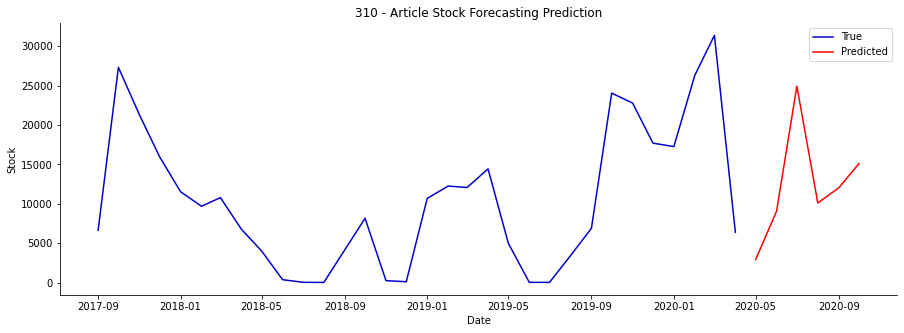

        Date         Stock
0 2020-05-01   2903.953857
1 2020-06-01   9059.550781
2 2020-07-01  24916.466797
3 2020-08-01  10100.189453
4 2020-09-01  12008.540039
5 2020-10-01  15097.980469


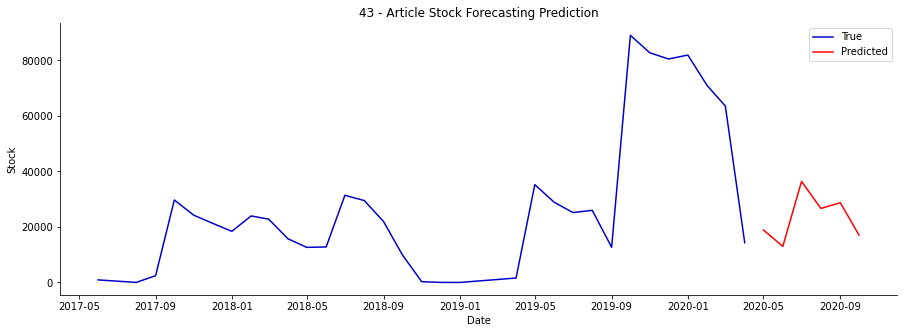

        Date         Stock
0 2020-05-01  18904.636719
1 2020-06-01  12996.968750
2 2020-07-01  36409.046875
3 2020-08-01  26667.994141
4 2020-09-01  28744.744141
5 2020-10-01  17067.011719


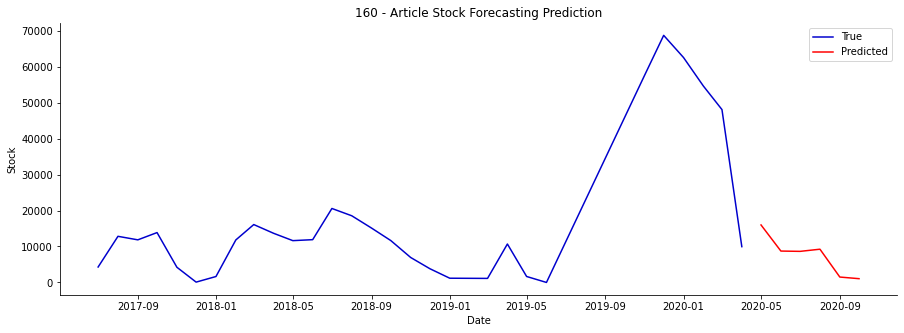

        Date         Stock
0 2020-05-01  15988.730469
1 2020-06-01   8731.225586
2 2020-07-01   8646.035156
3 2020-08-01   9246.533203
4 2020-09-01   1503.166138
5 2020-10-01   1050.398682


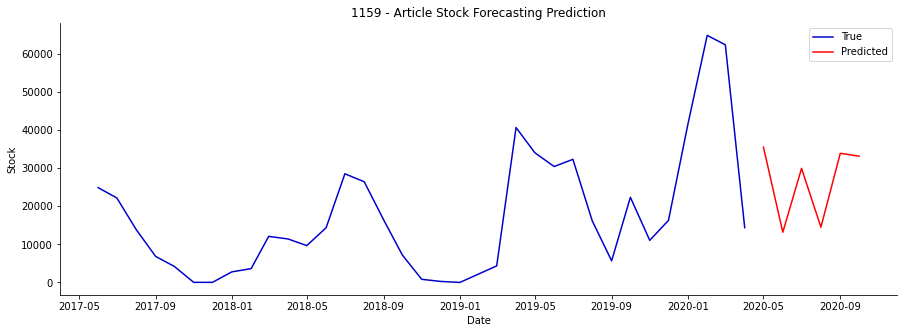

        Date         Stock
0 2020-05-01  35493.457031
1 2020-06-01  13165.371094
2 2020-07-01  29902.951172
3 2020-08-01  14488.041016
4 2020-09-01  33866.808594
5 2020-10-01  33117.988281


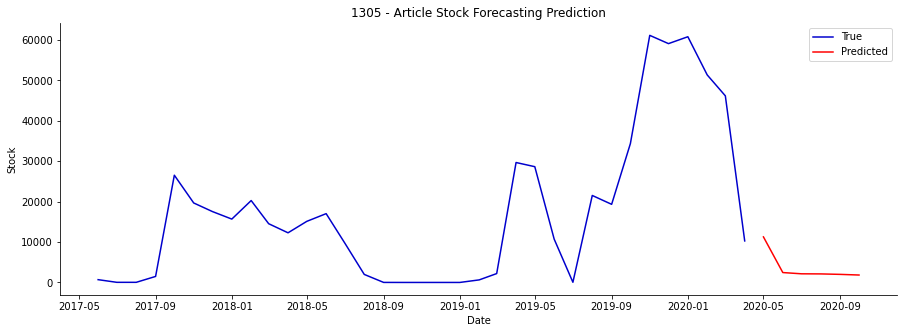

        Date         Stock
0 2020-05-01  11276.371094
1 2020-06-01   2449.138916
2 2020-07-01   2139.636230
3 2020-08-01   2113.457520
4 2020-09-01   1998.031372
5 2020-10-01   1837.616089


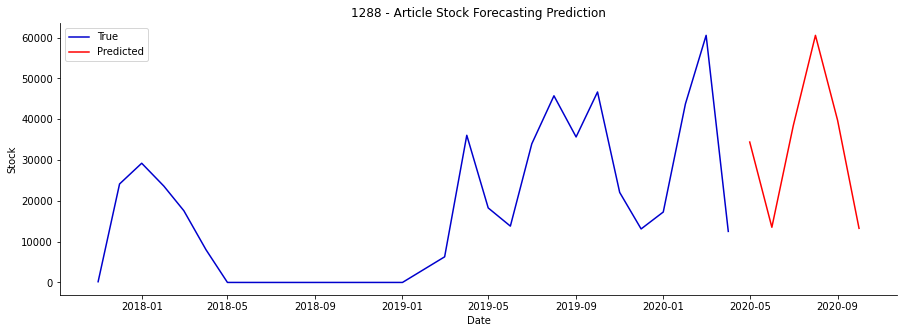

        Date         Stock
0 2020-05-01  34418.468750
1 2020-06-01  13524.919922
2 2020-07-01  38449.687500
3 2020-08-01  60564.980469
4 2020-09-01  39739.789062
5 2020-10-01  13265.749023


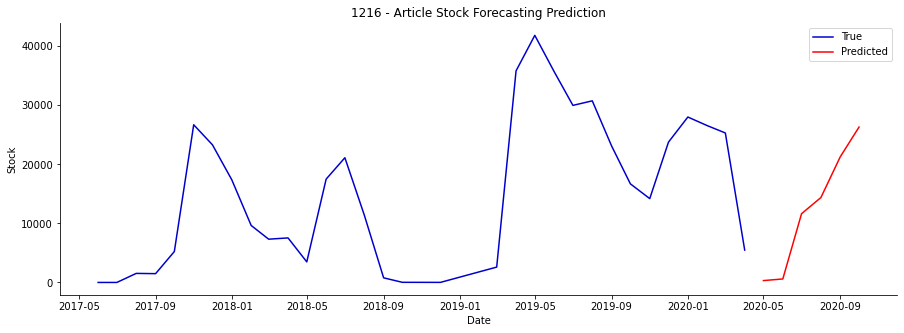

        Date         Stock
0 2020-05-01    323.251892
1 2020-06-01    599.415344
2 2020-07-01  11642.647461
3 2020-08-01  14380.124023
4 2020-09-01  21281.591797
5 2020-10-01  26302.869141


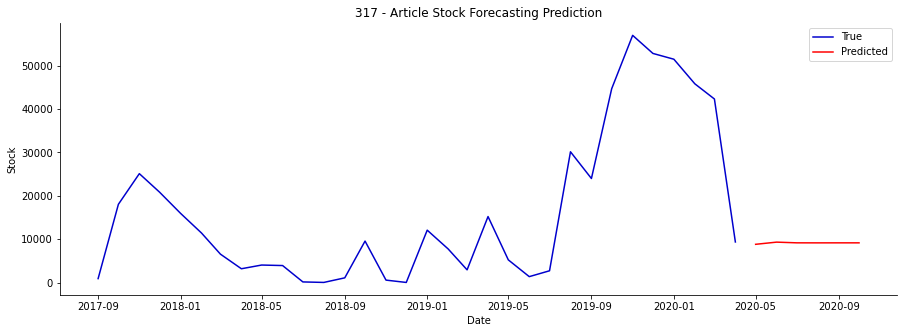

        Date        Stock
0 2020-05-01  8814.828125
1 2020-06-01  9315.927734
2 2020-07-01  9154.215820
3 2020-08-01  9146.860352
4 2020-09-01  9151.970703
5 2020-10-01  9151.205078


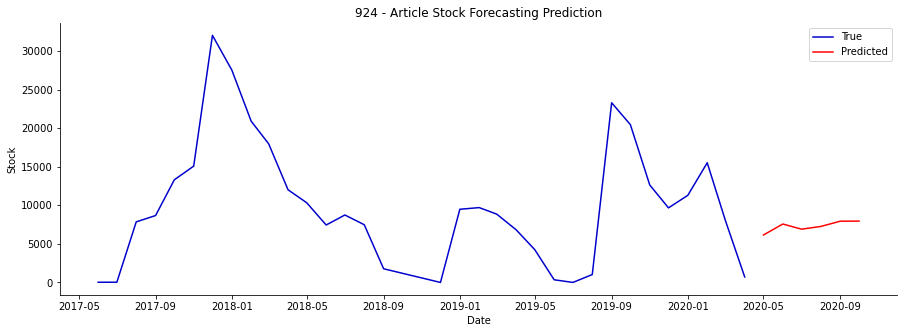

        Date        Stock
0 2020-05-01  6151.613281
1 2020-06-01  7574.219238
2 2020-07-01  6906.082031
3 2020-08-01  7261.745117
4 2020-09-01  7940.906738
5 2020-10-01  7951.191406


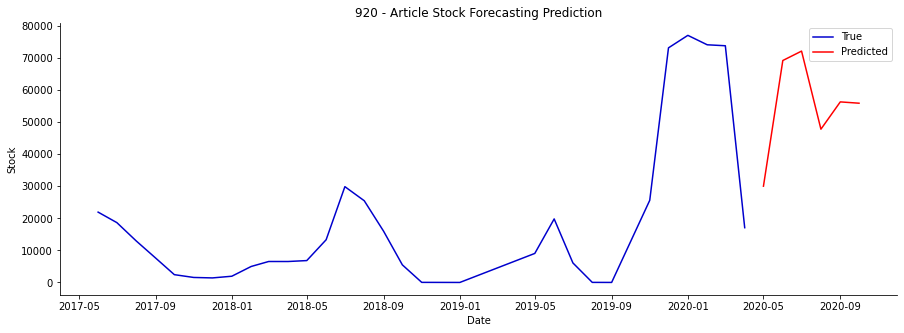

        Date         Stock
0 2020-05-01  30015.419922
1 2020-06-01  69195.195312
2 2020-07-01  72127.625000
3 2020-08-01  47787.531250
4 2020-09-01  56293.230469
5 2020-10-01  55884.675781


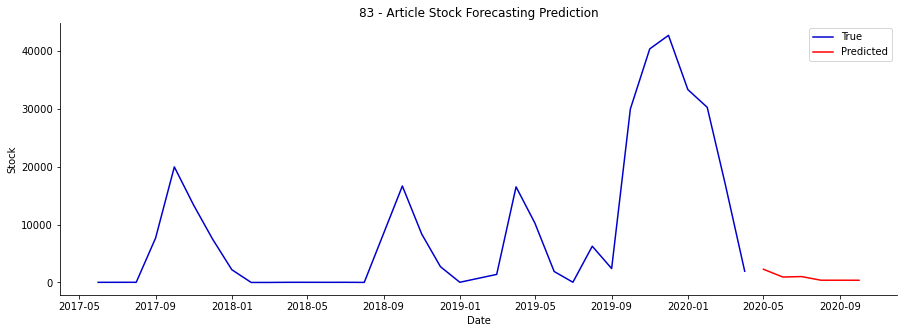

        Date        Stock
0 2020-05-01  2280.009277
1 2020-06-01   943.766663
2 2020-07-01  1018.231140
3 2020-08-01   390.397919
4 2020-09-01   390.399017
5 2020-10-01   385.552094


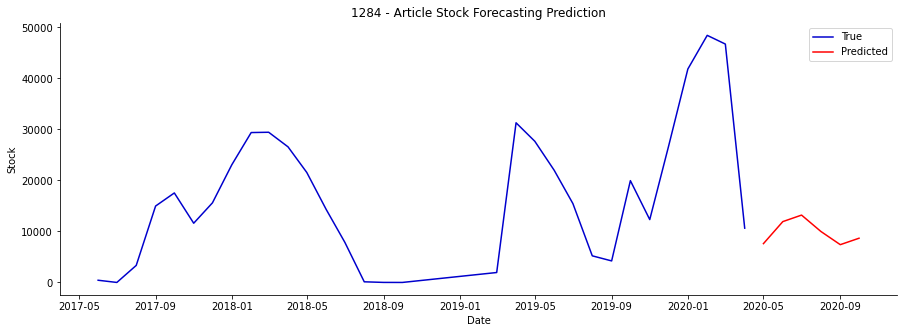

        Date         Stock
0 2020-05-01   7608.960449
1 2020-06-01  11924.859375
2 2020-07-01  13199.907227
3 2020-08-01   9987.624023
4 2020-09-01   7406.115234
5 2020-10-01   8668.310547


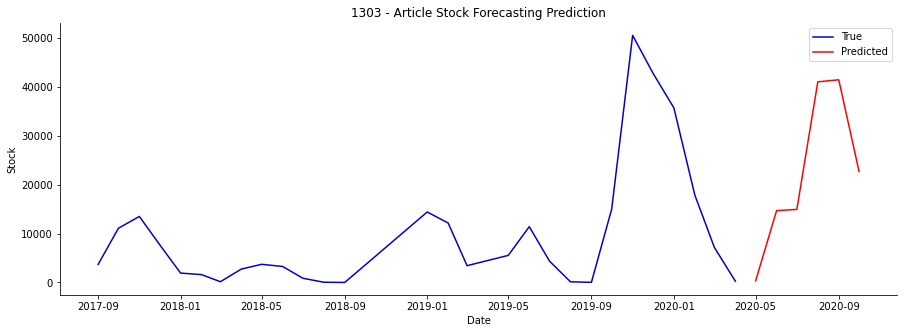

        Date         Stock
0 2020-05-01    331.632599
1 2020-06-01  14674.642578
2 2020-07-01  14924.185547
3 2020-08-01  40987.476562
4 2020-09-01  41415.960938
5 2020-10-01  22696.259766


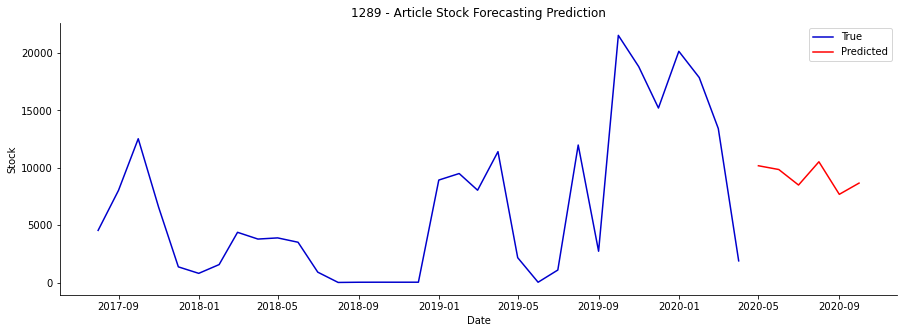

        Date         Stock
0 2020-05-01  10173.462891
1 2020-06-01   9845.208984
2 2020-07-01   8493.964844
3 2020-08-01  10519.050781
4 2020-09-01   7684.368652
5 2020-10-01   8661.530273


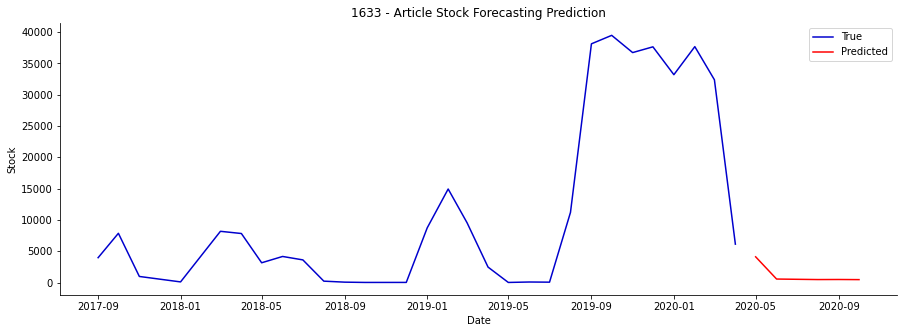

        Date        Stock
0 2020-05-01  4114.663086
1 2020-06-01   566.064941
2 2020-07-01   525.804199
3 2020-08-01   483.503540
4 2020-09-01   494.222839
5 2020-10-01   474.063599


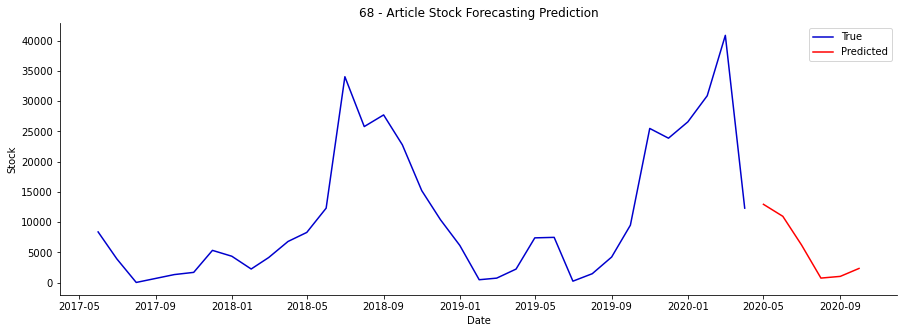

        Date         Stock
0 2020-05-01  12945.248047
1 2020-06-01  10962.537109
2 2020-07-01   6215.191406
3 2020-08-01    744.328430
4 2020-09-01   1027.370972
5 2020-10-01   2341.596436


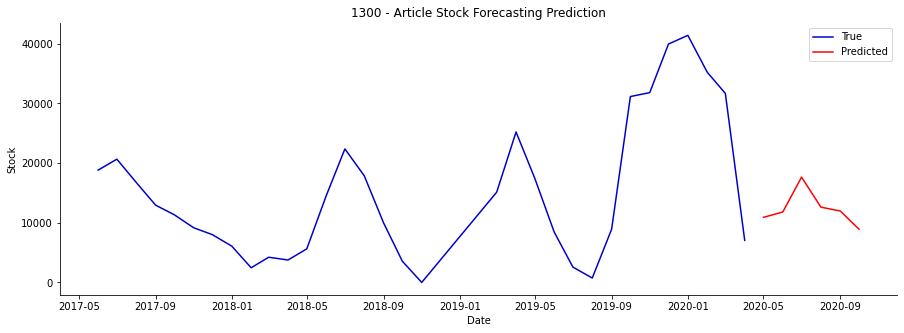

        Date         Stock
0 2020-05-01  10908.077148
1 2020-06-01  11803.931641
2 2020-07-01  17639.687500
3 2020-08-01  12616.543945
4 2020-09-01  11962.851562
5 2020-10-01   8916.906250


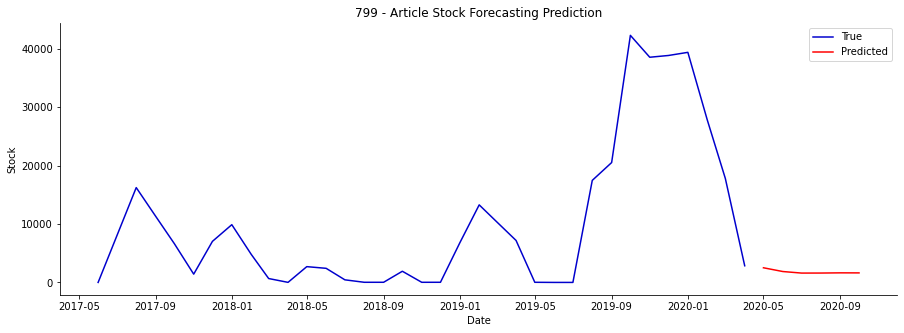

        Date        Stock
0 2020-05-01  2512.113037
1 2020-06-01  1869.793945
2 2020-07-01  1604.382812
3 2020-08-01  1609.416748
4 2020-09-01  1643.484009
5 2020-10-01  1635.910889


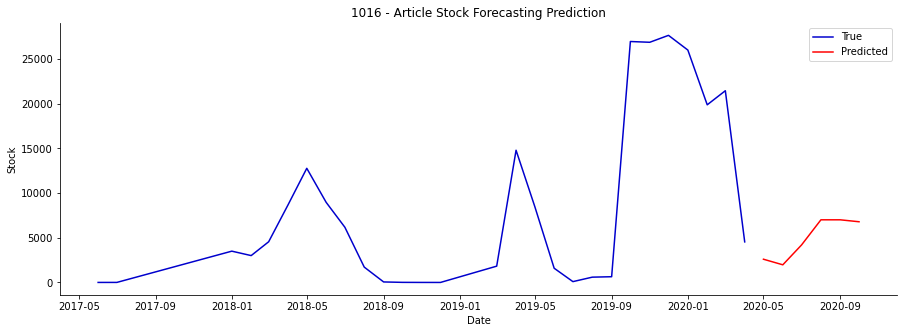

        Date        Stock
0 2020-05-01  2601.852539
1 2020-06-01  1976.114258
2 2020-07-01  4199.542969
3 2020-08-01  7012.128906
4 2020-09-01  7012.009766
5 2020-10-01  6795.311035


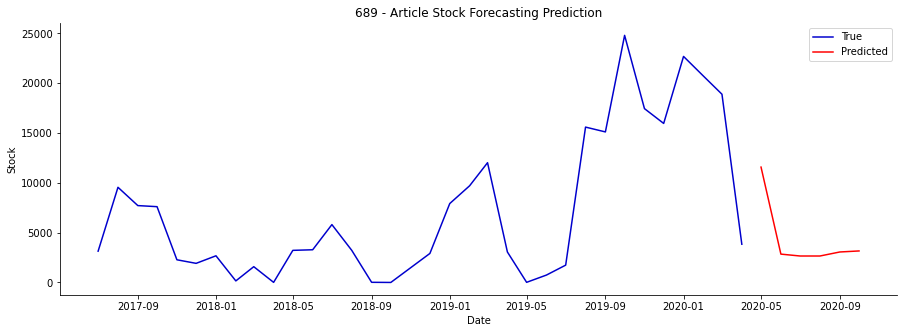

        Date         Stock
0 2020-05-01  11575.730469
1 2020-06-01   2844.356689
2 2020-07-01   2655.531006
3 2020-08-01   2655.515137
4 2020-09-01   3058.773682
5 2020-10-01   3162.725586


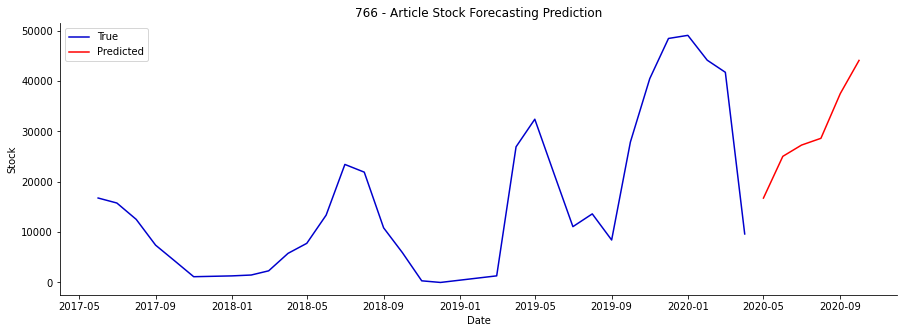

        Date         Stock
0 2020-05-01  16747.410156
1 2020-06-01  25031.160156
2 2020-07-01  27269.697266
3 2020-08-01  28610.902344
4 2020-09-01  37488.117188
5 2020-10-01  44069.710938


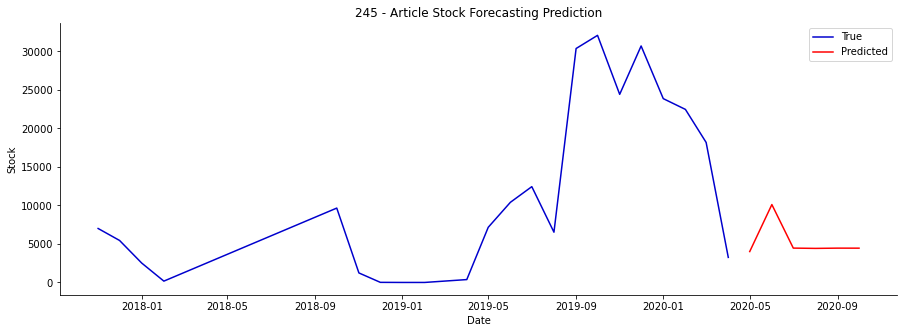

        Date         Stock
0 2020-05-01   4009.970459
1 2020-06-01  10110.000977
2 2020-07-01   4458.945312
3 2020-08-01   4421.560059
4 2020-09-01   4454.776855
5 2020-10-01   4450.775391


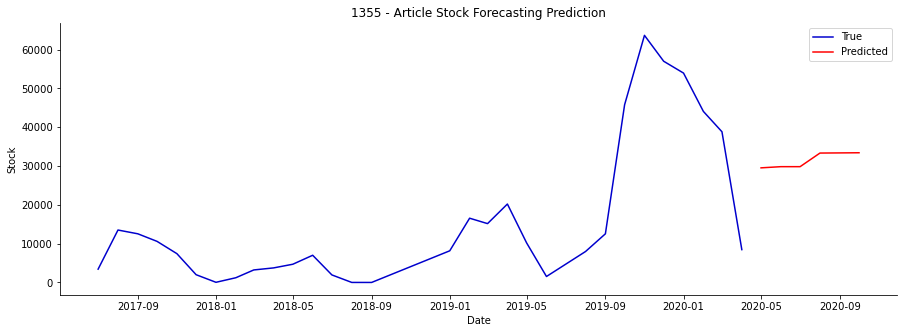

        Date         Stock
0 2020-05-01  29530.470703
1 2020-06-01  29834.306641
2 2020-07-01  29834.667969
3 2020-08-01  33340.660156
4 2020-09-01  33379.656250
5 2020-10-01  33419.070312


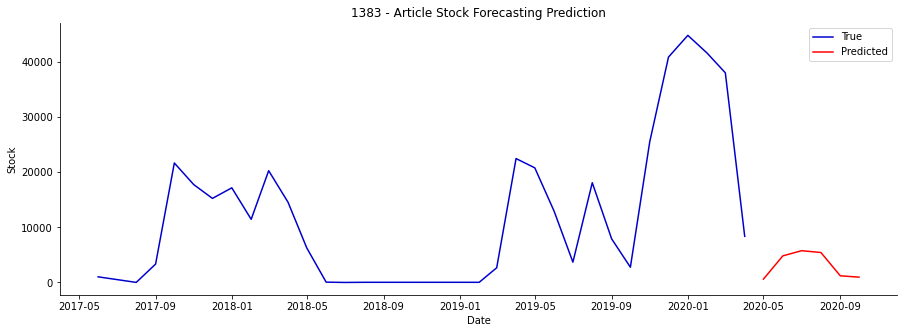

        Date        Stock
0 2020-05-01   610.414612
1 2020-06-01  4826.521973
2 2020-07-01  5767.012695
3 2020-08-01  5441.862305
4 2020-09-01  1210.782471
5 2020-10-01   964.190796


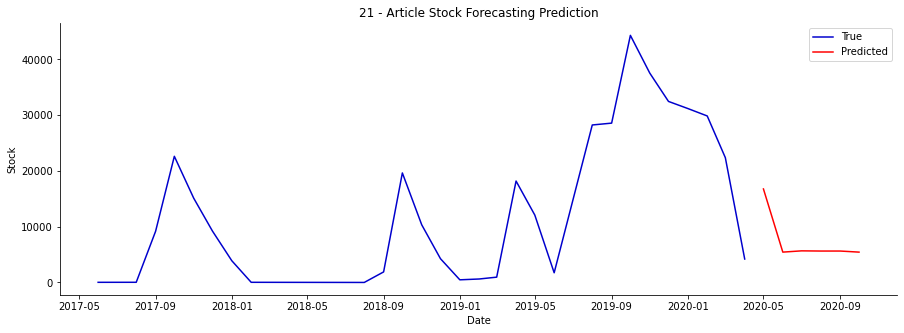

        Date         Stock
0 2020-05-01  16772.720703
1 2020-06-01   5443.810547
2 2020-07-01   5669.528320
3 2020-08-01   5635.394531
4 2020-09-01   5635.450195
5 2020-10-01   5441.641113


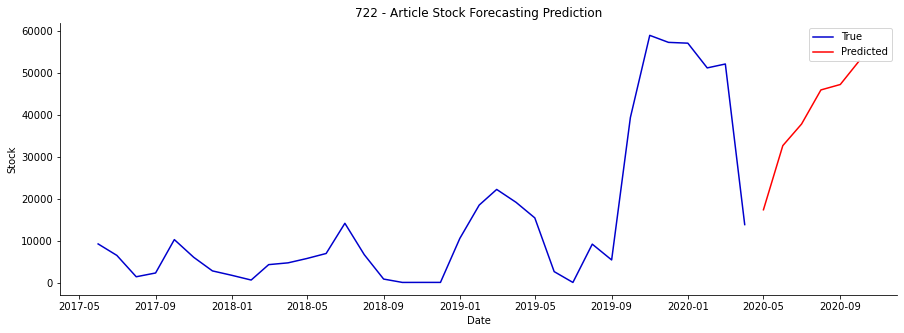

        Date         Stock
0 2020-05-01  17353.708984
1 2020-06-01  32647.867188
2 2020-07-01  37796.718750
3 2020-08-01  45932.398438
4 2020-09-01  47226.046875
5 2020-10-01  52802.816406


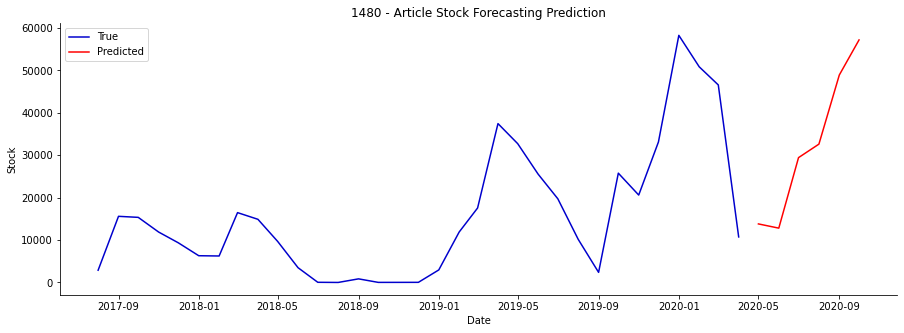

        Date         Stock
0 2020-05-01  13803.020508
1 2020-06-01  12808.050781
2 2020-07-01  29423.419922
3 2020-08-01  32603.439453
4 2020-09-01  48887.898438
5 2020-10-01  57157.484375


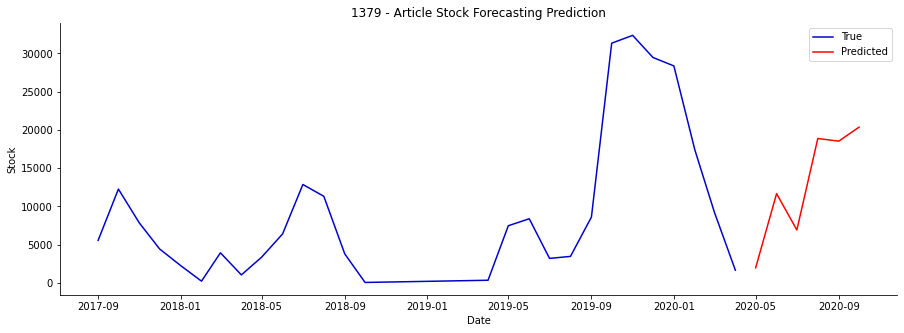

        Date         Stock
0 2020-05-01   1951.770020
1 2020-06-01  11662.165039
2 2020-07-01   6905.987793
3 2020-08-01  18876.498047
4 2020-09-01  18527.076172
5 2020-10-01  20357.800781


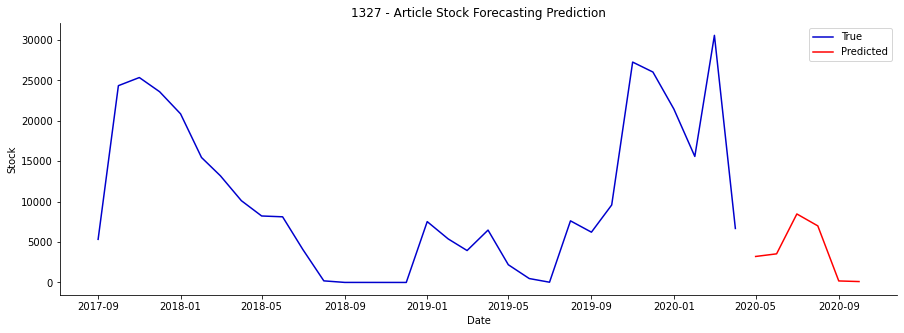

        Date        Stock
0 2020-05-01  3216.200928
1 2020-06-01  3540.868652
2 2020-07-01  8475.363281
3 2020-08-01  7000.542480
4 2020-09-01   187.474136
5 2020-10-01   112.704659


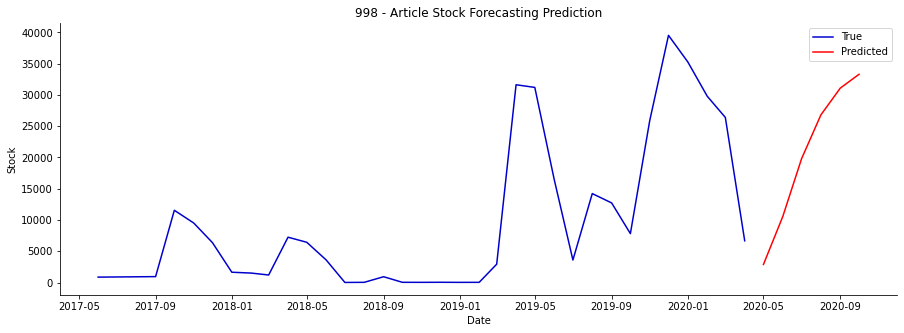

        Date         Stock
0 2020-05-01   2885.209717
1 2020-06-01  10565.952148
2 2020-07-01  19789.539062
3 2020-08-01  26810.474609
4 2020-09-01  31086.906250
5 2020-10-01  33293.765625


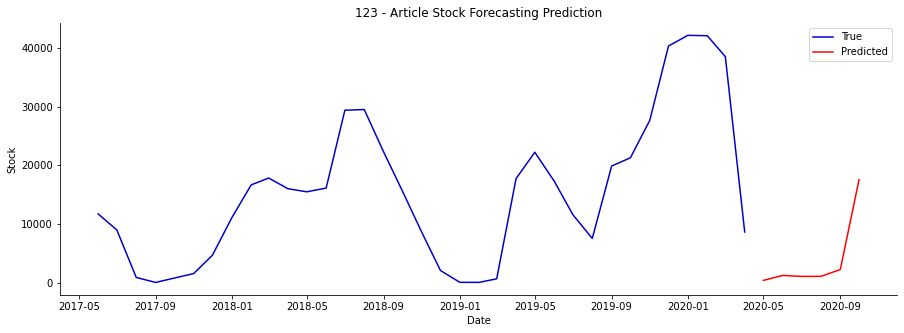

        Date         Stock
0 2020-05-01    370.629181
1 2020-06-01   1206.405640
2 2020-07-01   1043.652466
3 2020-08-01   1051.497314
4 2020-09-01   2206.856934
5 2020-10-01  17532.394531


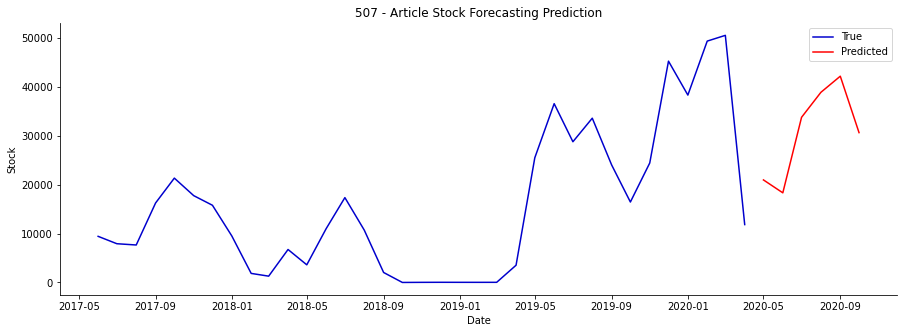

        Date         Stock
0 2020-05-01  20953.425781
1 2020-06-01  18314.464844
2 2020-07-01  33745.335938
3 2020-08-01  38855.195312
4 2020-09-01  42145.500000
5 2020-10-01  30614.568359


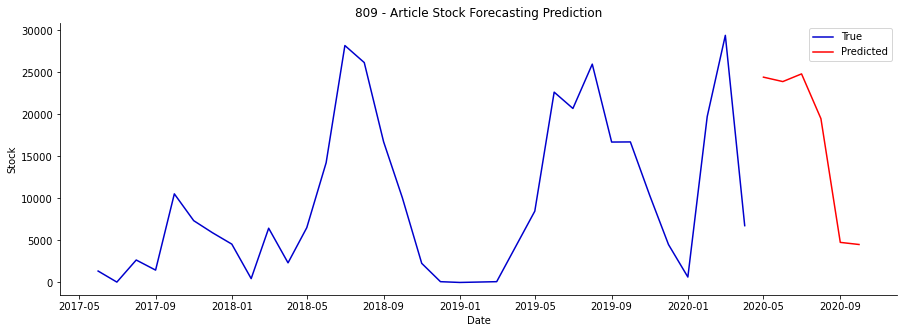

        Date         Stock
0 2020-05-01  24441.951172
1 2020-06-01  23916.761719
2 2020-07-01  24830.056641
3 2020-08-01  19502.240234
4 2020-09-01   4772.114746
5 2020-10-01   4519.984863


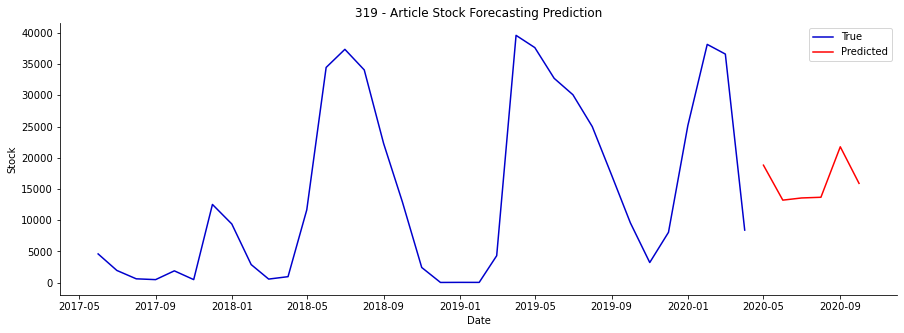

        Date         Stock
0 2020-05-01  18805.865234
1 2020-06-01  13204.196289
2 2020-07-01  13552.885742
3 2020-08-01  13664.245117
4 2020-09-01  21752.324219
5 2020-10-01  15889.614258


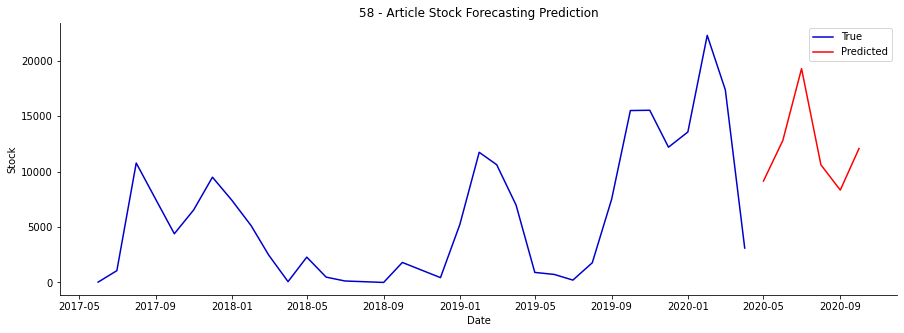

        Date         Stock
0 2020-05-01   9144.796875
1 2020-06-01  12801.718750
2 2020-07-01  19283.003906
3 2020-08-01  10611.208008
4 2020-09-01   8331.708984
5 2020-10-01  12084.557617


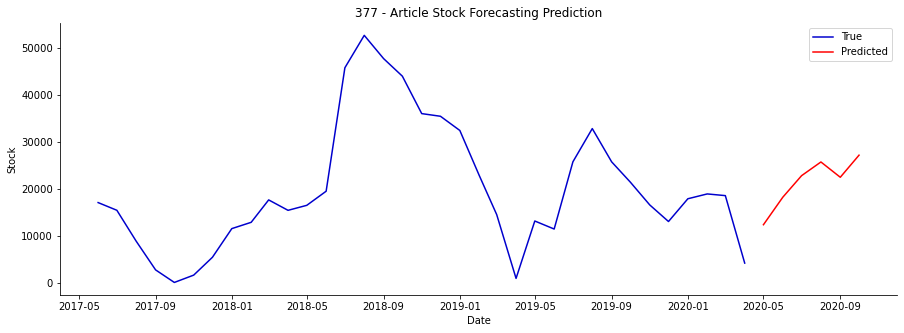

        Date         Stock
0 2020-05-01  12329.911133
1 2020-06-01  18180.906250
2 2020-07-01  22757.587891
3 2020-08-01  25672.791016
4 2020-09-01  22421.804688
5 2020-10-01  27120.857422


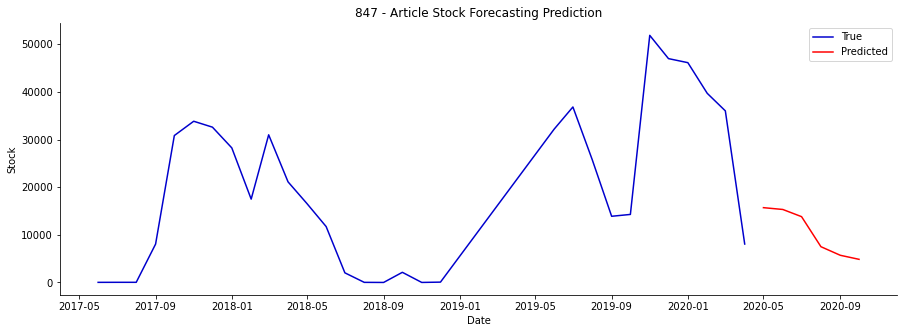

        Date         Stock
0 2020-05-01  15699.102539
1 2020-06-01  15319.458008
2 2020-07-01  13811.750977
3 2020-08-01   7505.687500
4 2020-09-01   5704.169922
5 2020-10-01   4855.265137


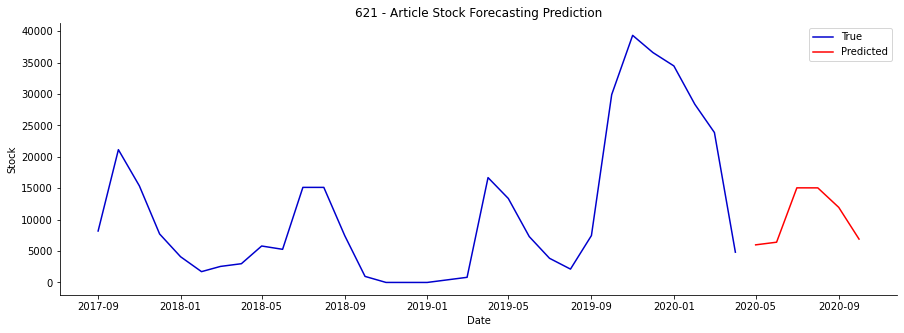

        Date         Stock
0 2020-05-01   5987.565430
1 2020-06-01   6408.643555
2 2020-07-01  15063.400391
3 2020-08-01  15058.769531
4 2020-09-01  11951.359375
5 2020-10-01   6904.855469


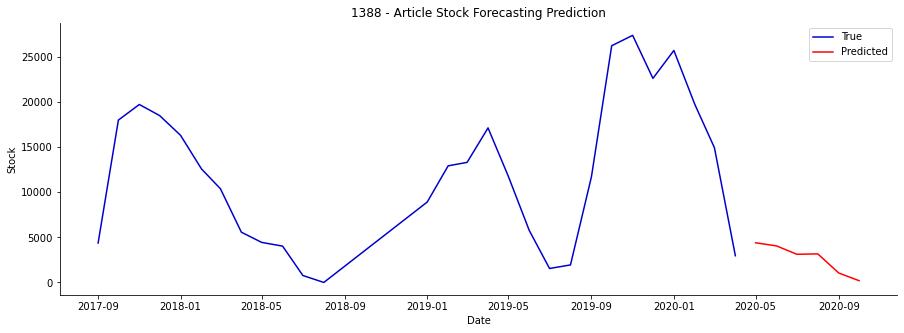

        Date        Stock
0 2020-05-01  4401.996582
1 2020-06-01  4052.347168
2 2020-07-01  3128.227051
3 2020-08-01  3170.158203
4 2020-09-01  1051.281982
5 2020-10-01   202.175034


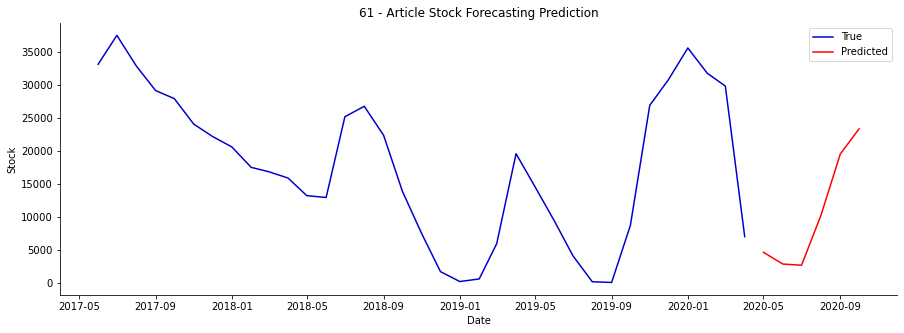

        Date         Stock
0 2020-05-01   4608.285156
1 2020-06-01   2825.823486
2 2020-07-01   2644.044678
3 2020-08-01  10215.904297
4 2020-09-01  19522.095703
5 2020-10-01  23337.390625


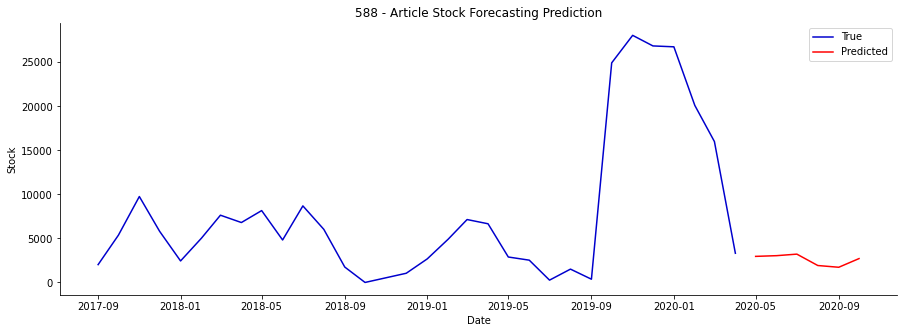

        Date        Stock
0 2020-05-01  2962.457520
1 2020-06-01  3042.417236
2 2020-07-01  3217.217285
3 2020-08-01  1923.825195
4 2020-09-01  1726.369873
5 2020-10-01  2711.807373


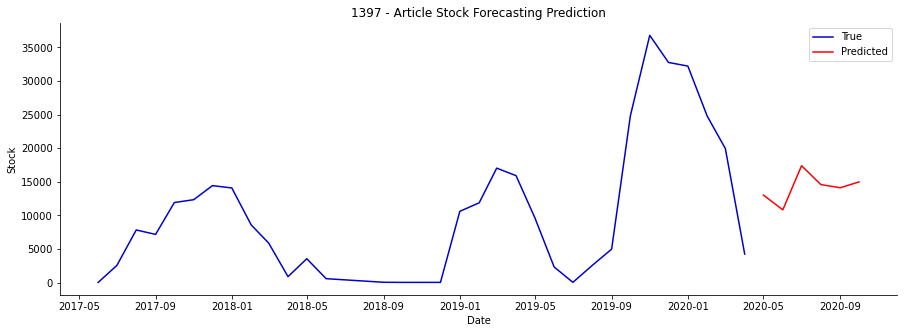

        Date         Stock
0 2020-05-01  13026.480469
1 2020-06-01  10825.064453
2 2020-07-01  17396.052734
3 2020-08-01  14585.429688
4 2020-09-01  14117.318359
5 2020-10-01  14986.416992


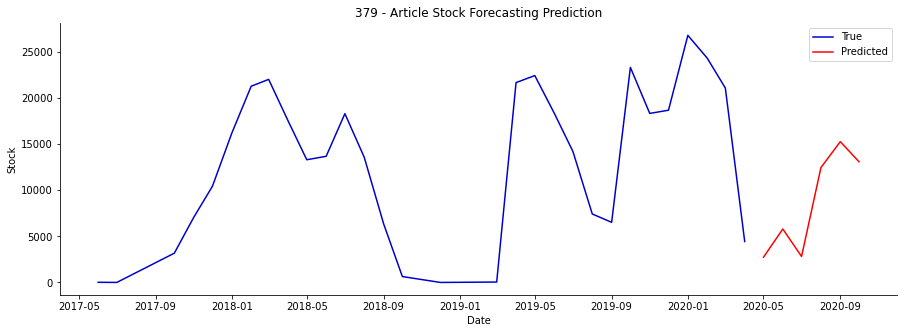

        Date         Stock
0 2020-05-01   2732.351318
1 2020-06-01   5794.117188
2 2020-07-01   2819.465332
3 2020-08-01  12445.418945
4 2020-09-01  15260.394531
5 2020-10-01  13082.842773


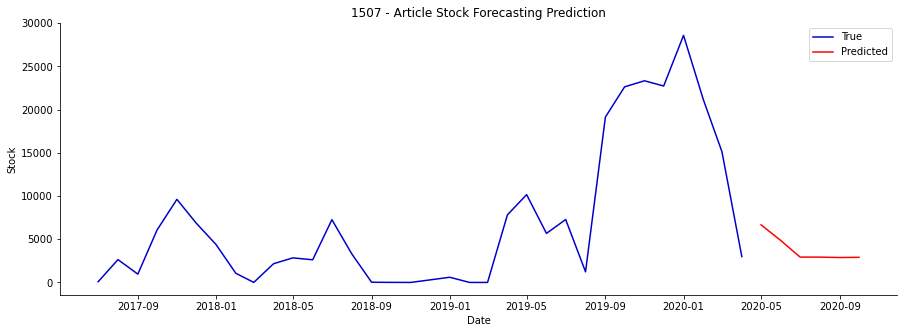

        Date        Stock
0 2020-05-01  6670.285645
1 2020-06-01  4841.097168
2 2020-07-01  2934.627441
3 2020-08-01  2930.447021
4 2020-09-01  2884.086670
5 2020-10-01  2908.486816


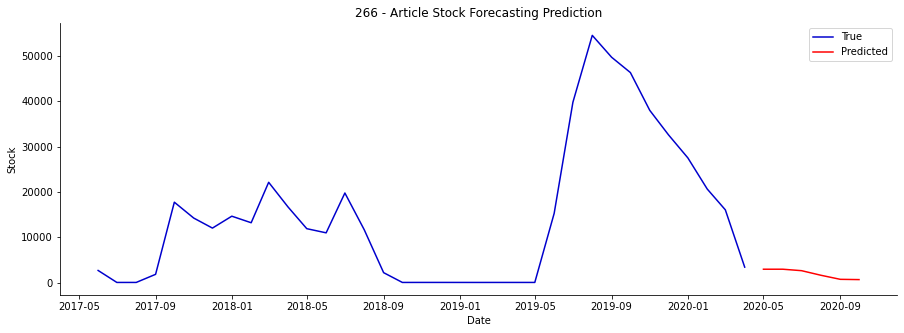

        Date        Stock
0 2020-05-01  2944.980469
1 2020-06-01  2947.094482
2 2020-07-01  2624.309570
3 2020-08-01  1612.526001
4 2020-09-01   715.538940
5 2020-10-01   655.705688


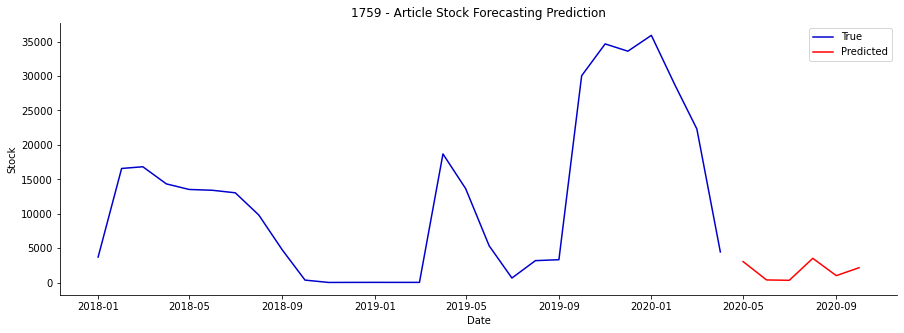

        Date        Stock
0 2020-05-01  3051.514404
1 2020-06-01   383.167542
2 2020-07-01   331.292480
3 2020-08-01  3524.658203
4 2020-09-01  1010.060120
5 2020-10-01  2158.426514


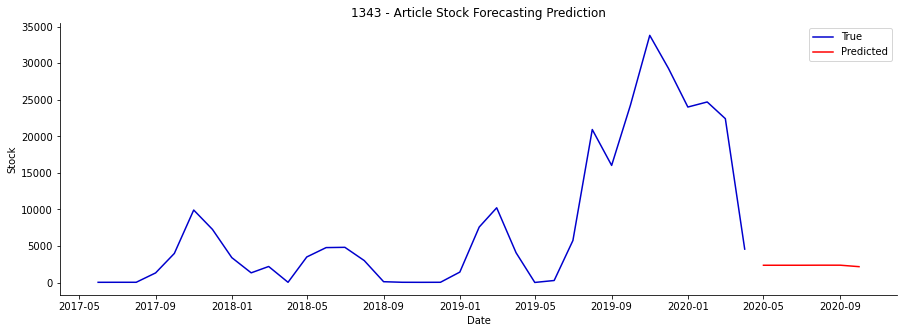

        Date        Stock
0 2020-05-01  2360.740723
1 2020-06-01  2360.625244
2 2020-07-01  2361.472900
3 2020-08-01  2369.947510
4 2020-09-01  2368.270752
5 2020-10-01  2167.508545


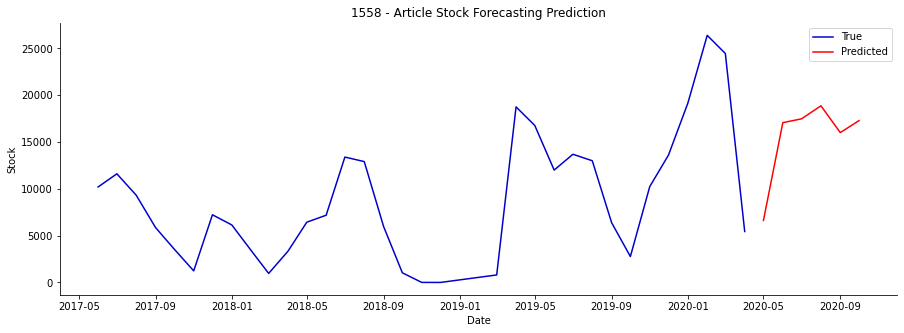

        Date         Stock
0 2020-05-01   6629.244141
1 2020-06-01  17066.871094
2 2020-07-01  17478.664062
3 2020-08-01  18868.201172
4 2020-09-01  16007.327148
5 2020-10-01  17286.960938


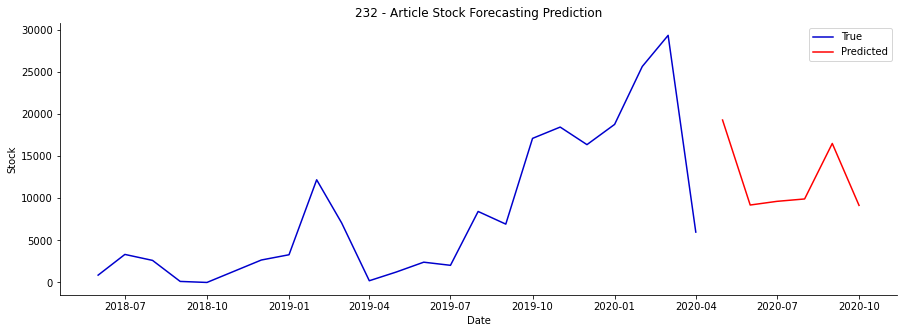

        Date         Stock
0 2020-05-01  19271.113281
1 2020-06-01   9186.557617
2 2020-07-01   9622.400391
3 2020-08-01   9905.361328
4 2020-09-01  16488.964844
5 2020-10-01   9142.442383


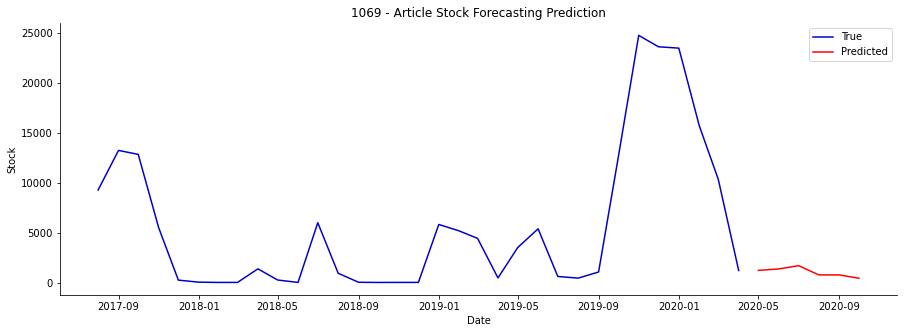

        Date        Stock
0 2020-05-01  1233.034302
1 2020-06-01  1379.680176
2 2020-07-01  1705.579468
3 2020-08-01   780.648865
4 2020-09-01   779.681213
5 2020-10-01   443.895844


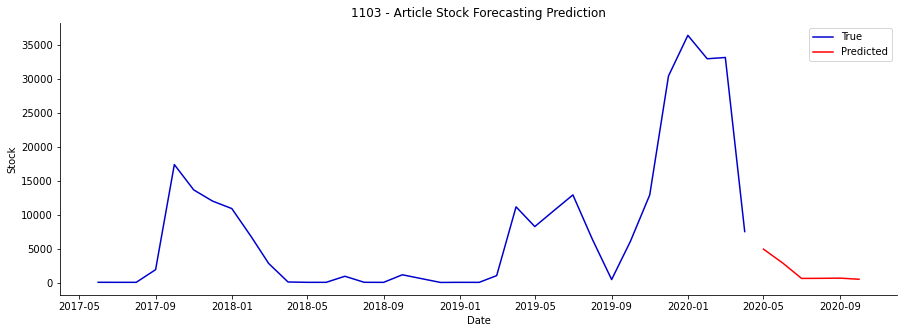

        Date        Stock
0 2020-05-01  4916.503906
1 2020-06-01  2862.381592
2 2020-07-01   606.234558
3 2020-08-01   619.957275
4 2020-09-01   648.185181
5 2020-10-01   482.792206


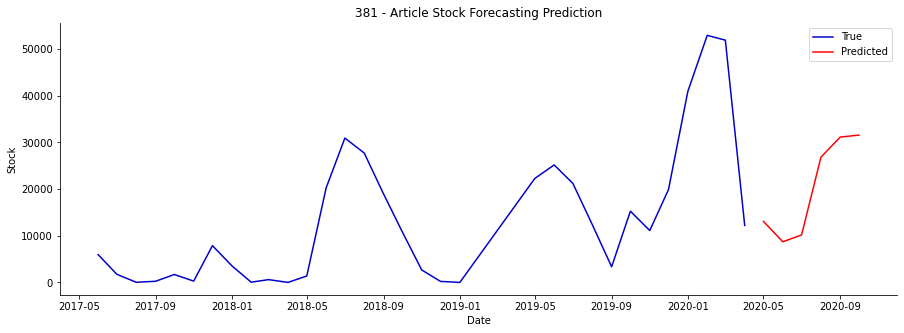

        Date         Stock
0 2020-05-01  13093.350586
1 2020-06-01   8712.798828
2 2020-07-01  10178.124023
3 2020-08-01  26833.500000
4 2020-09-01  31145.791016
5 2020-10-01  31571.402344


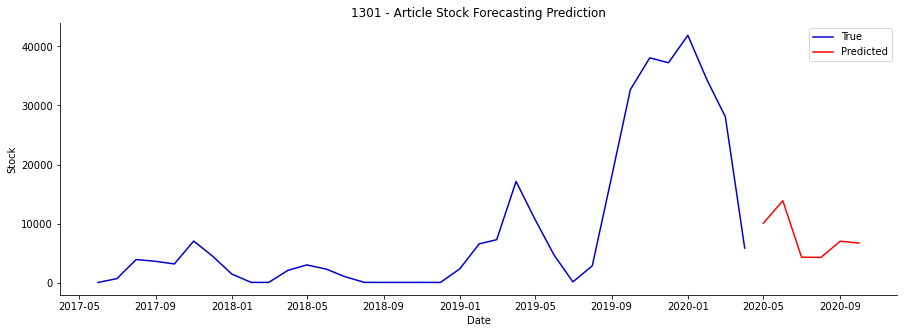

        Date         Stock
0 2020-05-01  10068.259766
1 2020-06-01  13862.890625
2 2020-07-01   4298.279785
3 2020-08-01   4262.662598
4 2020-09-01   7009.408691
5 2020-10-01   6684.978027


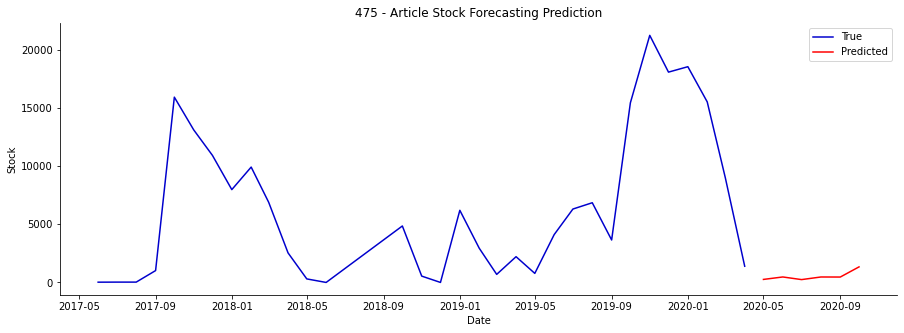

        Date        Stock
0 2020-05-01   261.791687
1 2020-06-01   472.457306
2 2020-07-01   246.793579
3 2020-08-01   470.765411
4 2020-09-01   466.186981
5 2020-10-01  1338.673828


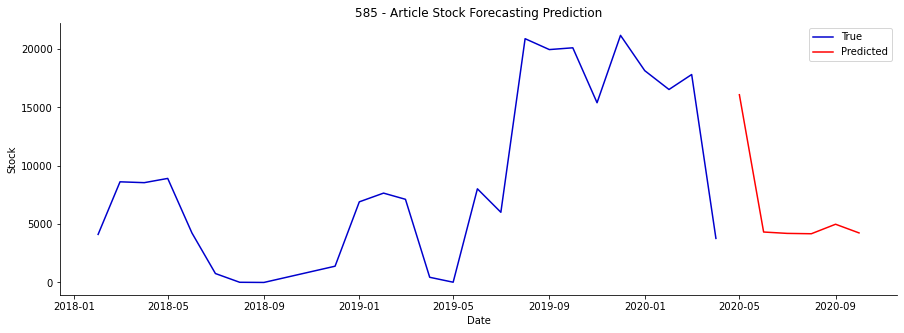

        Date         Stock
0 2020-05-01  16079.889648
1 2020-06-01   4322.830566
2 2020-07-01   4205.142578
3 2020-08-01   4174.158691
4 2020-09-01   4988.315430
5 2020-10-01   4245.288086


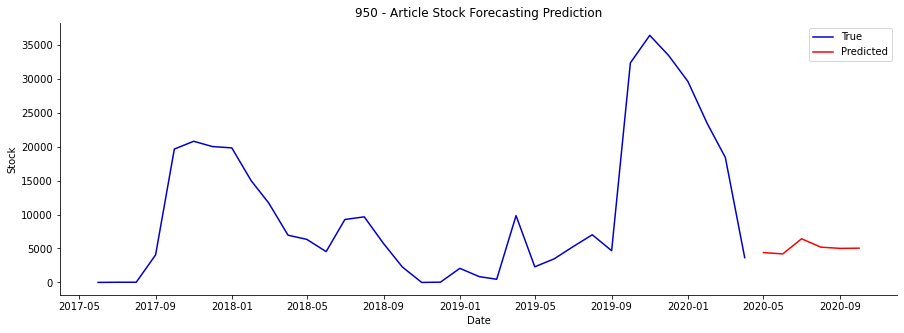

        Date        Stock
0 2020-05-01  4397.281250
1 2020-06-01  4203.212402
2 2020-07-01  6427.468750
3 2020-08-01  5194.681152
4 2020-09-01  5015.915527
5 2020-10-01  5047.762695


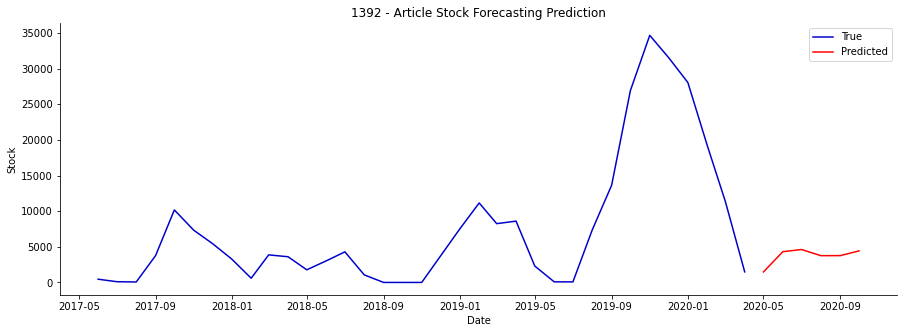

        Date        Stock
0 2020-05-01  1474.046997
1 2020-06-01  4316.463379
2 2020-07-01  4623.384277
3 2020-08-01  3757.591553
4 2020-09-01  3765.591797
5 2020-10-01  4428.838867


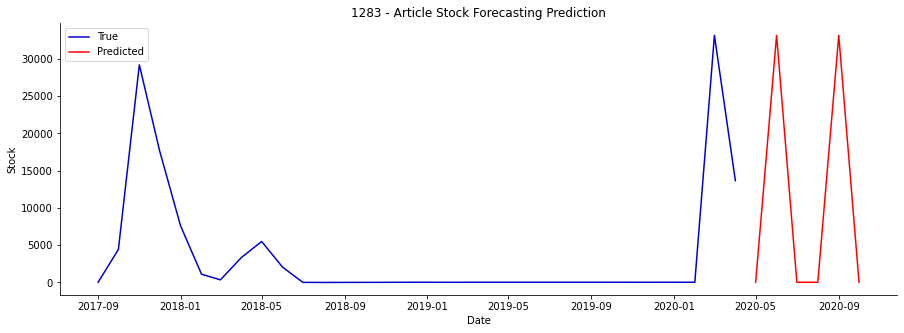

        Date         Stock
0 2020-05-01     29.005226
1 2020-06-01  33157.976562
2 2020-07-01     29.548306
3 2020-08-01     29.251593
4 2020-09-01  33157.968750
5 2020-10-01     29.164925


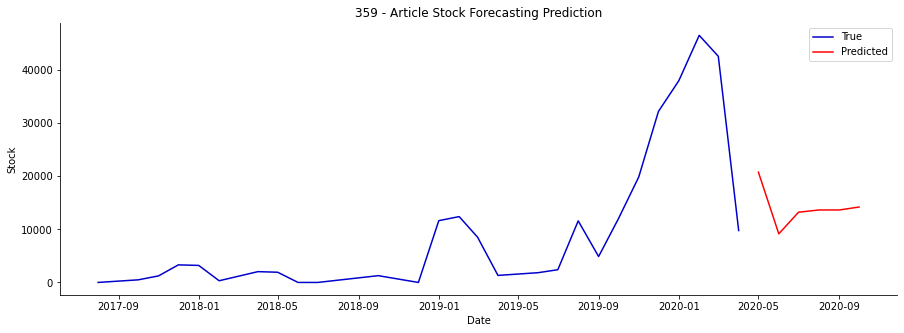

        Date         Stock
0 2020-05-01  20745.414062
1 2020-06-01   9147.128906
2 2020-07-01  13214.042969
3 2020-08-01  13636.073242
4 2020-09-01  13634.902344
5 2020-10-01  14189.721680


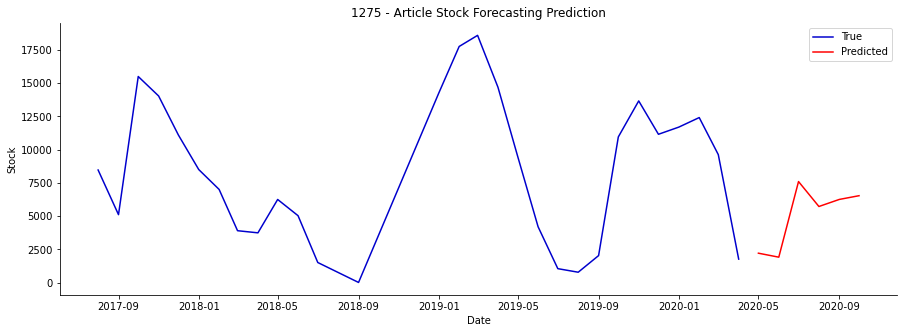

        Date        Stock
0 2020-05-01  2212.618896
1 2020-06-01  1913.057617
2 2020-07-01  7601.825195
3 2020-08-01  5725.514648
4 2020-09-01  6256.932129
5 2020-10-01  6537.382324


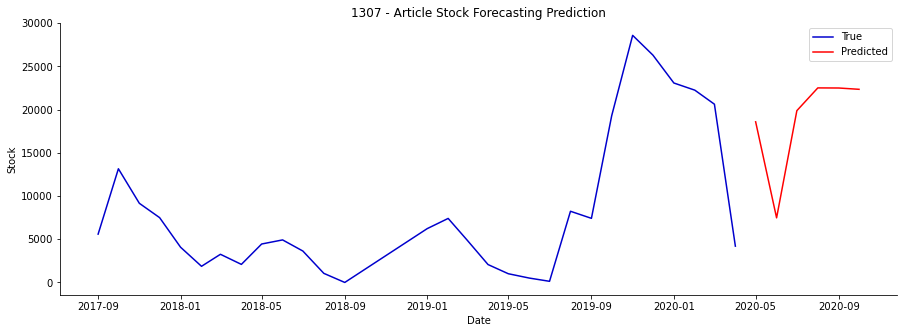

        Date         Stock
0 2020-05-01  18592.736328
1 2020-06-01   7478.484375
2 2020-07-01  19882.068359
3 2020-08-01  22515.195312
4 2020-09-01  22503.449219
5 2020-10-01  22352.533203


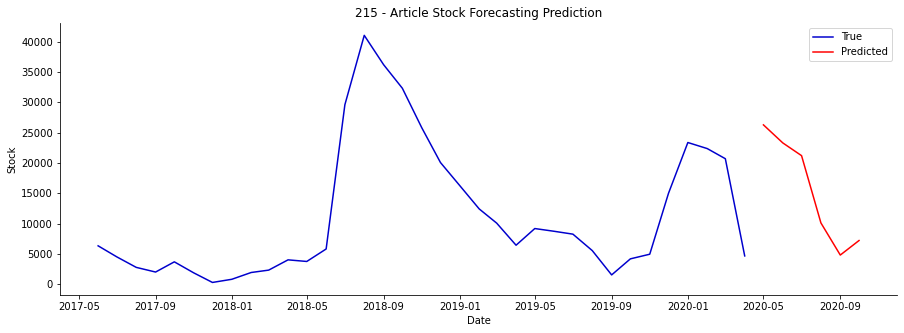

        Date         Stock
0 2020-05-01  26276.099609
1 2020-06-01  23300.333984
2 2020-07-01  21201.664062
3 2020-08-01  10107.275391
4 2020-09-01   4811.698242
5 2020-10-01   7208.714355


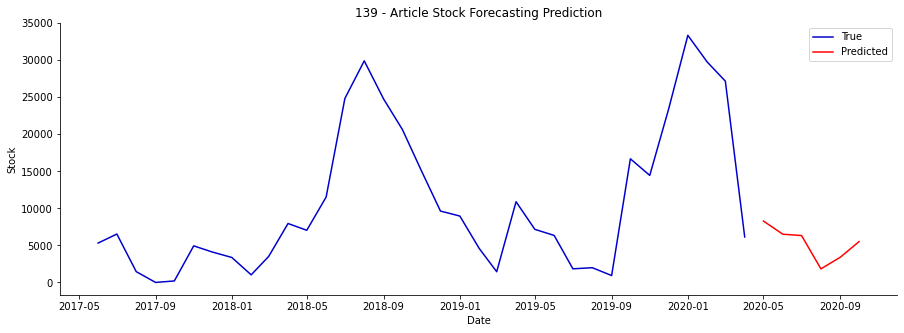

        Date        Stock
0 2020-05-01  8290.195312
1 2020-06-01  6512.980957
2 2020-07-01  6332.301758
3 2020-08-01  1834.698486
4 2020-09-01  3404.674805
5 2020-10-01  5512.651855


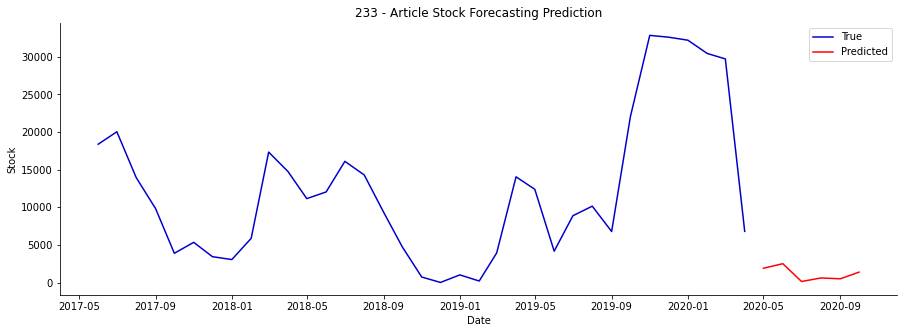

        Date        Stock
0 2020-05-01  1899.738037
1 2020-06-01  2503.906250
2 2020-07-01   135.790771
3 2020-08-01   607.816162
4 2020-09-01   497.795258
5 2020-10-01  1381.920776


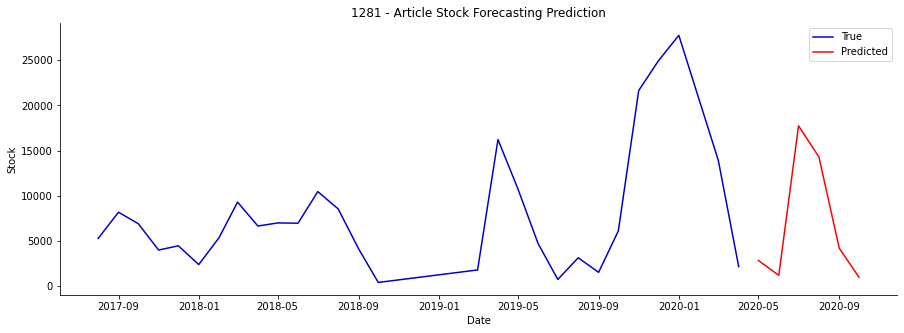

        Date         Stock
0 2020-05-01   2843.656006
1 2020-06-01   1193.618896
2 2020-07-01  17741.650391
3 2020-08-01  14297.313477
4 2020-09-01   4185.716797
5 2020-10-01    985.238831


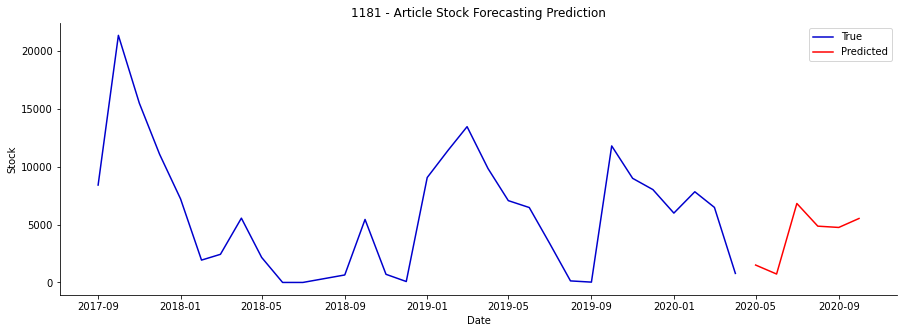

        Date        Stock
0 2020-05-01  1503.365356
1 2020-06-01   727.519043
2 2020-07-01  6815.070312
3 2020-08-01  4858.492676
4 2020-09-01  4747.228516
5 2020-10-01  5522.288086


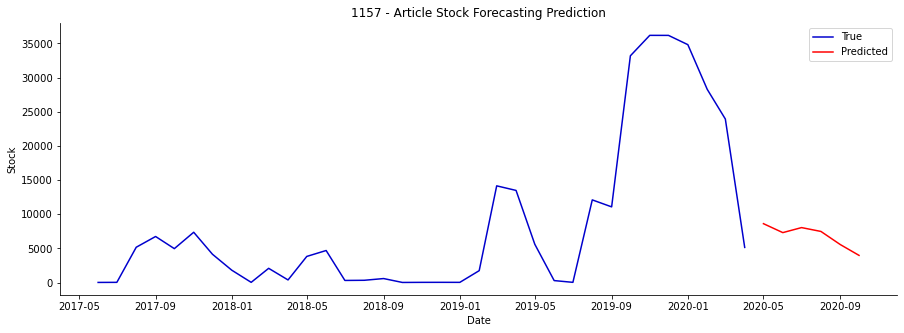

        Date        Stock
0 2020-05-01  8616.829102
1 2020-06-01  7307.716309
2 2020-07-01  8042.445312
3 2020-08-01  7481.326172
4 2020-09-01  5559.915527
5 2020-10-01  3976.983154


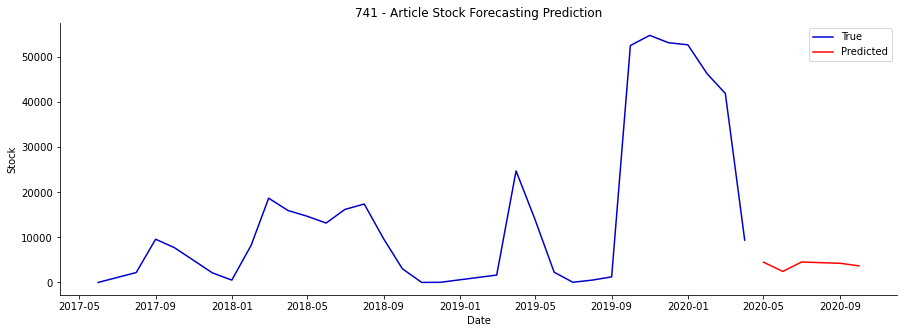

        Date        Stock
0 2020-05-01  4506.118652
1 2020-06-01  2441.006348
2 2020-07-01  4538.173828
3 2020-08-01  4390.167480
4 2020-09-01  4252.523926
5 2020-10-01  3679.957275


In [61]:
for index, row in is_df.iterrows():
    plot_res(is_df.loc[index][4], is_df.loc[index][2], is_df.loc[index]["article"])
    print(is_df.loc[index][4])